<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Stocks/France/Valeo/Valeo_1D_High.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "FR.PA"
data_resample = '1D'
data_label = 'High'
data_label_name = 'y'
start_date = '1 Jan 2009'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = True
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [4]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-01-02,3.54,3.78,3.54,3.67,1.91,1736271
2009-01-05,3.68,3.77,3.55,3.73,1.95,2843871
2009-01-06,3.72,4.07,3.72,4.05,2.12,3290877
2009-01-07,4.01,4.08,3.89,3.94,2.06,2534205
2009-01-08,3.83,3.88,3.77,3.81,1.99,1805292
2009-01-09,3.81,3.98,3.79,3.88,2.03,2070765
2009-01-12,3.83,3.84,3.59,3.59,1.87,4218138
2009-01-13,3.59,3.60,3.36,3.49,1.82,3908988
2009-01-14,3.44,3.51,3.22,3.30,1.72,2195478


,Open,High,Low,Close,Adj Close,Volume
count,2556.000000,2556.000000,2556.000000,2556.000000,2556.000000,2.556000e+03
mean,28.608306,28.951064,28.225927,28.597101,23.168478,1.403209e+06
std,19.080772,19.231949,18.901820,19.070134,18.539994,9.440100e+05
min,2.740000,2.820000,2.670000,2.710000,1.420000,0.000000e+00
25%,11.670000,11.930000,11.430000,11.707500,6.837500,8.156250e+05
50%,25.420000,25.715000,25.005000,25.340000,19.380000,1.158916e+06
75%,45.807500,46.272500,45.250000,45.795000,37.290000,1.736102e+06
max,67.750000,67.800000,66.020000,67.120000,61.590000,1.494212e+07


7

In [5]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,7
Number of observations,2556
Total Missing (%),0.0%
Total size in memory,139.9 KiB
Average record size in memory,56.1 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,4


In [6]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

36

In [7]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [8]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

140186

In [9]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,5 hours 33 mins
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,2 months and 8 days
H2O cluster name:,H2O_from_python_unknownUser_1t03yt
H2O cluster total nodes:,1
H2O cluster free memory:,8.98 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"locked, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper right')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.653777,0.641715,0.373844,0.475420,0.226024
1,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.651400,4.545673,0.355601,0.579770,0.336134
2,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.637558,3.034952,0.369990,0.542014,0.293779
3,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.611639,8.074472,0.409687,0.662467,0.438863
4,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.592305,4.919008,0.396037,0.615683,0.379066
5,DeepLearning_1_AutoML_20190827_192349,0.587616,8.305406,0.496403,0.734578,0.539605
6,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.573420,4.059590,0.500000,0.588622,0.346476
7,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.573227,2.731988,0.426805,0.546895,0.299094
8,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.544579,4.769292,0.500000,0.589921,0.348007
9,DeepLearning_grid_1_AutoML_20190827_192349_mod...,0.500000,0.706536,0.500000,0.506630,0.256674


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.007588
1,CDLCLOSINGMARUBOZU,0.583289,0.583289,0.004426
2,CDLLONGLINE,0.572072,0.572072,0.004341
3,DIV,0.457440,0.457440,0.003471
4,STOCHF_fastk,0.448156,0.448156,0.003401
5,STOCHRSI_fastk,0.430265,0.430265,0.003265
6,CDLBELTHOLD,0.408000,0.408000,0.003096
7,WILLR_8,0.386715,0.386715,0.002934
8,SUB,0.379441,0.379441,0.002879
9,CDLENGULFING,0.363293,0.363293,0.002757


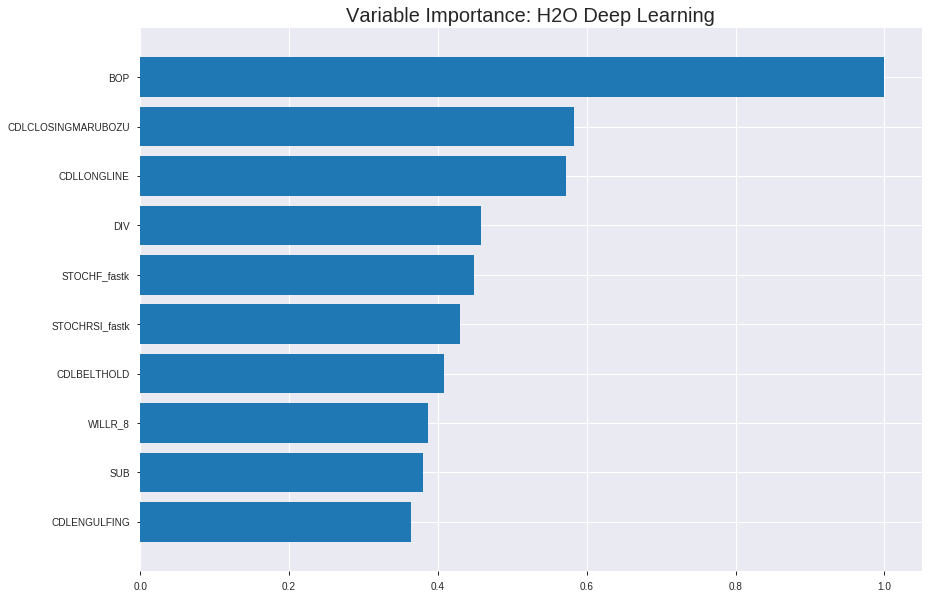

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_192349_model_5


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19658408951023942
RMSE: 0.44337804355903715
LogLoss: 0.5743881526180513
Mean Per-Class Error: 0.296887396410196
AUC: 0.7803254650903997
pr_auc: 0.7941267718681161
Gini: 0.5606509301807994
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49485468769579644: 


,0,1,Error,Rate
0,422.0,388.0,0.479,(388.0/810.0)
1,118.0,825.0,0.1251,(118.0/943.0)
Total,540.0,1213.0,0.2886,(506.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4948547,0.7653061,215.0
max f2,0.3063188,0.8747888,309.0
max f0point5,0.5671593,0.7284916,163.0
max accuracy,0.4948547,0.7113520,215.0
max precision,0.9985047,1.0,0.0
max recall,0.0694371,1.0,385.0
max specificity,0.9985047,1.0,0.0
max absolute_mcc,0.4948547,0.4274717,215.0
max min_per_class_accuracy,0.5644553,0.6998940,166.0
max mean_per_class_accuracy,0.5671593,0.7031126,163.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 52.56 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.9502974,1.8589608,1.8589608,1.0,0.9791174,1.0,0.9791174,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8842849,1.8589608,1.8589608,1.0,0.9105888,1.0,0.9448531,0.0190880,0.0381760,85.8960764,85.8960764
,3,0.0302339,0.8473385,1.8589608,1.8589608,1.0,0.8680223,1.0,0.9202093,0.0180276,0.0562036,85.8960764,85.8960764
,4,0.0405020,0.8105694,1.7556852,1.8327782,0.9444444,0.8299560,0.9859155,0.8973282,0.0180276,0.0742312,75.5685166,83.2778218
,5,0.0501997,0.7715991,1.8589608,1.8378362,1.0,0.7894243,0.9886364,0.8764831,0.0180276,0.0922587,85.8960764,83.7836209
,6,0.1003993,0.6625707,1.5843416,1.7110889,0.8522727,0.7036932,0.9204545,0.7900881,0.0795334,0.1717922,58.4341560,71.1088885
,7,0.1500285,0.6279332,1.3675114,1.5974340,0.7356322,0.6417105,0.8593156,0.7410051,0.0678685,0.2396607,36.7511366,59.7433964
,8,0.2002282,0.6149166,1.4998433,1.5729668,0.8068182,0.6212181,0.8461538,0.7109730,0.0752916,0.3149523,49.9843343,57.2966800
,9,0.3000570,0.5986196,1.3065839,1.4843413,0.7028571,0.6059755,0.7984791,0.6760404,0.1304348,0.4453871,30.6583851,48.4341294
,10,0.3998859,0.5863733,1.2322254,1.4214022,0.6628571,0.5927155,0.7646220,0.6552389,0.1230117,0.5683987,23.2225420,42.1402239




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2376665063344758
RMSE: 0.48751051920392013
LogLoss: 0.6671808969967109
Mean Per-Class Error: 0.42278013867143815
AUC: 0.5996820781544556
pr_auc: 0.6051789201558455
Gini: 0.19936415630891124
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40857834698977386: 


,0,1,Error,Rate
0,29.0,209.0,0.8782,(209.0/238.0)
1,4.0,259.0,0.0152,(4.0/263.0)
Total,33.0,468.0,0.4251,(213.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4085783,0.7086183,220.0
max f2,0.3308072,0.8556499,231.0
max f0point5,0.5110511,0.6164384,179.0
max accuracy,0.5318948,0.5928144,161.0
max precision,0.6444821,1.0,0.0
max recall,0.2780499,1.0,242.0
max specificity,0.6444821,1.0,0.0
max absolute_mcc,0.3657874,0.2154871,226.0
max min_per_class_accuracy,0.5770895,0.3235294,123.0
max mean_per_class_accuracy,0.5318948,0.5772199,161.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 55.40 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.6414249,1.2699620,1.2699620,0.6666667,0.6433363,0.6666667,0.6433363,0.0152091,0.0152091,26.9961977,26.9961977
,2,0.0219561,0.6349752,1.1429658,1.2122364,0.6,0.6380098,0.6363636,0.6409151,0.0114068,0.0266160,14.2965779,21.2236433
,3,0.0319361,0.6338444,1.5239544,1.3096483,0.8,0.6342816,0.6875,0.6388422,0.0152091,0.0418251,52.3954373,30.9648289
,4,0.0419162,0.6302605,1.1429658,1.2699620,0.6,0.6309615,0.6666667,0.6369658,0.0114068,0.0532319,14.2965779,26.9961977
,5,0.0518962,0.6270389,1.5239544,1.3188067,0.8,0.6279875,0.6923077,0.6352392,0.0152091,0.0684411,52.3954373,31.8806669
,6,0.1017964,0.6174968,0.9143726,1.1205547,0.48,0.6229549,0.5882353,0.6292175,0.0456274,0.1140684,-8.5627376,12.0554686
,7,0.1516966,0.6123349,1.1429658,1.1279268,0.6,0.6145705,0.5921053,0.6243994,0.0570342,0.1711027,14.2965779,12.7926756
,8,0.2015968,0.5984659,1.6001521,1.2448142,0.84,0.6056359,0.6534653,0.6197550,0.0798479,0.2509506,60.0152091,24.4814215
,9,0.7405190,0.5770895,1.0159696,1.0782696,0.5333333,0.5781250,0.5660377,0.5894583,0.5475285,0.7984791,1.5969582,7.8269603
,10,0.8003992,0.5425790,1.1429658,1.0831097,0.6,0.5591675,0.5685786,0.5871921,0.0684411,0.8669202,14.2965779,8.3109716



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 19:32:45,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 19:32:47,3 min 59.320 sec,313 obs/sec,0.2869367,1,503.0,0.7107161,4.2330598,-1.0321671,0.5882958,0.6251657,1.4458584,0.4620650,0.7087511,11.5363316,-1.0143282,0.5178691,0.2729772,1.0075731,0.4510978
,2019-08-27 19:33:11,4 min 23.259 sec,394 obs/sec,5.2190531,18,9149.0,0.4830370,0.6584376,0.0612977,0.6823560,0.7146942,1.8589608,0.3953223,0.4995989,0.6923471,-0.0008886,0.4877145,0.4913324,0.9524715,0.4750499
,2019-08-27 19:33:35,4 min 47.439 sec,443 obs/sec,11.3896178,39,19966.0,0.4813945,0.6545264,0.0676705,0.6429140,0.6806067,1.8589608,0.3645180,0.4996564,0.6924627,-0.0011189,0.5,0.0,1.0,0.4750499
,2019-08-27 19:33:59,5 min 11.319 sec,494 obs/sec,18.7758129,64,32914.0,0.4576790,0.6023131,0.1572687,0.7188190,0.7378967,1.7556852,0.3513976,0.5045283,0.7036803,-0.0207370,0.5503003,0.6040652,1.5874525,0.4750499
,2019-08-27 19:34:22,5 min 34.507 sec,506 obs/sec,25.2749572,86,44307.0,0.4429310,0.5725373,0.2107050,0.7669540,0.7796530,1.8589608,0.2949230,0.5426833,2.8587218,-0.1809613,0.5975892,0.5092865,0.8303598,0.3692615
,2019-08-27 19:34:46,5 min 58.063 sec,513 obs/sec,31.8311466,108,55800.0,0.4433780,0.5743882,0.2091111,0.7803255,0.7941268,1.8589608,0.2886480,0.4875105,0.6671809,0.0469609,0.5996821,0.6051789,1.2699620,0.4251497
,2019-08-27 19:35:09,6 min 21.263 sec,515 obs/sec,38.1055334,129,66799.0,0.4338962,0.5508582,0.2425765,0.7817950,0.7990166,1.8589608,0.2983457,0.6105824,7.6206195,-0.4949662,0.5416813,0.5838829,1.2699620,0.4750499
,2019-08-27 19:35:11,6 min 23.626 sec,515 obs/sec,38.1055334,129,66799.0,0.4433780,0.5743882,0.2091111,0.7803255,0.7941268,1.8589608,0.2886480,0.4875105,0.6671809,0.0469609,0.5996821,0.6051789,1.2699620,0.4251497


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0075880
CDLCLOSINGMARUBOZU,0.5832891,0.5832891,0.0044260
CDLLONGLINE,0.5720722,0.5720722,0.0043409
DIV,0.4574398,0.4574398,0.0034711
STOCHF_fastk,0.4481555,0.4481555,0.0034006
---,---,---,---
BBANDS_lowerband_12_7_3,0.0982397,0.0982397,0.0007454
BBANDS_middleband_8_6_4,0.0972883,0.0972883,0.0007382
BBANDS_middleband_8_1_4,0.0971851,0.0971851,0.0007374
MA_24_2,0.0966743,0.0966743,0.0007336



See the whole table with table.as_data_frame()


('accuracy', 0.6254980079681275)

('F1', 0.6709677419354839)

('auc', 0.6537769784172662)

('logloss', 0.6417147601246874)

('mean_per_class_error', 0.3528712744090442)

('rmse', 0.4754196699220833)

('mse', 0.22602386254882262)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


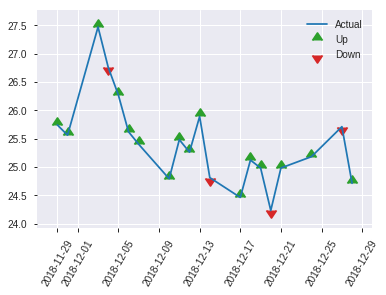


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.22602386254882262
RMSE: 0.4754196699220833
LogLoss: 0.6417147601246874
Mean Per-Class Error: 0.3528712744090442
AUC: 0.6537769784172662
pr_auc: 0.5651025750365255
Gini: 0.30755395683453246
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3802538480309218: 


,0,1,Error,Rate
0,45.0,94.0,0.6763,(94.0/139.0)
1,8.0,104.0,0.0714,(8.0/112.0)
Total,53.0,198.0,0.4064,(102.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3802538,0.6709677,127.0
max f2,0.3198685,0.8207831,145.0
max f0point5,0.4786947,0.59375,101.0
max accuracy,0.4786947,0.6254980,101.0
max precision,0.9636682,1.0,0.0
max recall,0.1659612,1.0,179.0
max specificity,0.9636682,1.0,0.0
max absolute_mcc,0.4786947,0.3149678,101.0
max min_per_class_accuracy,0.5735991,0.5982143,51.0
max mean_per_class_accuracy,0.4786947,0.6471287,101.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 49.91 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.6665681,2.2410714,2.2410714,1.0,0.8259680,1.0,0.8259680,0.0267857,0.0267857,124.1071429,124.1071429
,2,0.0239044,0.6297991,1.4940476,1.8675595,0.6666667,0.6333838,0.8333333,0.7296759,0.0178571,0.0446429,49.4047619,86.7559524
,3,0.0318725,0.6264005,1.1205357,1.6808036,0.5,0.6284488,0.75,0.7043691,0.0089286,0.0535714,12.0535714,68.0803571
,4,0.0438247,0.6210094,0.7470238,1.4261364,0.3333333,0.6232928,0.6363636,0.6822574,0.0089286,0.0625,-25.2976190,42.6136364
,5,0.0517928,0.6132758,1.1205357,1.3791209,0.5,0.6138927,0.6153846,0.6717398,0.0089286,0.0714286,12.0535714,37.9120879
,6,0.1035857,0.5999462,1.3791209,1.3791209,0.6153846,0.6063391,0.6153846,0.6390394,0.0714286,0.1428571,37.9120879,37.9120879
,7,0.1513944,0.5809279,0.9337798,1.2384868,0.4166667,0.5904494,0.5526316,0.6236952,0.0446429,0.1875,-6.6220238,23.8486842
,8,0.4501992,0.5770895,1.2251190,1.2296144,0.5466667,0.5771972,0.5486726,0.5928337,0.3660714,0.5535714,22.5119048,22.9614412
,9,0.5019920,0.5670855,1.2067308,1.2272534,0.5384615,0.5732243,0.5476190,0.5908105,0.0625,0.6160714,20.6730769,22.7253401
,10,0.6015936,0.5363820,1.0757143,1.2021641,0.48,0.5549389,0.5364238,0.5848715,0.1071429,0.7232143,7.5714286,20.2164144


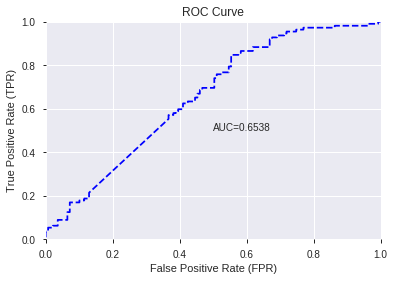

This function is available for GLM models only


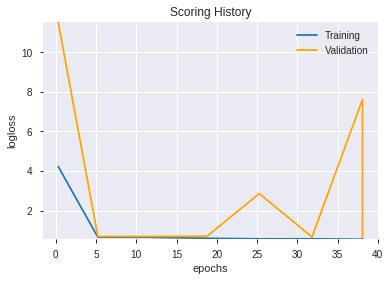

--2019-08-27 19:49:56--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.128.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.128.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


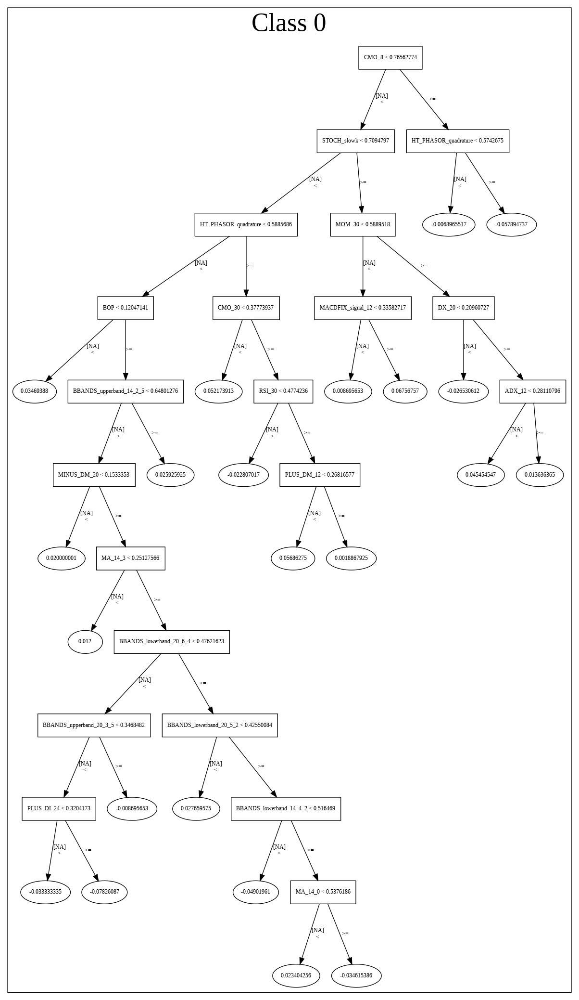

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_192349_model_5',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_192349_model_5',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [11]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_195004_model_6,0.761241,0.609932,0.304374,0.456624,0.208506
1,DeepLearning_grid_1_AutoML_20190827_195004_model_9,0.748394,0.620735,0.303507,0.462391,0.213805
2,DeepLearning_grid_1_AutoML_20190827_195004_model_8,0.741842,0.629830,0.311697,0.462850,0.214230
3,DeepLearning_1_AutoML_20190827_195004,0.739979,0.769288,0.306237,0.499078,0.249078
4,DeepLearning_grid_1_AutoML_20190827_195004_model_3,0.737410,0.837683,0.330421,0.468014,0.219037
5,DeepLearning_grid_1_AutoML_20190827_195004_model_7,0.735162,0.651529,0.318891,0.458289,0.210029
6,DeepLearning_grid_1_AutoML_20190827_195004_model_5,0.732721,0.651754,0.301644,0.459781,0.211398
7,DeepLearning_grid_1_AutoML_20190827_195004_model_4,0.726105,0.830958,0.323227,0.482739,0.233037
8,DeepLearning_grid_1_AutoML_20190827_195004_model_2,0.719296,0.968511,0.338097,0.513530,0.263713
9,DeepLearning_grid_1_AutoML_20190827_195004_model_1,0.718846,0.987418,0.324094,0.505091,0.255117


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.033690
1,CDLCLOSINGMARUBOZU,0.798329,0.798329,0.026896
2,DIV,0.708269,0.708269,0.023862
3,CDLLONGLINE,0.628149,0.628149,0.021162
4,CDLHANGINGMAN,0.622212,0.622212,0.020962
5,STOCHF_fastk,0.619491,0.619491,0.020871
6,CDLSHORTLINE,0.618192,0.618192,0.020827
7,CDLENGULFING,0.616474,0.616474,0.020769
8,SAREXT,0.612925,0.612925,0.020649
9,dayofweek,0.611291,0.611291,0.020594


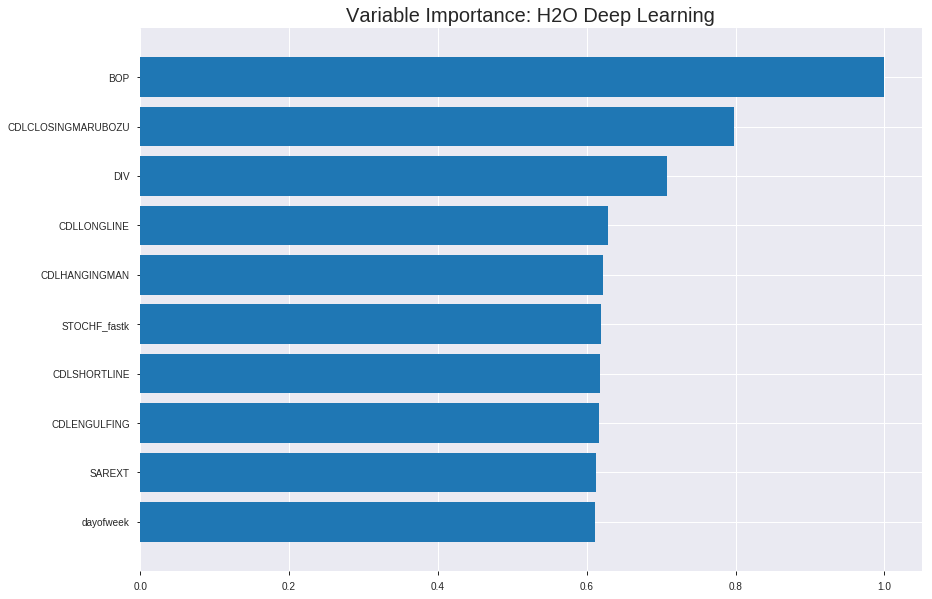

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_195004_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1870177840029909
RMSE: 0.4324555283529058
LogLoss: 0.5515486059682997
Mean Per-Class Error: 0.2814081667386722
AUC: 0.788550462799314
pr_auc: 0.7917256933926937
Gini: 0.5771009255986279
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4071354439842303: 


,0,1,Error,Rate
0,359.0,451.0,0.5568,(451.0/810.0)
1,81.0,862.0,0.0859,(81.0/943.0)
Total,440.0,1313.0,0.3035,(532.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4071354,0.7641844,266.0
max f2,0.2216923,0.8751192,319.0
max f0point5,0.6180971,0.7403456,178.0
max accuracy,0.5877030,0.7210496,193.0
max precision,0.9812112,1.0,0.0
max recall,0.0130871,1.0,395.0
max specificity,0.9812112,1.0,0.0
max absolute_mcc,0.6180971,0.4369315,178.0
max min_per_class_accuracy,0.6302141,0.7104984,172.0
max mean_per_class_accuracy,0.6180971,0.7185918,178.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 57.17 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.9653471,1.7556852,1.7556852,0.9444444,0.9722144,0.9444444,0.9722144,0.0180276,0.0180276,75.5685166,75.5685166
,2,0.0205362,0.9553941,1.7556852,1.7556852,0.9444444,0.9593704,0.9444444,0.9657924,0.0180276,0.0360551,75.5685166,75.5685166
,3,0.0302339,0.9456039,1.6402595,1.7186618,0.8823529,0.9505312,0.9245283,0.9608973,0.0159067,0.0519618,64.0259497,71.8661838
,4,0.0405020,0.9328229,1.4458584,1.6495004,0.7777778,0.9397315,0.8873239,0.9555313,0.0148462,0.0668081,44.5858372,64.9500396
,5,0.0501997,0.9228018,1.7496101,1.6688398,0.9411765,0.9267958,0.8977273,0.9499801,0.0169671,0.0837752,74.9610130,66.8839776
,6,0.1003993,0.8684285,1.6265907,1.6477152,0.875,0.8976800,0.8863636,0.9238301,0.0816543,0.1654295,62.6590668,64.7715222
,7,0.1500285,0.8356736,1.5384503,1.6115705,0.8275862,0.8524281,0.8669202,0.9002104,0.0763521,0.2417815,53.8450287,61.1570548
,8,0.2002282,0.8026737,1.5209679,1.5888554,0.8181818,0.8182891,0.8547009,0.8796717,0.0763521,0.3181336,52.0967897,58.8855353
,9,0.3000570,0.7480038,1.3703196,1.5161486,0.7371429,0.7763868,0.8155894,0.8453089,0.1367975,0.4549311,37.0319649,51.6148608
,10,0.3998859,0.7000190,1.2428481,1.4479209,0.6685714,0.7227967,0.7788873,0.8147245,0.1240721,0.5790032,24.2848053,44.7920937




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.21393761330976108
RMSE: 0.4625339050380643
LogLoss: 0.6212039443040445
Mean Per-Class Error: 0.32195577850912227
AUC: 0.7236955618749401
pr_auc: 0.7128929015498688
Gini: 0.4473911237498802
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44292027050444366: 


,0,1,Error,Rate
0,109.0,129.0,0.542,(129.0/238.0)
1,31.0,232.0,0.1179,(31.0/263.0)
Total,140.0,361.0,0.3194,(160.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4429203,0.7435897,276.0
max f2,0.0707986,0.8634274,374.0
max f0point5,0.6027389,0.6921413,210.0
max accuracy,0.6027389,0.6806387,210.0
max precision,0.9777426,1.0,0.0
max recall,0.0707986,1.0,374.0
max specificity,0.9777426,1.0,0.0
max absolute_mcc,0.4429203,0.3785047,276.0
max min_per_class_accuracy,0.6408259,0.6680672,188.0
max mean_per_class_accuracy,0.6027389,0.6780442,210.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 57.67 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.9628633,1.9049430,1.9049430,1.0,0.9683589,1.0,0.9683589,0.0228137,0.0228137,90.4942966,90.4942966
,2,0.0219561,0.9506900,1.5239544,1.7317663,0.8,0.9568279,0.9090909,0.9631175,0.0152091,0.0380228,52.3954373,73.1766333
,3,0.0319361,0.9443887,1.5239544,1.6668251,0.8,0.9480911,0.875,0.9584218,0.0152091,0.0532319,52.3954373,66.6825095
,4,0.0419162,0.9391832,1.9049430,1.7235198,1.0,0.9408179,0.9047619,0.9542304,0.0190114,0.0722433,90.4942966,72.3519826
,5,0.0518962,0.9282533,1.1429658,1.6118748,0.6,0.9343708,0.8461538,0.9504112,0.0114068,0.0836502,14.2965779,61.1874817
,6,0.1017964,0.8711079,1.3715589,1.4940729,0.72,0.9022150,0.7843137,0.9267856,0.0684411,0.1520913,37.1558935,49.4072914
,7,0.1516966,0.8246453,1.3715589,1.4537723,0.72,0.8502448,0.7631579,0.9016078,0.0684411,0.2205323,37.1558935,45.3772263
,8,0.2015968,0.7909055,1.2953612,1.4145616,0.68,0.8088147,0.7425743,0.8786392,0.0646388,0.2851711,29.5361217,41.4561608
,9,0.3013972,0.7375986,1.2191635,1.3498602,0.64,0.7612392,0.7086093,0.8397650,0.1216730,0.4068441,21.9163498,34.9860247
,10,0.4011976,0.6982941,1.2572624,1.3268259,0.66,0.7174676,0.6965174,0.8093428,0.1254753,0.5323194,25.7262357,32.6825946



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 19:53:16,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 19:53:18,1 min 27.119 sec,896 obs/sec,0.9931546,1,1741.0,0.5084985,0.9615854,-0.0402709,0.7576339,0.7591464,1.7556852,0.3228751,0.5475579,1.0715759,-0.2022721,0.7102598,0.6939836,1.9049430,0.3333333
,2019-08-27 19:53:24,1 min 33.130 sec,1642 obs/sec,6.9463776,7,12177.0,0.4324555,0.5515486,0.2475979,0.7885505,0.7917257,1.7556852,0.3034797,0.4625339,0.6212039,0.1421134,0.7236956,0.7128929,1.9049430,0.3193613
,2019-08-27 19:53:30,1 min 39.003 sec,2187 obs/sec,15.8841985,16,27845.0,0.4243826,0.5330858,0.2754269,0.8044709,0.8108325,1.8589608,0.2880776,0.4671127,0.6340577,0.1250441,0.7151245,0.6983474,1.5874525,0.3253493
,2019-08-27 19:53:36,1 min 45.010 sec,2492 obs/sec,25.8037650,26,45234.0,0.4185167,0.5204735,0.2953186,0.8128713,0.8201724,1.8589608,0.2783799,0.4670482,0.6430893,0.1252860,0.7165064,0.6977925,1.5874525,0.3273453
,2019-08-27 19:53:43,1 min 51.371 sec,2694 obs/sec,36.7233314,37,64376.0,0.4158401,0.5157371,0.3043033,0.8245100,0.8325526,1.8589608,0.2561323,0.4759324,0.6775536,0.0916916,0.7116097,0.6934412,1.5874525,0.3612774
,2019-08-27 19:53:49,1 min 57.627 sec,2822 obs/sec,47.6434683,48,83519.0,0.4052538,0.4931026,0.3392743,0.8404193,0.8475066,1.8589608,0.2441529,0.4766816,0.6818543,0.0888299,0.7086941,0.6872973,1.5874525,0.3672655
,2019-08-27 19:53:55,2 min 3.269 sec,2909 obs/sec,57.5710211,58,100922.0,0.3962733,0.4748633,0.3682332,0.8518885,0.8591874,1.8589608,0.2350257,0.4752718,0.6684867,0.0942113,0.7070806,0.6908870,1.5874525,0.3353293
,2019-08-27 19:53:55,2 min 3.839 sec,2907 obs/sec,57.5710211,58,100922.0,0.4324555,0.5515486,0.2475979,0.7885505,0.7917257,1.7556852,0.3034797,0.4625339,0.6212039,0.1421134,0.7236956,0.7128929,1.9049430,0.3193613


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0336901
CDLCLOSINGMARUBOZU,0.7983292,0.7983292,0.0268958
DIV,0.7082694,0.7082694,0.0238617
CDLLONGLINE,0.6281494,0.6281494,0.0211624
CDLHANGINGMAN,0.6222121,0.6222121,0.0209624
---,---,---,---
weekofyear,0.5467750,0.5467750,0.0184209
SUB,0.5455804,0.5455804,0.0183807
aroonup_12,0.5370387,0.5370387,0.0180929
weekday_name,0.5353994,0.5353994,0.0180377



See the whole table with table.as_data_frame()


('accuracy', 0.7051792828685259)

('F1', 0.7054545454545456)

('auc', 0.7612410071942446)

('logloss', 0.6099321898962946)

('mean_per_class_error', 0.29766187050359716)

('rmse', 0.45662442835980943)

('mse', 0.20850586857492276)

deeplearning prediction progress: |███████████████████████████████████████| 100%


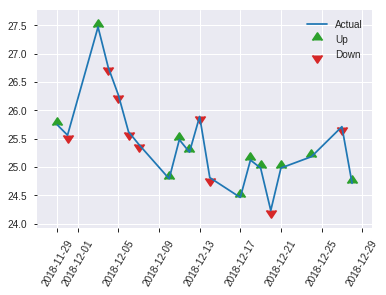


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.20850586857492276
RMSE: 0.45662442835980943
LogLoss: 0.6099321898962946
Mean Per-Class Error: 0.29766187050359716
AUC: 0.7612410071942446
pr_auc: 0.6988907600625185
Gini: 0.5224820143884892
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49124300242256336: 


,0,1,Error,Rate
0,73.0,66.0,0.4748,(66.0/139.0)
1,15.0,97.0,0.1339,(15.0/112.0)
Total,88.0,163.0,0.3227,(81.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4912430,0.7054545,162.0
max f2,0.0823070,0.8196721,222.0
max f0point5,0.6836953,0.6818182,81.0
max accuracy,0.6836953,0.7051793,81.0
max precision,0.9714475,1.0,0.0
max recall,0.0241637,1.0,247.0
max specificity,0.9714475,1.0,0.0
max absolute_mcc,0.4912430,0.4076027,162.0
max min_per_class_accuracy,0.6185876,0.6875,119.0
max mean_per_class_accuracy,0.5993162,0.7023381,131.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 52.31 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.9454080,1.4940476,1.4940476,0.6666667,0.9596791,0.6666667,0.9596791,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.9190709,2.2410714,1.8675595,1.0,0.9302022,0.8333333,0.9449406,0.0267857,0.0446429,124.1071429,86.7559524
,3,0.0318725,0.9068582,2.2410714,1.9609375,1.0,0.9101971,0.875,0.9362547,0.0178571,0.0625,124.1071429,96.09375
,4,0.0438247,0.8955756,2.2410714,2.0373377,1.0,0.9005605,0.9090909,0.9265200,0.0267857,0.0892857,124.1071429,103.7337662
,5,0.0517928,0.8838225,2.2410714,2.0686813,1.0,0.8903310,0.9230769,0.9209524,0.0178571,0.1071429,124.1071429,106.8681319
,6,0.1035857,0.8306589,1.5515110,1.8100962,0.6923077,0.8558656,0.8076923,0.8884090,0.0803571,0.1875,55.1510989,81.0096154
,7,0.1513944,0.7710670,1.4940476,1.7102914,0.6666667,0.7987874,0.7631579,0.8601075,0.0714286,0.2589286,49.4047619,71.0291353
,8,0.2031873,0.7406662,1.3791209,1.6258754,0.6153846,0.7512396,0.7254902,0.8323568,0.0714286,0.3303571,37.9120879,62.5875350
,9,0.3027888,0.6942056,1.7032143,1.6513158,0.76,0.7175555,0.7368421,0.7945932,0.1696429,0.5,70.3214286,65.1315789
,10,0.4023904,0.6494376,1.0757143,1.5088402,0.48,0.6694041,0.6732673,0.7636058,0.1071429,0.6071429,7.5714286,50.8840170


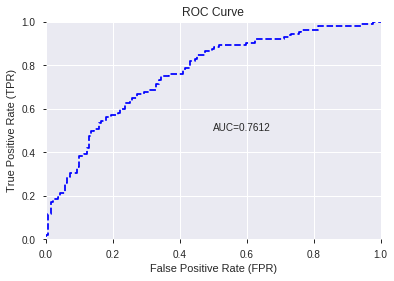

This function is available for GLM models only


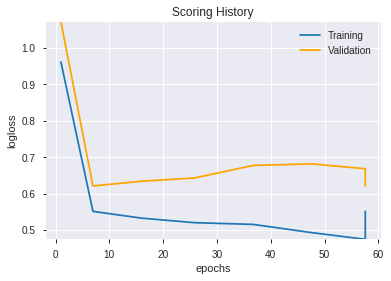

--2019-08-27 19:57:24--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.207.179
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.207.179|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


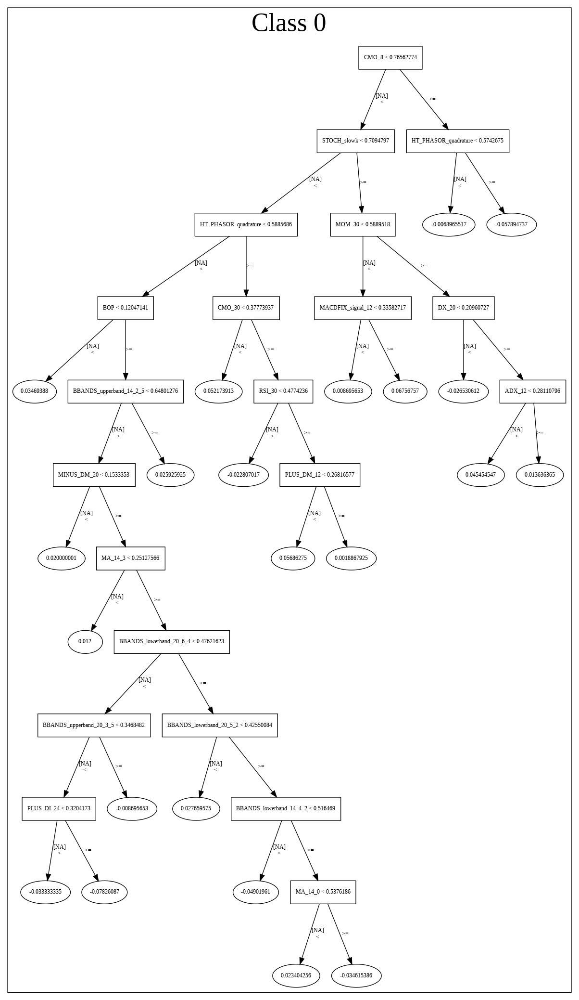

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_195004_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_195004_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'DIV',
 'CDLLONGLINE',
 'CDLHANGINGMAN',
 'STOCHF_fastk',
 'CDLSHORTLINE',
 'CDLENGULFING',
 'SAREXT',
 'dayofweek',
 'STOCHRSI_fastk',
 'CDLDOJI',
 'WILLR_8',
 'CDLMARUBOZU',
 'COS',
 'CDLEVENINGSTAR',
 'CDLBELTHOLD',
 'Volume',
 'CDLTAKURI',
 'aroonup_8',
 'day',
 'CDLDRAGONFLYDOJI',
 'weekday',
 'aroondown_12',
 'TRANGE',
 'SIN',
 'RSI_8',
 'MFI_20',
 'HT_PHASOR_quadrature',
 'CDLMORNINGSTAR',
 'WILLR_12',
 'ADOSC',
 'WILLR_14',
 'CORREL_30',
 'week',
 'CDLLONGLEGGEDDOJI',
 'WILLR_24',
 'quarter',
 'STOCH_slowd',
 'AROONOSC_8',
 'STOCH_slowk',
 'WILLR_30',
 'STOCHF_fastd',
 'STOCHRSI_fastd',
 'aroondown_8',
 'weekofyear',
 'SUB',
 'aroonup_12',
 'weekday_name',
 'ULTOSC']

In [12]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_195732_model_1,0.754432,0.593682,0.298176,0.449716,0.202244


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.367467,1.000000,0.127845
1,CDLCLOSINGMARUBOZU,0.174651,0.475283,0.060763
2,DIV,0.168355,0.458150,0.058572
3,STOCHF_fastk,0.123334,0.335634,0.042909
4,WILLR_8,0.104929,0.285547,0.036506
5,CDLLONGLINE,0.097824,0.266211,0.034034
6,CDLEVENINGSTAR,0.096833,0.263515,0.033689
7,CDLENGULFING,0.086290,0.234824,0.030021
8,STOCHRSI_fastk,0.077869,0.211908,0.027091
9,ULTOSC,0.076209,0.207390,0.026514


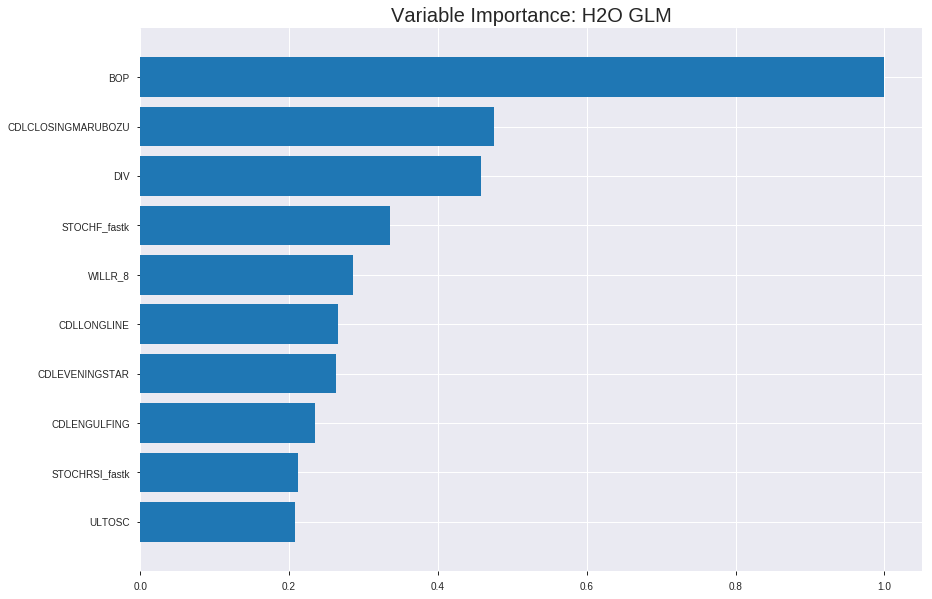

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_195732_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1919096016282709
RMSE: 0.43807488130258154
LogLoss: 0.566260160083285
Null degrees of freedom: 1752
Residual degrees of freedom: 1702
Null deviance: 2420.0736102674464
Residual deviance: 1985.308121251997
AIC: 2087.308121251997
AUC: 0.7764358561460011
pr_auc: 0.7769045889096231
Gini: 0.5528717122920022
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3820823328717105: 


,0,1,Error,Rate
0,336.0,474.0,0.5852,(474.0/810.0)
1,69.0,874.0,0.0732,(69.0/943.0)
Total,405.0,1348.0,0.3098,(543.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3820823,0.7629856,280.0
max f2,0.2497720,0.8713965,336.0
max f0point5,0.5247122,0.7337569,204.0
max accuracy,0.5247122,0.7176269,204.0
max precision,0.9240630,1.0,0.0
max recall,0.1856738,1.0,365.0
max specificity,0.9240630,1.0,0.0
max absolute_mcc,0.5247122,0.4304295,204.0
max min_per_class_accuracy,0.5537239,0.7030753,187.0
max mean_per_class_accuracy,0.5247122,0.7142073,204.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8968970,1.8589608,1.8589608,1.0,0.9103029,1.0,0.9103029,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8731806,1.4458584,1.6524096,0.7777778,0.8846077,0.8888889,0.8974553,0.0148462,0.0339343,44.5858372,65.2409568
,3,0.0302339,0.8567046,1.7496101,1.6835871,0.9411765,0.8654866,0.9056604,0.8872012,0.0169671,0.0509014,74.9610130,68.3587107
,4,0.0405020,0.8448966,1.5491340,1.6495004,0.8333333,0.8516353,0.8873239,0.8781845,0.0159067,0.0668081,54.9133970,64.9500396
,5,0.0501997,0.8310196,1.7496101,1.6688398,0.9411765,0.8376956,0.8977273,0.8703628,0.0169671,0.0837752,74.9610130,66.8839776
,6,0.1003993,0.7848862,1.5843416,1.6265907,0.8522727,0.8063217,0.875,0.8383422,0.0795334,0.1633086,58.4341560,62.6590668
,7,0.1500285,0.7529033,1.4102461,1.5550242,0.7586207,0.7695289,0.8365019,0.8155789,0.0699894,0.2332980,41.0246096,55.5024213
,8,0.2002282,0.7210293,1.4364697,1.5253011,0.7727273,0.7364061,0.8205128,0.7957293,0.0721103,0.3054083,43.6469681,52.5301139
,9,0.3000570,0.6663199,1.3915649,1.4808071,0.7485714,0.6943432,0.7965779,0.7619982,0.1389183,0.4443266,39.1564914,48.0807148
,10,0.3998859,0.6179234,1.2853386,1.4320097,0.6914286,0.6417580,0.7703281,0.7319810,0.1283139,0.5726405,28.5338585,43.2009718




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2100268308563961
RMSE: 0.4582868434249407
LogLoss: 0.6066727498859779
Null degrees of freedom: 500
Residual degrees of freedom: 450
Null deviance: 693.6248861366328
Residual deviance: 607.8860953857499
AIC: 709.8860953857499
AUC: 0.7203965236284627
pr_auc: 0.6984852623339868
Gini: 0.4407930472569255
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3696061334659536: 


,0,1,Error,Rate
0,88.0,150.0,0.6303,(150.0/238.0)
1,21.0,242.0,0.0798,(21.0/263.0)
Total,109.0,392.0,0.3413,(171.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3696061,0.7389313,302.0
max f2,0.2543837,0.8666667,350.0
max f0point5,0.5394372,0.7003745,208.0
max accuracy,0.4828073,0.6886228,242.0
max precision,0.9243528,1.0,0.0
max recall,0.1453603,1.0,382.0
max specificity,0.9243528,1.0,0.0
max absolute_mcc,0.4828073,0.3771788,242.0
max min_per_class_accuracy,0.5505536,0.6680672,198.0
max mean_per_class_accuracy,0.5394372,0.6853452,208.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 53.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8861670,1.5874525,1.5874525,0.8333333,0.9100170,0.8333333,0.9100170,0.0190114,0.0190114,58.7452471,58.7452471
,2,0.0219561,0.8700138,1.5239544,1.5585897,0.8,0.8750401,0.8181818,0.8941184,0.0152091,0.0342205,52.3954373,55.8589699
,3,0.0319361,0.8603014,1.9049430,1.6668251,1.0,0.8649855,0.875,0.8850144,0.0190114,0.0532319,90.4942966,66.6825095
,4,0.0419162,0.8529429,1.1429658,1.5420967,0.6,0.8551172,0.8095238,0.8778960,0.0114068,0.0646388,14.2965779,54.2096687
,5,0.0518962,0.8410599,1.9049430,1.6118748,1.0,0.8466954,0.8461538,0.8718959,0.0190114,0.0836502,90.4942966,61.1874817
,6,0.1017964,0.7885011,1.2953612,1.4567211,0.68,0.8122952,0.7647059,0.8426799,0.0646388,0.1482890,29.5361217,45.6721091
,7,0.1516966,0.7511044,1.3715589,1.4287072,0.72,0.7641194,0.75,0.8168376,0.0684411,0.2167300,37.1558935,42.8707224
,8,0.2015968,0.7254002,1.2191635,1.3768400,0.64,0.7348332,0.7227723,0.7965395,0.0608365,0.2775665,21.9163498,37.6839965
,9,0.3013972,0.6667513,1.2191635,1.3246292,0.64,0.6927276,0.6953642,0.7621647,0.1216730,0.3992395,21.9163498,32.4629215
,10,0.4011976,0.6129159,1.2953612,1.3173486,0.68,0.6383396,0.6915423,0.7313624,0.1292776,0.5285171,29.5361217,31.7348618



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 19:57:32,0.000 sec,2,.22E2,51,1.3602660,1.3688699
,2019-08-27 19:57:32,0.012 sec,4,.14E2,51,1.3500058,1.3608789
,2019-08-27 19:57:32,0.026 sec,6,.86E1,51,1.3358181,1.3497328
,2019-08-27 19:57:32,0.040 sec,8,.53E1,51,1.3172653,1.3349742
,2019-08-27 19:57:32,0.054 sec,10,.33E1,51,1.2943896,1.3165809
,2019-08-27 19:57:32,0.067 sec,12,.21E1,51,1.2679753,1.2952773
,2019-08-27 19:57:32,0.087 sec,14,.13E1,51,1.2396868,1.2728133
,2019-08-27 19:57:32,0.105 sec,16,.79E0,51,1.2118055,1.2516668
,2019-08-27 19:57:32,0.120 sec,18,.49E0,51,1.1863111,1.2342252
,2019-08-27 19:57:32,0.134 sec,20,.31E0,51,1.1645159,1.2219741


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.701195219123506)

('F1', 0.7142857142857143)

('auc', 0.7544321685508736)

('logloss', 0.5936817779600515)

('mean_per_class_error', 0.29592754367934226)

('rmse', 0.44971569504121184)

('mse', 0.20224420636640025)

glm prediction progress: |████████████████████████████████████████████████| 100%


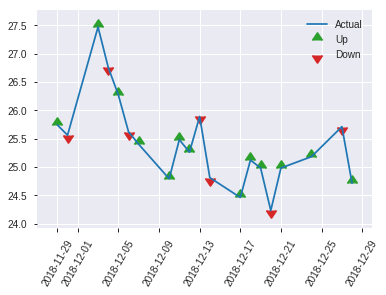


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.20224420636640025
RMSE: 0.44971569504121184
LogLoss: 0.5936817779600515
Null degrees of freedom: 250
Residual degrees of freedom: 200
Null deviance: 353.51374206928267
Residual deviance: 298.02825253594585
AIC: 400.02825253594585
AUC: 0.7544321685508736
pr_auc: 0.6772600837485456
Gini: 0.5088643371017472
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4007339491466925: 


,0,1,Error,Rate
0,71.0,68.0,0.4892,(68.0/139.0)
1,12.0,100.0,0.1071,(12.0/112.0)
Total,83.0,168.0,0.3187,(80.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4007339,0.7142857,167.0
max f2,0.2320993,0.8207831,215.0
max f0point5,0.5957468,0.6651376,80.0
max accuracy,0.5088679,0.7011952,122.0
max precision,0.9218966,1.0,0.0
max recall,0.0602603,1.0,250.0
max specificity,0.9218966,1.0,0.0
max absolute_mcc,0.4007339,0.4265069,167.0
max min_per_class_accuracy,0.5093007,0.6906475,120.0
max mean_per_class_accuracy,0.4804754,0.7040725,135.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 48.81 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.8848497,1.4940476,1.4940476,0.6666667,0.8992559,0.6666667,0.8992559,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.8804248,1.4940476,1.4940476,0.6666667,0.8819456,0.6666667,0.8906007,0.0178571,0.0357143,49.4047619,49.4047619
,3,0.0318725,0.8519710,2.2410714,1.6808036,1.0,0.8573800,0.75,0.8822955,0.0178571,0.0535714,124.1071429,68.0803571
,4,0.0438247,0.8271537,2.2410714,1.8336039,1.0,0.8383766,0.8181818,0.8703176,0.0267857,0.0803571,124.1071429,83.3603896
,5,0.0517928,0.7925518,2.2410714,1.8962912,1.0,0.8073741,0.8461538,0.8606340,0.0178571,0.0982143,124.1071429,89.6291209
,6,0.1035857,0.7357539,1.7239011,1.8100962,0.7692308,0.7613445,0.8076923,0.8109892,0.0892857,0.1875,72.3901099,81.0096154
,7,0.1513944,0.7062984,1.4940476,1.7102914,0.6666667,0.7183067,0.7631579,0.7817211,0.0714286,0.2589286,49.4047619,71.0291353
,8,0.2031873,0.6696837,1.3791209,1.6258754,0.6153846,0.6841712,0.7254902,0.7568554,0.0714286,0.3303571,37.9120879,62.5875350
,9,0.3027888,0.6144387,1.4342857,1.5628524,0.64,0.6430530,0.6973684,0.7194204,0.1428571,0.4732143,43.4285714,56.2852444
,10,0.4023904,0.5638967,1.1653571,1.4644625,0.52,0.5860518,0.6534653,0.6864084,0.1160714,0.5892857,16.5357143,46.4462518


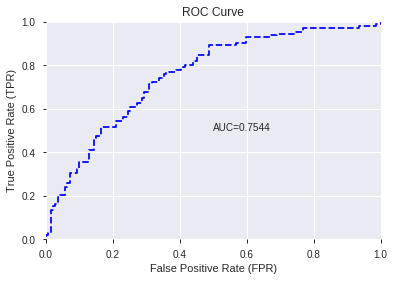

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


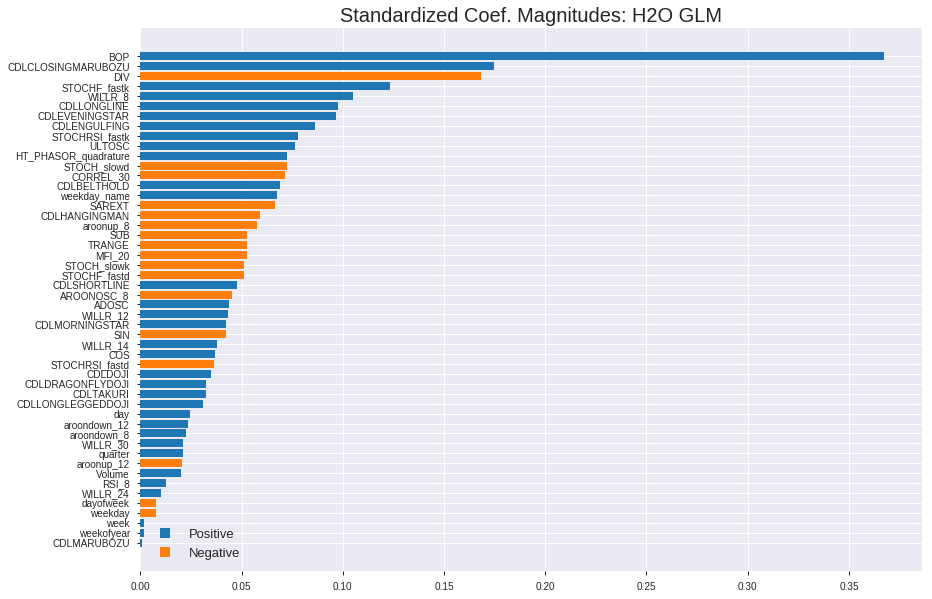

'log_likelihood'
--2019-08-27 19:57:39--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.112.211
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.112.211|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


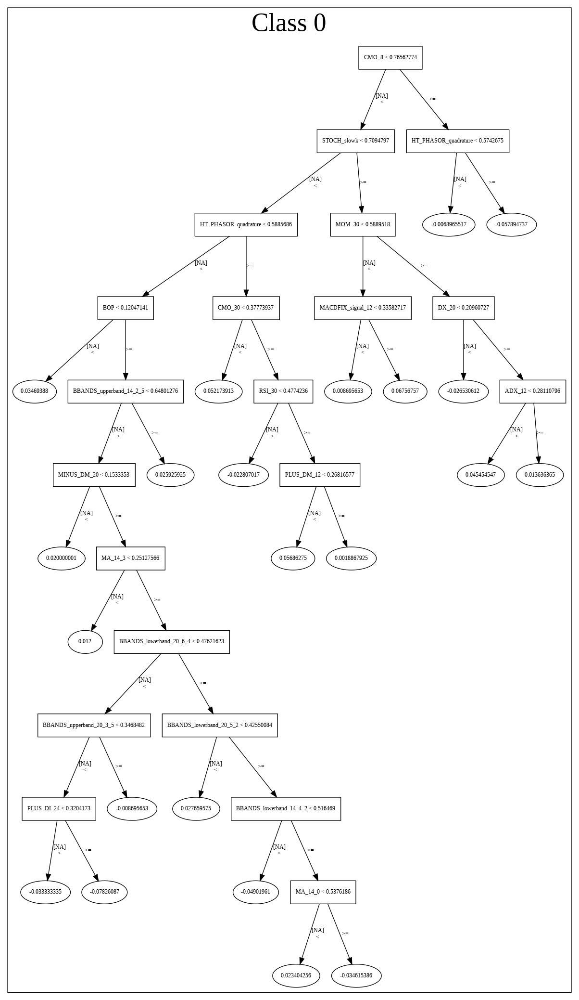

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_195732_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_195732_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['BOP',
 'CDLCLOSINGMARUBOZU',
 'DIV',
 'STOCHF_fastk',
 'WILLR_8',
 'CDLLONGLINE',
 'CDLEVENINGSTAR',
 'CDLENGULFING',
 'STOCHRSI_fastk',
 'ULTOSC',
 'HT_PHASOR_quadrature',
 'STOCH_slowd',
 'CORREL_30',
 'CDLBELTHOLD',
 'weekday_name',
 'SAREXT',
 'CDLHANGINGMAN',
 'aroonup_8',
 'SUB',
 'TRANGE',
 'MFI_20',
 'STOCH_slowk',
 'STOCHF_fastd',
 'CDLSHORTLINE',
 'AROONOSC_8',
 'ADOSC',
 'WILLR_12',
 'CDLMORNINGSTAR',
 'SIN',
 'WILLR_14',
 'COS',
 'STOCHRSI_fastd',
 'CDLDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CDLLONGLEGGEDDOJI',
 'day',
 'aroondown_12',
 'aroondown_8',
 'WILLR_30',
 'quarter',
 'aroonup_12',
 'Volume',
 'RSI_8',
 'WILLR_24',
 'dayofweek',
 'weekday',
 'week',
 'weekofyear',
 'CDLMARUBOZU']

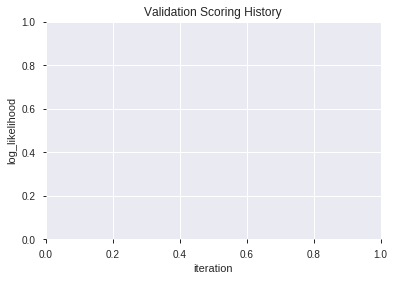

In [13]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190827_195745_model_4,0.757194,0.586052,0.269142,0.446962,0.199775
1,XGBoost_grid_1_AutoML_20190827_195745_model_3,0.753597,0.595780,0.300649,0.452647,0.204889
2,XGBoost_grid_1_AutoML_20190827_195745_model_6,0.752248,0.593350,0.311440,0.451726,0.204057
3,XGBoost_2_AutoML_20190827_195745,0.751991,0.596285,0.284526,0.451818,0.204139
4,XGBoost_grid_1_AutoML_20190827_195745_model_1,0.750835,0.597138,0.309834,0.452998,0.205207
5,XGBoost_grid_1_AutoML_20190827_195745_model_2,0.747109,0.598533,0.303507,0.453370,0.205544
6,XGBoost_grid_1_AutoML_20190827_195745_model_7,0.741200,0.611697,0.319630,0.459393,0.211042
7,XGBoost_1_AutoML_20190827_195745,0.740879,0.599032,0.293455,0.454017,0.206132
8,XGBoost_3_AutoML_20190827_195745,0.738502,0.605770,0.279933,0.456376,0.208279
9,XGBoost_grid_1_AutoML_20190827_195745_model_5,0.722187,0.625510,0.305852,0.465381,0.216580


,variable,relative_importance,scaled_importance,percentage
0,BOP,2653.668945,1.000000,0.520971
1,DIV,362.802917,0.136717,0.071226
2,STOCHF_fastk,282.667450,0.106519,0.055494
3,SUB,142.726074,0.053784,0.028020
4,HT_PHASOR_quadrature,127.183289,0.047927,0.024969
5,WILLR_8,121.977448,0.045966,0.023947
6,SAREXT,103.271072,0.038916,0.020274
7,CORREL_30,102.709084,0.038705,0.020164
8,aroonup_8,91.696098,0.034554,0.018002
9,week,84.581024,0.031873,0.016605


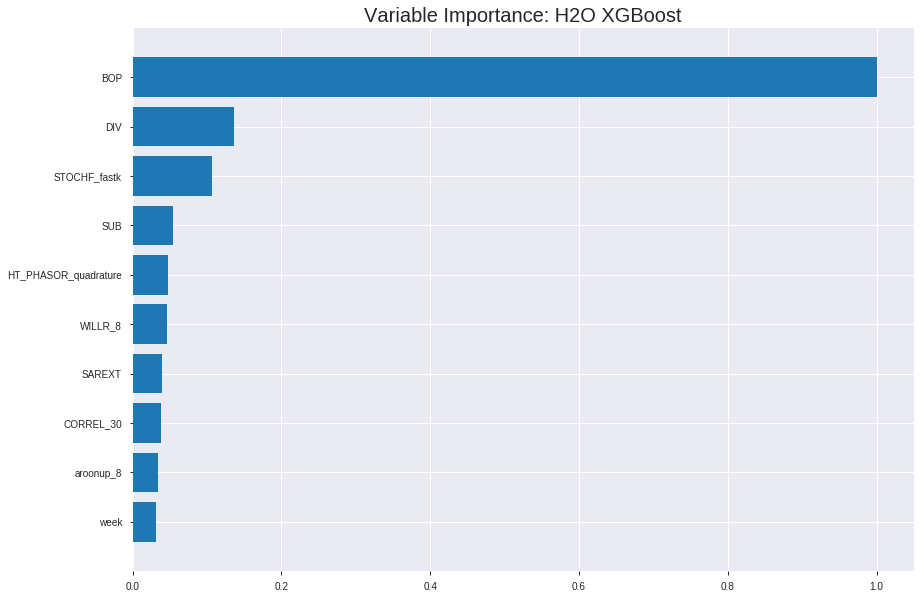

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190827_195745_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17253991246596967
RMSE: 0.4153792393295188
LogLoss: 0.5219969066036506
Mean Per-Class Error: 0.25329065367948367
AUC: 0.827373892096409
pr_auc: 0.8376844694815477
Gini: 0.654747784192818
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4354764223098755: 


,0,1,Error,Rate
0,486.0,324.0,0.4,(324.0/810.0)
1,124.0,819.0,0.1315,(124.0/943.0)
Total,610.0,1143.0,0.2556,(448.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4354764,0.7852349,241.0
max f2,0.2124605,0.8776695,351.0
max f0point5,0.6356369,0.7876802,140.0
max accuracy,0.5059893,0.7512835,207.0
max precision,0.8869371,1.0,0.0
max recall,0.1446941,1.0,383.0
max specificity,0.8869371,1.0,0.0
max absolute_mcc,0.6356369,0.4997008,140.0
max min_per_class_accuracy,0.5618297,0.7395062,181.0
max mean_per_class_accuracy,0.5059893,0.7467093,207.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8720733,1.8589608,1.8589608,1.0,0.8786522,1.0,0.8786522,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8656247,1.8589608,1.8589608,1.0,0.8684827,1.0,0.8735674,0.0190880,0.0381760,85.8960764,85.8960764
,3,0.0302339,0.8598976,1.7496101,1.8238860,0.9411765,0.8631850,0.9811321,0.8702372,0.0169671,0.0551432,74.9610130,82.3886032
,4,0.0405020,0.8539692,1.8589608,1.8327782,1.0,0.8569836,0.9859155,0.8668772,0.0190880,0.0742312,85.8960764,83.2778218
,5,0.0501997,0.8464265,1.5309089,1.7744625,0.8235294,0.8505314,0.9545455,0.8637195,0.0148462,0.0890774,53.0908864,77.4462547
,6,0.1003993,0.8130416,1.6899643,1.7322134,0.9090909,0.8288150,0.9318182,0.8462672,0.0848356,0.1739130,68.9964330,73.2213439
,7,0.1500285,0.7849539,1.6880218,1.7175949,0.9080460,0.7994774,0.9239544,0.8307892,0.0837752,0.2576882,68.8021843,71.7594926
,8,0.2002282,0.7522496,1.4364697,1.6471134,0.7727273,0.7695184,0.8860399,0.8154279,0.0721103,0.3297985,43.6469681,64.7113383
,9,0.3000570,0.6976613,1.5615270,1.6186388,0.84,0.7234621,0.8707224,0.7848309,0.1558855,0.4856840,56.1527041,61.8638840
,10,0.3998859,0.6417708,1.3809423,1.5592995,0.7428571,0.6725773,0.8388017,0.7568075,0.1378579,0.6235419,38.0942281,55.9299471




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.21053289724366867
RMSE: 0.4588386396585064
LogLoss: 0.608969336178406
Mean Per-Class Error: 0.32515097293670325
AUC: 0.7269946001214174
pr_auc: 0.6997713490431249
Gini: 0.45398920024283473
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2893981635570526: 


,0,1,Error,Rate
0,77.0,161.0,0.6765,(161.0/238.0)
1,11.0,252.0,0.0418,(11.0/263.0)
Total,88.0,413.0,0.3433,(172.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2893982,0.7455621,330.0
max f2,0.2474767,0.8672448,356.0
max f0point5,0.4972570,0.6869446,233.0
max accuracy,0.4782189,0.6806387,242.0
max precision,0.8717373,1.0,0.0
max recall,0.2230326,1.0,370.0
max specificity,0.8717373,1.0,0.0
max absolute_mcc,0.2893982,0.3696949,330.0
max min_per_class_accuracy,0.5858926,0.6425856,192.0
max mean_per_class_accuracy,0.4782189,0.6748490,242.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 54.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8625610,1.2699620,1.2699620,0.6666667,0.8655545,0.6666667,0.8655545,0.0152091,0.0152091,26.9961977,26.9961977
,2,0.0219561,0.8545521,1.5239544,1.3854131,0.8,0.8565958,0.7272727,0.8614823,0.0152091,0.0304183,52.3954373,38.5413066
,3,0.0319361,0.8512589,1.5239544,1.4287072,0.8,0.8528655,0.75,0.8587896,0.0152091,0.0456274,52.3954373,42.8707224
,4,0.0419162,0.8458923,0.7619772,1.2699620,0.4,0.8494186,0.6666667,0.8565584,0.0076046,0.0532319,-23.8022814,26.9961977
,5,0.0518962,0.8432868,1.5239544,1.3188067,0.8,0.8444251,0.6923077,0.8542251,0.0152091,0.0684411,52.3954373,31.8806669
,6,0.1017964,0.8160495,1.5239544,1.4193693,0.8,0.8322588,0.7450980,0.8434573,0.0760456,0.1444867,52.3954373,41.9369269
,7,0.1516966,0.7814931,1.6001521,1.4788373,0.84,0.7996532,0.7763158,0.8290481,0.0798479,0.2243346,60.0152091,47.8837302
,8,0.2015968,0.7491917,1.4477567,1.4711441,0.76,0.7655388,0.7722772,0.8133280,0.0722433,0.2965779,44.7756654,47.1144073
,9,0.3013972,0.6963401,1.2572624,1.4003223,0.66,0.7220937,0.7350993,0.7831179,0.1254753,0.4220532,25.7262357,40.0322313
,10,0.4011976,0.6503825,1.1810646,1.3457806,0.62,0.6729843,0.7064677,0.7557215,0.1178707,0.5399240,18.1064639,34.5780603



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 19:57:53,3.161 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4620650,0.5,0.6931472,0.5,0.0,1.0,0.4750499
,2019-08-27 19:57:53,3.271 sec,5.0,0.4753093,0.6446865,0.7987589,0.7647981,1.6973120,0.2806617,0.4831388,0.6598043,0.7030546,0.6427929,1.7688756,0.3293413
,2019-08-27 19:57:53,3.334 sec,10.0,0.4584195,0.6118919,0.8028187,0.7902663,1.7815041,0.2703936,0.4732656,0.6402166,0.7137905,0.6685198,1.9049430,0.3512974
,2019-08-27 19:57:53,3.399 sec,15.0,0.4466641,0.5885774,0.8045625,0.7952246,1.8589608,0.2743868,0.4661599,0.6257354,0.7193261,0.6736097,1.9049430,0.3512974
,2019-08-27 19:57:53,3.463 sec,20.0,0.4391793,0.5734260,0.8079900,0.8082454,1.7261779,0.2703936,0.4625915,0.6181982,0.7235118,0.6839146,1.5874525,0.3473054
,2019-08-27 19:57:53,3.528 sec,25.0,0.4334610,0.5614179,0.8105338,0.8205942,1.8589608,0.2681118,0.4610221,0.6146070,0.7220740,0.6890835,1.5874525,0.3293413
,2019-08-27 19:57:53,3.598 sec,30.0,0.4290783,0.5520358,0.8130860,0.8222755,1.8589608,0.2572732,0.4598866,0.6120640,0.7236716,0.6922136,1.5874525,0.3373253
,2019-08-27 19:57:53,3.674 sec,35.0,0.4253526,0.5439749,0.8166549,0.8283715,1.8589608,0.2538505,0.4585549,0.6088917,0.7262917,0.7032410,1.9049430,0.3353293
,2019-08-27 19:57:53,3.747 sec,40.0,0.4224292,0.5376628,0.8194507,0.8309886,1.8589608,0.2606959,0.4580451,0.6075703,0.7280011,0.7077594,1.9049430,0.3433134
,2019-08-27 19:57:54,3.826 sec,45.0,0.4197671,0.5318956,0.8226058,0.8336925,1.8589608,0.2584141,0.4580606,0.6075424,0.7280330,0.7024360,1.5874525,0.3393214


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,2653.6689453,1.0,0.5209711
DIV,362.8029175,0.1367175,0.0712259
STOCHF_fastk,282.6674500,0.1065195,0.0554936
SUB,142.7260742,0.0537844,0.0280201
HT_PHASOR_quadrature,127.1832886,0.0479273,0.0249688
---,---,---,---
dayofweek,18.2270184,0.0068686,0.0035783
RSI_8,12.1655712,0.0045844,0.0023884
AROONOSC_8,9.4684544,0.0035681,0.0018589
CDLLONGLINE,4.5259972,0.0017056,0.0008885



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7211155378486056)

('F1', 0.7244094488188976)

('auc', 0.7571942446043165)

('logloss', 0.5860519831166711)

('mean_per_class_error', 0.26914182939362796)

('rmse', 0.44696191760875753)

('mse', 0.19977495579249777)

xgboost prediction progress: |████████████████████████████████████████████| 100%


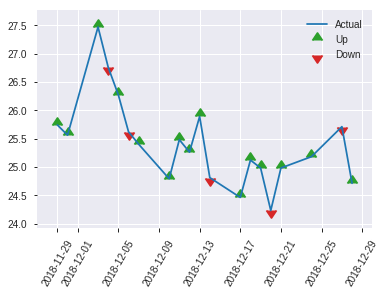


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.19977495579249777
RMSE: 0.44696191760875753
LogLoss: 0.5860519831166711
Mean Per-Class Error: 0.26914182939362796
AUC: 0.7571942446043165
pr_auc: 0.6826618175631364
Gini: 0.514388489208633
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4546646475791931: 


,0,1,Error,Rate
0,89.0,50.0,0.3597,(50.0/139.0)
1,20.0,92.0,0.1786,(20.0/112.0)
Total,109.0,142.0,0.2789,(70.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4546646,0.7244094,141.0
max f2,0.3206875,0.8227848,183.0
max f0point5,0.4546646,0.6764706,141.0
max accuracy,0.4546646,0.7211155,141.0
max precision,0.8655576,1.0,0.0
max recall,0.1577706,1.0,245.0
max specificity,0.8655576,1.0,0.0
max absolute_mcc,0.4546646,0.4630568,141.0
max min_per_class_accuracy,0.5426146,0.6978417,120.0
max mean_per_class_accuracy,0.4546646,0.7308582,141.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 50.23 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.8535112,1.4940476,1.4940476,0.6666667,0.8621202,0.6666667,0.8621202,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.8475673,2.2410714,1.8675595,1.0,0.8499550,0.8333333,0.8560376,0.0267857,0.0446429,124.1071429,86.7559524
,3,0.0318725,0.8355790,2.2410714,1.9609375,1.0,0.8409637,0.875,0.8522691,0.0178571,0.0625,124.1071429,96.09375
,4,0.0438247,0.8288789,1.4940476,1.8336039,0.6666667,0.8312198,0.8181818,0.8465284,0.0178571,0.0803571,49.4047619,83.3603896
,5,0.0517928,0.8029224,2.2410714,1.8962912,1.0,0.8055631,0.8461538,0.8402260,0.0178571,0.0982143,124.1071429,89.6291209
,6,0.1035857,0.7574037,1.7239011,1.8100962,0.7692308,0.7809719,0.8076923,0.8105989,0.0892857,0.1875,72.3901099,81.0096154
,7,0.1513944,0.7330311,1.4940476,1.7102914,0.6666667,0.7433964,0.7631579,0.7893771,0.0714286,0.2589286,49.4047619,71.0291353
,8,0.2031873,0.7188482,1.3791209,1.6258754,0.6153846,0.7248641,0.7254902,0.7729326,0.0714286,0.3303571,37.9120879,62.5875350
,9,0.3027888,0.6671053,1.1653571,1.4743891,0.52,0.6916513,0.6578947,0.7461953,0.1160714,0.4464286,16.5357143,47.4389098
,10,0.4023904,0.6232107,1.6135714,1.5088402,0.72,0.6431265,0.6732673,0.7206832,0.1607143,0.6071429,61.3571429,50.8840170


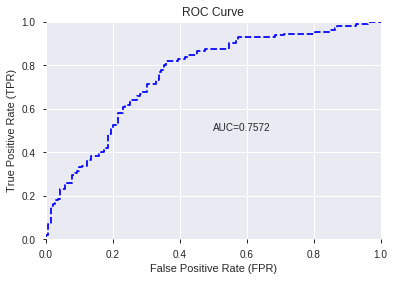

This function is available for GLM models only


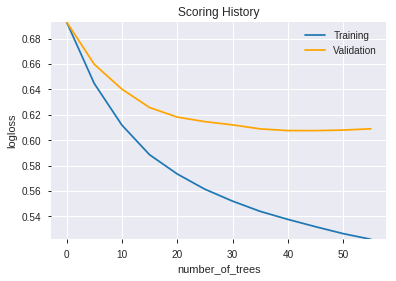

--2019-08-27 19:58:05--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.166.35
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.166.35|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.

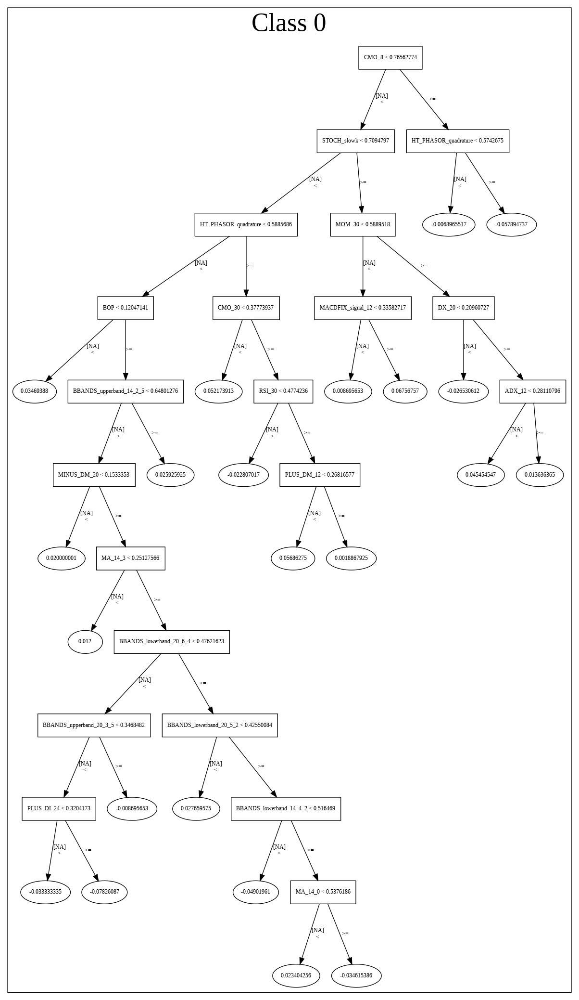

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190827_195745_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190827_195745_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'DIV',
 'STOCHF_fastk',
 'SUB',
 'HT_PHASOR_quadrature',
 'WILLR_8',
 'SAREXT',
 'CORREL_30',
 'aroonup_8',
 'week',
 'aroondown_12',
 'WILLR_24',
 'STOCH_slowd',
 'COS',
 'Volume',
 'TRANGE',
 'MFI_20',
 'WILLR_30',
 'SIN',
 'STOCHRSI_fastd',
 'aroonup_12',
 'weekday_name',
 'ADOSC',
 'WILLR_12',
 'STOCH_slowk',
 'ULTOSC',
 'STOCHRSI_fastk',
 'WILLR_14',
 'quarter',
 'day',
 'aroondown_8',
 'dayofweek',
 'RSI_8',
 'AROONOSC_8',
 'CDLLONGLINE',
 'CDLBELTHOLD']

In [14]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_195812_model_1,0.495664,3.254187,0.5,0.551252,0.303879


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.009319,1.000000,0.038112
1,CDLLONGLINE,0.005953,0.638785,0.024345
2,STOCHF_fastk,0.005863,0.629181,0.023979
3,STOCHRSI_fastk,0.005649,0.606216,0.023104
4,CDLCLOSINGMARUBOZU,0.005530,0.593452,0.022618
5,CDLBELTHOLD,0.005147,0.552360,0.021051
6,WILLR_8,0.004682,0.502423,0.019148
7,CDLENGULFING,0.003569,0.382955,0.014595
8,WILLR_12,0.003412,0.366117,0.013953
9,WILLR_14,0.003114,0.334154,0.012735


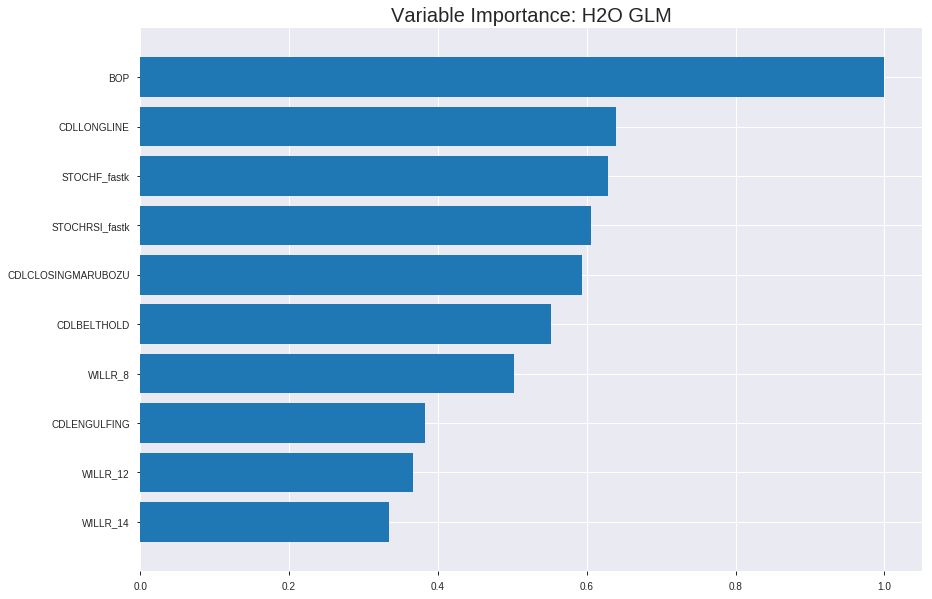

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_195812_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.2420807182297904
RMSE: 0.49201698977757913
LogLoss: 0.6772174907979198
Null degrees of freedom: 1752
Residual degrees of freedom: 915
Null deviance: 2420.0736102674464
Residual deviance: 2374.324522737507
AIC: 4050.324522737507
AUC: 0.6617702892004765
pr_auc: 0.6748292921159358
Gini: 0.32354057840095307
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5122385893147473: 


,0,1,Error,Rate
0,234.0,576.0,0.7111,(576.0/810.0)
1,107.0,836.0,0.1135,(107.0/943.0)
Total,341.0,1412.0,0.3896,(683.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5122386,0.7099788,299.0
max f2,0.4843507,0.8547009,382.0
max f0point5,0.5333260,0.6507592,215.0
max accuracy,0.5333260,0.6263548,215.0
max precision,0.5857611,0.8333333,9.0
max recall,0.4777890,1.0,391.0
max specificity,0.5935116,0.9987654,0.0
max absolute_mcc,0.5333260,0.2438087,215.0
max min_per_class_accuracy,0.5394771,0.6123457,189.0
max mean_per_class_accuracy,0.5333260,0.6203173,215.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.5856183,1.5491340,1.5491340,0.8333333,0.5897435,0.8333333,0.5897435,0.0159067,0.0159067,54.9133970,54.9133970
,2,0.0205362,0.5815947,1.4458584,1.4974962,0.7777778,0.5830218,0.8055556,0.5863827,0.0148462,0.0307529,44.5858372,49.7496171
,3,0.0302339,0.5791439,1.3122076,1.4380640,0.7058824,0.5801612,0.7735849,0.5843871,0.0127253,0.0434783,31.2207598,43.8063987
,4,0.0405020,0.5774038,1.4458584,1.4400400,0.7777778,0.5782685,0.7746479,0.5828359,0.0148462,0.0583245,44.5858372,44.0040028
,5,0.0501997,0.5755469,1.3122076,1.4153451,0.7058824,0.5761171,0.7613636,0.5815380,0.0127253,0.0710498,31.2207598,41.5345127
,6,0.1003993,0.5700704,1.4364697,1.4259074,0.7727273,0.5727682,0.7670455,0.5771531,0.0721103,0.1431601,43.6469681,42.5907404
,7,0.1500285,0.5654846,1.3247766,1.3924535,0.7126437,0.5675225,0.7490494,0.5739673,0.0657476,0.2089077,32.4776636,39.2453500
,8,0.2002282,0.5615513,1.2252241,1.3505271,0.6590909,0.5634218,0.7264957,0.5713234,0.0615058,0.2704136,22.5224140,35.0527050
,9,0.3000570,0.5546849,1.2640933,1.3217706,0.68,0.5580416,0.7110266,0.5669046,0.1261930,0.3966066,26.4093319,32.1770581
,10,0.3998859,0.5469034,1.0197728,1.2463788,0.5485714,0.5507233,0.6704708,0.5628650,0.1018028,0.4984093,1.9772762,24.6378829




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.378934907248502
RMSE: 0.6155768897940387
LogLoss: 7.313818807457693
Null degrees of freedom: 500
Residual degrees of freedom: -337
Null deviance: 693.6248861366328
Residual deviance: 65079.80128386654
AIC: 66755.80128386655
AUC: 0.5256494232674058
pr_auc: 0.5533012725688382
Gini: 0.05129884653481165
Confusion Matrix (Act/Pred) for max f1 @ threshold = 4.5896139373412907e-48: 


,0,1,Error,Rate
0,0.0,238.0,1.0,(238.0/238.0)
1,0.0,263.0,0.0,(0.0/263.0)
Total,0.0,501.0,0.475,(238.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6884817,377.0
max f2,0.0000000,0.8467482,377.0
max f0point5,0.0000000,0.5800618,377.0
max accuracy,0.5168932,0.5429142,179.0
max precision,0.5859538,1.0,0.0
max recall,0.0000000,1.0,377.0
max specificity,0.5859538,1.0,0.0
max absolute_mcc,0.5168932,0.1042088,179.0
max min_per_class_accuracy,0.3865162,0.5019011,248.0
max mean_per_class_accuracy,0.5168932,0.5500607,179.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 27.21 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.5783631,0.9524715,0.9524715,0.5,0.5818443,0.5,0.5818443,0.0114068,0.0114068,-4.7528517,-4.7528517
,2,0.0219561,0.5748936,1.5239544,1.2122364,0.8,0.5767877,0.6363636,0.5795459,0.0152091,0.0266160,52.3954373,21.2236433
,3,0.0319361,0.5708434,0.7619772,1.0715304,0.4,0.5718656,0.5625,0.5771458,0.0076046,0.0342205,-23.8022814,7.1530418
,4,0.0419162,0.5690549,1.5239544,1.1792504,0.8,0.5695667,0.6190476,0.5753412,0.0152091,0.0494297,52.3954373,17.9250407
,5,0.0518962,0.5650863,1.5239544,1.2455396,0.8,0.5664928,0.6538462,0.5736396,0.0152091,0.0646388,52.3954373,24.5539631
,6,0.1017964,0.5557218,0.9143726,1.0832029,0.48,0.5595531,0.5686275,0.5667344,0.0456274,0.1102662,-8.5627376,8.3202863
,7,0.1516966,0.5489061,1.0667681,1.0777967,0.56,0.5523932,0.5657895,0.5620169,0.0532319,0.1634981,6.6768061,7.7796678
,8,0.2015968,0.5413172,1.1429658,1.0939276,0.6,0.5453665,0.5742574,0.5578955,0.0570342,0.2205323,14.2965779,9.3927644
,9,0.3013972,0.5295543,1.1429658,1.1101654,0.6,0.5360269,0.5827815,0.5506543,0.1140684,0.3346008,14.2965779,11.0165437
,10,0.4011976,0.5057553,0.9143726,1.0614608,0.48,0.5183435,0.5572139,0.5426168,0.0912548,0.4258555,-8.5627376,6.1460757



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 19:58:16,0.000 sec,2,.22E2,838,1.3544350,129.8998030
,2019-08-27 19:58:18,2.282 sec,4,.16E2,876,1.3472387,144.7110676
,2019-08-27 19:58:20,4.584 sec,6,.12E2,910,1.3383592,161.0137535
,2019-08-27 19:58:23,6.872 sec,8,.86E1,957,1.3275421,178.3053465
,2019-08-27 19:58:25,9.155 sec,10,.63E1,986,1.3146031,195.9069276


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5697211155378487)

('F1', 0.6170798898071626)

('auc', 0.4956641829393628)

('logloss', 3.254187445863547)

('mean_per_class_error', 0.4598535457348407)

('rmse', 0.5512522139079084)

('mse', 0.3038790033383703)

glm prediction progress: |████████████████████████████████████████████████| 100%


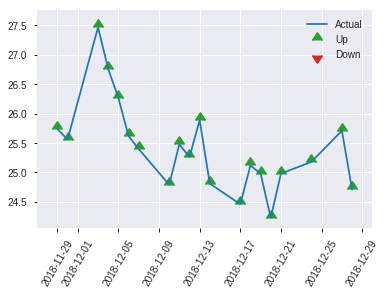


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.3038790033383703
RMSE: 0.5512522139079084
LogLoss: 3.254187445863547
Null degrees of freedom: 250
Residual degrees of freedom: -587
Null deviance: 353.51374206928267
Residual deviance: 16403.080188938387
AIC: 18079.080188938387
AUC: 0.4956641829393628
pr_auc: 0.4557514304459678
Gini: -0.008671634121274363
Confusion Matrix (Act/Pred) for max f1 @ threshold = 1.2417001787380958e-58: 


,0,1,Error,Rate
0,0.0,139.0,1.0,(139.0/139.0)
1,0.0,112.0,0.0,(0.0/112.0)
Total,0.0,251.0,0.5538,(139.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6170799,225.0
max f2,0.0000000,0.8011445,225.0
max f0point5,0.0000000,0.5017921,225.0
max accuracy,0.5277297,0.5697211,31.0
max precision,0.5732191,1.0,0.0
max recall,0.0000000,1.0,225.0
max specificity,0.5732191,1.0,0.0
max absolute_mcc,0.1578308,0.0948597,198.0
max min_per_class_accuracy,0.4873409,0.5107914,125.0
max mean_per_class_accuracy,0.5073949,0.5401465,73.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 38.63 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.5582098,1.4940476,1.4940476,0.6666667,0.5685552,0.6666667,0.5685552,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.5519868,0.7470238,1.1205357,0.3333333,0.5528192,0.5,0.5606872,0.0089286,0.0267857,-25.2976190,12.0535714
,3,0.0318725,0.5491315,1.1205357,1.1205357,0.5,0.5499923,0.5,0.5580135,0.0089286,0.0357143,12.0535714,12.0535714
,4,0.0438247,0.5457851,0.7470238,1.0186688,0.3333333,0.5471616,0.4545455,0.5550539,0.0089286,0.0446429,-25.2976190,1.8668831
,5,0.0517928,0.5434632,1.1205357,1.0343407,0.5,0.5449222,0.4615385,0.5534952,0.0089286,0.0535714,12.0535714,3.4340659
,6,0.1035857,0.5319347,1.3791209,1.2067308,0.6153846,0.5376547,0.5384615,0.5455750,0.0714286,0.125,37.9120879,20.6730769
,7,0.1513944,0.5268449,0.9337798,1.1205357,0.4166667,0.5284604,0.5,0.5401704,0.0446429,0.1696429,-6.6220238,12.0535714
,8,0.2031873,0.5178085,0.6895604,1.0106793,0.3076923,0.5226024,0.4509804,0.5356923,0.0357143,0.2053571,-31.0439560,1.0679272
,9,0.3027888,0.5068207,1.3446429,1.1205357,0.6,0.5116811,0.5,0.5277939,0.1339286,0.3392857,34.4642857,12.0535714
,10,0.4023904,0.4970580,0.7171429,1.0206860,0.32,0.5012637,0.4554455,0.5212270,0.0714286,0.4107143,-28.2857143,2.0685997


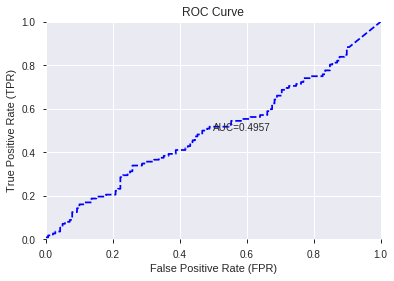

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


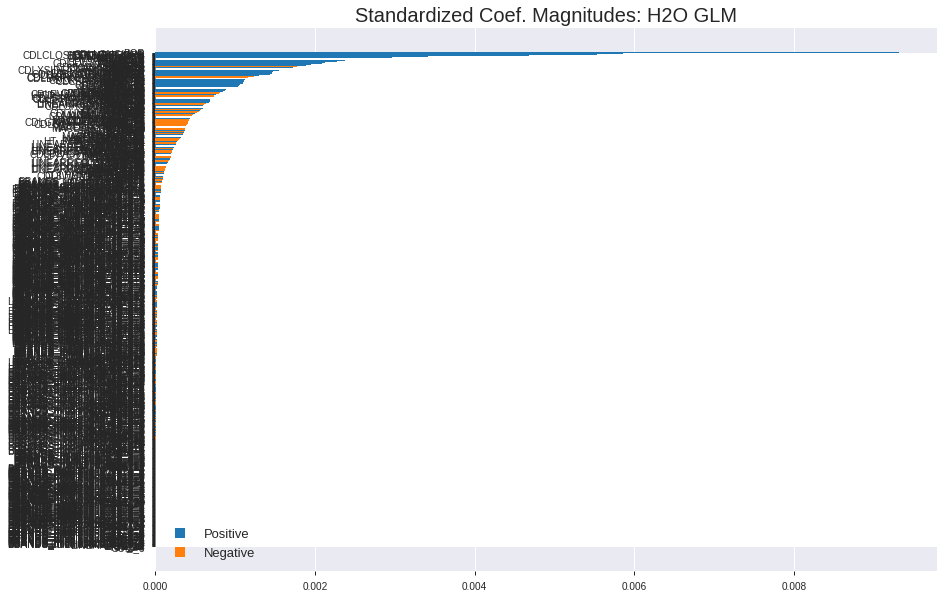

'log_likelihood'
--2019-08-27 19:58:50--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.230.195
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.230.195|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


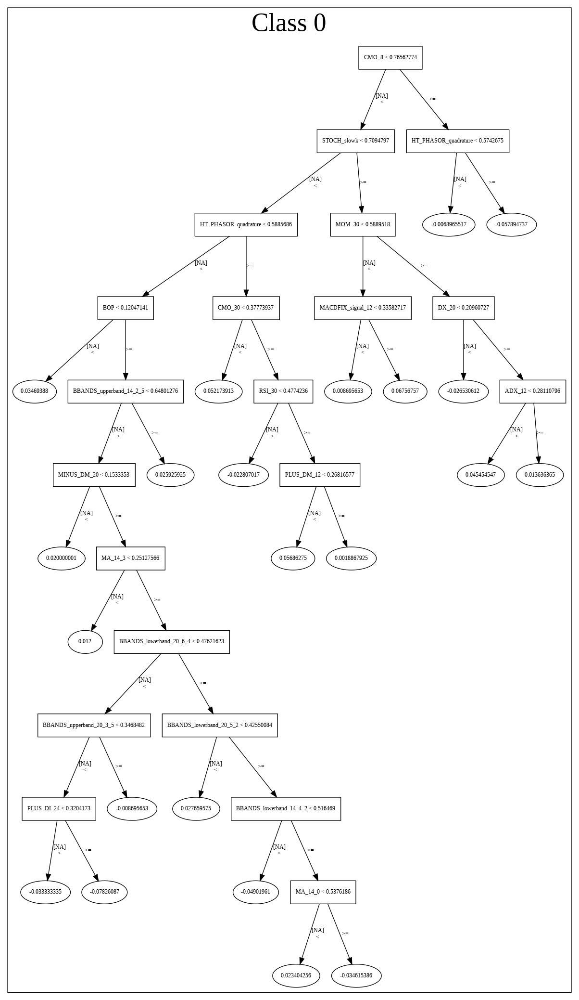

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_195812_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_195812_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

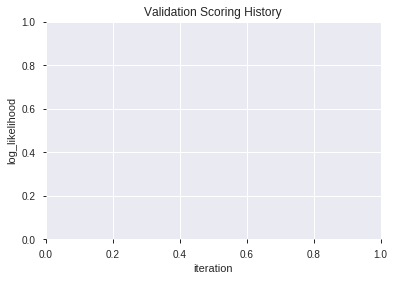

In [15]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [16]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [17]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [18]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190827_195857_model_4,0.754239,0.603553,0.289986,0.455262,0.207263
1,XGBoost_2_AutoML_20190827_195857,0.744155,0.609324,0.303507,0.458244,0.209987
2,XGBoost_1_AutoML_20190827_195857,0.742356,0.599606,0.280190,0.453782,0.205918
3,XGBoost_grid_1_AutoML_20190827_195857_model_7,0.737988,0.606120,0.297919,0.456838,0.208701
4,XGBoost_grid_1_AutoML_20190827_195857_model_2,0.737217,0.605347,0.290725,0.456759,0.208629
5,XGBoost_grid_1_AutoML_20190827_195857_model_3,0.726811,0.612248,0.311569,0.460556,0.212112
6,XGBoost_grid_1_AutoML_20190827_195857_model_1,0.717626,0.615126,0.328687,0.462094,0.213531
7,XGBoost_grid_1_AutoML_20190827_195857_model_6,0.704201,0.622671,0.373105,0.465724,0.216898
8,XGBoost_3_AutoML_20190827_195857,0.702916,0.626990,0.321364,0.467658,0.218704
9,XGBoost_grid_1_AutoML_20190827_195857_model_5,0.658851,0.650865,0.372848,0.479455,0.229877


,variable,relative_importance,scaled_importance,percentage
0,BOP,2615.964111,1.000000,0.460587
1,DIV,326.688232,0.124883,0.057519
2,STOCHF_fastk,267.855347,0.102393,0.047161
3,CCI_8,143.989166,0.055042,0.025352
4,SUB,92.240837,0.035261,0.016241
5,HT_PHASOR_quadrature,74.414238,0.028446,0.013102
6,HT_DCPERIOD,72.788559,0.027825,0.012816
7,BETA_14,71.471245,0.027321,0.012584
8,CORREL_30,57.598694,0.022018,0.010141
9,CORREL_12,54.098568,0.020680,0.009525


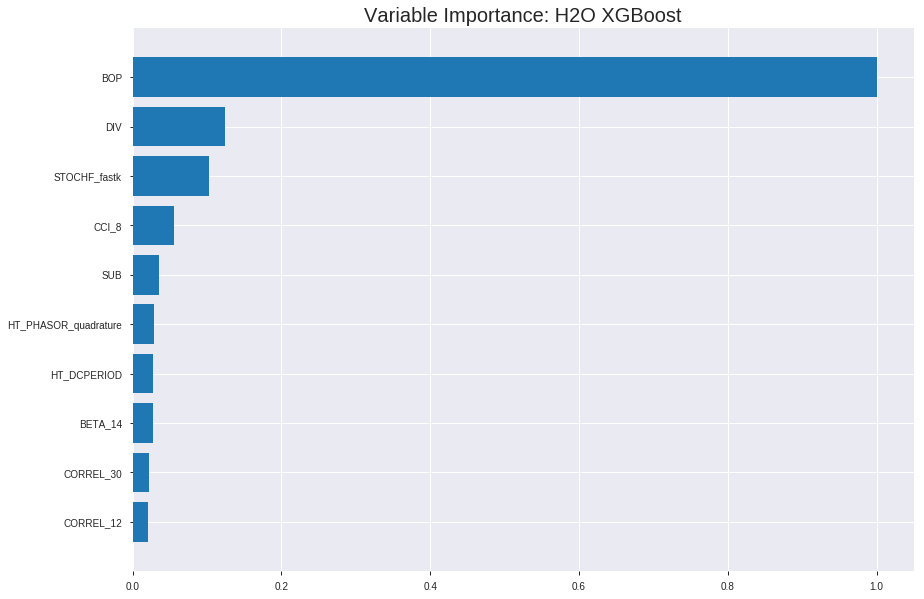

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190827_195857_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16658936216842746
RMSE: 0.40815360119497596
LogLoss: 0.5094577034045752
Mean Per-Class Error: 0.23773156330597123
AUC: 0.8463499731615675
pr_auc: 0.8610118855495574
Gini: 0.6926999463231349
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.433087686697642: 


,0,1,Error,Rate
0,492.0,318.0,0.3926,(318.0/810.0)
1,111.0,832.0,0.1177,(111.0/943.0)
Total,603.0,1150.0,0.2447,(429.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4330877,0.7950311,248.0
max f2,0.2542269,0.8838575,337.0
max f0point5,0.6167453,0.7983611,153.0
max accuracy,0.5675786,0.7621221,184.0
max precision,0.8820081,1.0,0.0
max recall,0.1524311,1.0,385.0
max specificity,0.8820081,1.0,0.0
max absolute_mcc,0.6167453,0.5261572,153.0
max min_per_class_accuracy,0.5662534,0.7613998,185.0
max mean_per_class_accuracy,0.5675786,0.7622684,184.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8627525,1.8589608,1.8589608,1.0,0.8716467,1.0,0.8716467,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8558110,1.8589608,1.8589608,1.0,0.8590693,1.0,0.8653580,0.0190880,0.0381760,85.8960764,85.8960764
,3,0.0302339,0.8459810,1.8589608,1.8589608,1.0,0.8505153,1.0,0.8605972,0.0180276,0.0562036,85.8960764,85.8960764
,4,0.0405020,0.8406221,1.8589608,1.8589608,1.0,0.8436256,1.0,0.8562945,0.0190880,0.0752916,85.8960764,85.8960764
,5,0.0501997,0.8315098,1.6402595,1.8167117,0.8823529,0.8363190,0.9772727,0.8524356,0.0159067,0.0911983,64.0259497,81.6711655
,6,0.1003993,0.8013433,1.7533380,1.7850248,0.9431818,0.8166410,0.9602273,0.8345383,0.0880170,0.1792153,75.3337993,78.5024824
,7,0.1500285,0.7720450,1.6666545,1.7458681,0.8965517,0.7860180,0.9391635,0.8184878,0.0827147,0.2619300,66.6654478,74.5868093
,8,0.2002282,0.7469499,1.6054661,1.7106676,0.8636364,0.7589314,0.9202279,0.8035563,0.0805938,0.3425239,60.5466114,71.0667597
,9,0.3000570,0.6934213,1.5296591,1.6504462,0.8228571,0.7220455,0.8878327,0.7764377,0.1527041,0.4952280,52.9659143,65.0446153
,10,0.3998859,0.6413500,1.3809423,1.5831663,0.7428571,0.6677427,0.8516405,0.7493027,0.1378579,0.6330859,38.0942281,58.3166299




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.21315422077366322
RMSE: 0.461686279603004
LogLoss: 0.6156857971035983
Mean Per-Class Error: 0.3298558967313161
AUC: 0.7215068536920471
pr_auc: 0.6872121968592846
Gini: 0.4430137073840943
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3506114333868027: 


,0,1,Error,Rate
0,88.0,150.0,0.6303,(150.0/238.0)
1,19.0,244.0,0.0722,(19.0/263.0)
Total,107.0,394.0,0.3373,(169.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3506114,0.7427702,304.0
max f2,0.2793013,0.8750835,348.0
max f0point5,0.5313424,0.6835270,223.0
max accuracy,0.5313424,0.6746507,223.0
max precision,0.7768151,0.7931034,66.0
max recall,0.2232263,1.0,376.0
max specificity,0.8662676,0.9957983,0.0
max absolute_mcc,0.3506114,0.3625100,304.0
max min_per_class_accuracy,0.6007109,0.6470588,186.0
max mean_per_class_accuracy,0.5313424,0.6701441,223.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 57.02 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8534152,0.9524715,0.9524715,0.5,0.8598529,0.5,0.8598529,0.0114068,0.0114068,-4.7528517,-4.7528517
,2,0.0219561,0.8495548,0.7619772,0.8658832,0.4,0.8518083,0.4545455,0.8561963,0.0076046,0.0190114,-23.8022814,-13.4116834
,3,0.0319361,0.8461919,1.9049430,1.1905894,1.0,0.8472255,0.625,0.8533929,0.0190114,0.0380228,90.4942966,19.0589354
,4,0.0419162,0.8430029,1.9049430,1.3606735,1.0,0.8448979,0.7142857,0.8513703,0.0190114,0.0570342,90.4942966,36.0673547
,5,0.0518962,0.8376474,1.1429658,1.3188067,0.6,0.8401466,0.6923077,0.8492119,0.0114068,0.0684411,14.2965779,31.8806669
,6,0.1017964,0.8157909,1.5239544,1.4193693,0.8,0.8265377,0.7450980,0.8380971,0.0760456,0.1444867,52.3954373,41.9369269
,7,0.1516966,0.7859494,1.6001521,1.4788373,0.84,0.7961319,0.7763158,0.8242928,0.0798479,0.2243346,60.0152091,47.8837302
,8,0.2015968,0.7652100,1.4477567,1.4711441,0.76,0.7757819,0.7722772,0.8122851,0.0722433,0.2965779,44.7756654,47.1144073
,9,0.3013972,0.7304832,1.3715589,1.4381689,0.72,0.7480539,0.7549669,0.7910165,0.1368821,0.4334601,37.1558935,43.8168862
,10,0.4011976,0.6783584,0.9524715,1.3173486,0.5,0.7003501,0.6915423,0.7684627,0.0950570,0.5285171,-4.7528517,31.7348618



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 19:59:30,14.739 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4620650,0.5,0.6931472,0.5,0.0,1.0,0.4750499
,2019-08-27 19:59:31,16.073 sec,5.0,0.4747318,0.6435875,0.8044918,0.7767418,1.8112951,0.2726754,0.4821003,0.6577803,0.7165863,0.6566261,1.4036422,0.3413174
,2019-08-27 19:59:32,16.468 sec,10.0,0.4578969,0.6110269,0.8098072,0.8144204,1.8589608,0.2732459,0.4724329,0.6386099,0.7209717,0.6828869,1.6668251,0.3413174
,2019-08-27 19:59:32,16.880 sec,15.0,0.4450746,0.5858658,0.8151100,0.8210707,1.8589608,0.2698232,0.4650871,0.6237362,0.7272502,0.6854765,1.6668251,0.3333333
,2019-08-27 19:59:32,17.266 sec,20.0,0.4365429,0.5689110,0.8219270,0.8353558,1.8589608,0.2703936,0.4628315,0.6188111,0.7260840,0.6991367,1.2699620,0.3353293
,2019-08-27 19:59:33,17.775 sec,25.0,0.4301158,0.5557171,0.8245473,0.8383088,1.8589608,0.2664005,0.4609285,0.6146286,0.7251094,0.6947354,0.9524715,0.3493014
,2019-08-27 19:59:33,18.149 sec,30.0,0.4249016,0.5448348,0.8284527,0.8421729,1.8589608,0.2527096,0.4601014,0.6124852,0.7253491,0.6949009,0.9524715,0.3433134
,2019-08-27 19:59:34,18.546 sec,35.0,0.4205223,0.5355902,0.8324503,0.8469468,1.8589608,0.2567028,0.4606690,0.6135452,0.7220181,0.6901456,1.2699620,0.3532934
,2019-08-27 19:59:34,18.921 sec,40.0,0.4171111,0.5283867,0.8359452,0.8506466,1.8589608,0.2629778,0.4604913,0.6128868,0.7232003,0.6909663,1.2699620,0.3413174
,2019-08-27 19:59:34,19.313 sec,45.0,0.4137150,0.5211647,0.8398060,0.8550532,1.8589608,0.2487165,0.4606438,0.6132889,0.7235358,0.6940342,1.2699620,0.3453094


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,2615.9641113,1.0,0.4605869
DIV,326.6882324,0.1248825,0.0575193
STOCHF_fastk,267.8553467,0.1023926,0.0471607
CCI_8,143.9891663,0.0550425,0.0253519
SUB,92.2408371,0.0352607,0.0162406
---,---,---,---
aroonup_12,5.6074905,0.0021436,0.0009873
CCI_30,4.9918900,0.0019082,0.0008789
MACD_signal,4.8988013,0.0018727,0.0008625
STDDEV_20,4.6807938,0.0017893,0.0008241



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7051792828685259)

('F1', 0.7158671586715867)

('auc', 0.7542394655704008)

('logloss', 0.6035527113197094)

('mean_per_class_error', 0.2843974820143884)

('rmse', 0.4552615544083261)

('mse', 0.2072630829222853)

xgboost prediction progress: |████████████████████████████████████████████| 100%


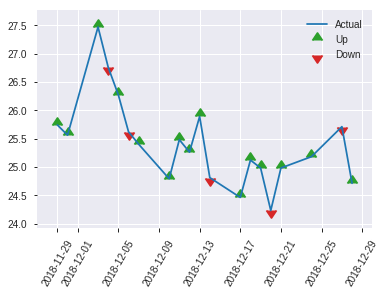


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2072630829222853
RMSE: 0.4552615544083261
LogLoss: 0.6035527113197094
Mean Per-Class Error: 0.2843974820143884
AUC: 0.7542394655704008
pr_auc: 0.6707491526794015
Gini: 0.5084789311408016
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4661463797092438: 


,0,1,Error,Rate
0,77.0,62.0,0.446,(62.0/139.0)
1,15.0,97.0,0.1339,(15.0/112.0)
Total,92.0,159.0,0.3068,(77.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4661464,0.7158672,158.0
max f2,0.3868207,0.8200637,179.0
max f0point5,0.6768000,0.6617647,90.0
max accuracy,0.5241754,0.7051793,143.0
max precision,0.8692651,1.0,0.0
max recall,0.1855967,1.0,249.0
max specificity,0.8692651,1.0,0.0
max absolute_mcc,0.5241754,0.4334381,143.0
max min_per_class_accuracy,0.6130889,0.6875,117.0
max mean_per_class_accuracy,0.5241754,0.7156025,143.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 54.46 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.8475904,1.4940476,1.4940476,0.6666667,0.8604994,0.6666667,0.8604994,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.8353369,2.2410714,1.8675595,1.0,0.8372207,0.8333333,0.8488601,0.0267857,0.0446429,124.1071429,86.7559524
,3,0.0318725,0.8324882,2.2410714,1.9609375,1.0,0.8350574,0.875,0.8454094,0.0178571,0.0625,124.1071429,96.09375
,4,0.0438247,0.8241705,2.2410714,2.0373377,1.0,0.8265175,0.9090909,0.8402571,0.0267857,0.0892857,124.1071429,103.7337662
,5,0.0517928,0.8090516,2.2410714,2.0686813,1.0,0.8149586,0.9230769,0.8363650,0.0178571,0.1071429,124.1071429,106.8681319
,6,0.1035857,0.7747021,1.2067308,1.6377060,0.5384615,0.7914531,0.7307692,0.8139090,0.0625,0.1696429,20.6730769,63.7706044
,7,0.1513944,0.7584399,1.3072917,1.5333647,0.5833333,0.7647608,0.6842105,0.7983885,0.0625,0.2321429,30.7291667,53.3364662
,8,0.2031873,0.7426041,1.5515110,1.5379902,0.6923077,0.7498179,0.6862745,0.7860078,0.0803571,0.3125,55.1510989,53.7990196
,9,0.3027888,0.7088709,1.5239286,1.5333647,0.68,0.7247603,0.6842105,0.7658606,0.1517857,0.4642857,52.3928571,53.3364662
,10,0.4023904,0.6561794,1.3446429,1.4866513,0.6,0.6826660,0.6633663,0.7452679,0.1339286,0.5982143,34.4642857,48.6651344


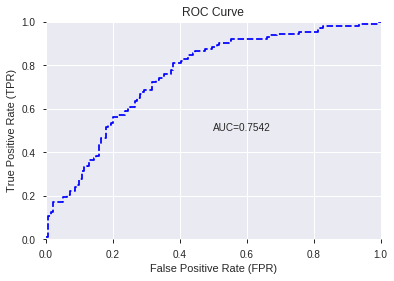

This function is available for GLM models only


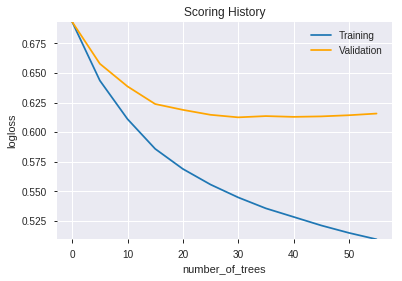

--2019-08-27 19:59:59--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.207.115
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.207.115|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at he

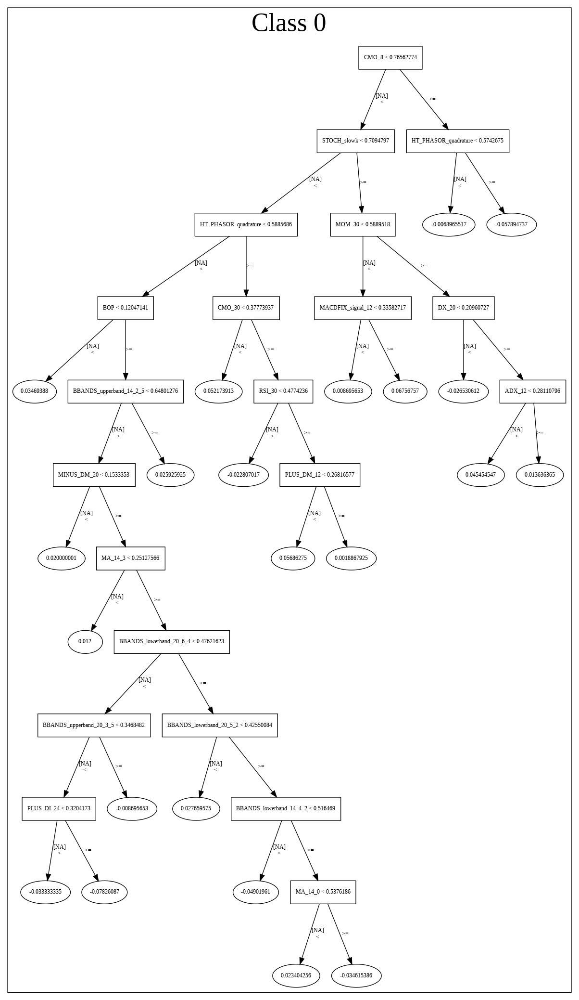

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190827_195857_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190827_195857_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

In [19]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_200006_model_5,0.758350,0.699870,0.284654,0.491326,0.241401
1,DeepLearning_grid_1_AutoML_20190827_200006_model_9,0.758286,0.597471,0.299043,0.450314,0.202782
2,DeepLearning_grid_1_AutoML_20190827_200006_model_8,0.754753,0.617868,0.286260,0.448798,0.201420
3,DeepLearning_grid_1_AutoML_20190827_200006_model_6,0.746788,0.633880,0.294450,0.461606,0.213080
4,DeepLearning_1_AutoML_20190827_200006,0.741971,0.787489,0.308710,0.505365,0.255394
5,DeepLearning_grid_1_AutoML_20190827_200006_model_3,0.740622,0.862383,0.283884,0.472298,0.223065
6,DeepLearning_grid_1_AutoML_20190827_200006_model_7,0.737924,0.722387,0.284269,0.467389,0.218452
7,DeepLearning_grid_1_AutoML_20190827_200006_model_4,0.727261,0.815617,0.333151,0.481816,0.232146
8,DeepLearning_grid_1_AutoML_20190827_200006_model_1,0.712359,1.084806,0.312179,0.511584,0.261719
9,DeepLearning_grid_1_AutoML_20190827_200006_model_2,0.683261,0.961778,0.390095,0.526454,0.277154


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.036177
1,DIV,0.792823,0.792823,0.028682
2,CDLCLOSINGMARUBOZU,0.678841,0.678841,0.024559
3,HT_PHASOR_quadrature,0.618303,0.618303,0.022369
4,Volume,0.610355,0.610355,0.022081
5,COS,0.603974,0.603974,0.021850
6,CDLSHORTLINE,0.600477,0.600477,0.021724
7,SIN,0.600307,0.600307,0.021718
8,dayofweek,0.597474,0.597474,0.021615
9,MFI_20,0.596744,0.596744,0.021589


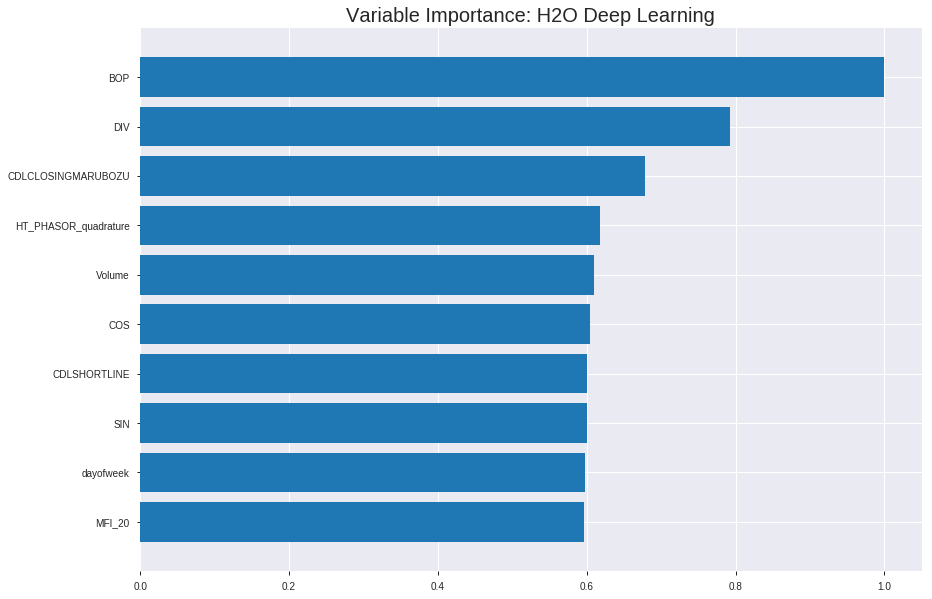

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_200006_model_5


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19621059041718658
RMSE: 0.4429566462050057
LogLoss: 0.5696320756263602
Mean Per-Class Error: 0.2767710092559863
AUC: 0.80317740858568
pr_auc: 0.8108417891335364
Gini: 0.60635481717136
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5385799488501042: 


,0,1,Error,Rate
0,336.0,474.0,0.5852,(474.0/810.0)
1,46.0,897.0,0.0488,(46.0/943.0)
Total,382.0,1371.0,0.2966,(520.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5385799,0.7752809,248.0
max f2,0.3910490,0.8841985,293.0
max f0point5,0.7510725,0.7421040,138.0
max accuracy,0.6801993,0.7296064,180.0
max precision,0.9965862,1.0,0.0
max recall,0.0679427,1.0,375.0
max specificity,0.9965862,1.0,0.0
max absolute_mcc,0.6801993,0.4546620,180.0
max min_per_class_accuracy,0.7294804,0.7098765,152.0
max mean_per_class_accuracy,0.7010384,0.7232290,170.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 66.23 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.9783363,1.8589608,1.8589608,1.0,0.9871484,1.0,0.9871484,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.9686364,1.6524096,1.7556852,0.8888889,0.9730607,0.9444444,0.9801045,0.0169671,0.0360551,65.2409568,75.5685166
,3,0.0302339,0.9606423,1.8589608,1.7888113,1.0,0.9647704,0.9622642,0.9751860,0.0180276,0.0540827,85.8960764,78.8811301
,4,0.0405020,0.9536702,1.6524096,1.7542306,0.8888889,0.9570256,0.9436620,0.9705820,0.0169671,0.0710498,65.2409568,75.4230580
,5,0.0501997,0.9458886,1.7496101,1.7533380,0.9411765,0.9502758,0.9431818,0.9666592,0.0169671,0.0880170,74.9610130,75.3337993
,6,0.1003993,0.9188209,1.6265907,1.6899643,0.875,0.9331153,0.9090909,0.9498872,0.0816543,0.1696713,62.6590668,68.9964330
,7,0.1500285,0.8933546,1.6239197,1.6681169,0.8735632,0.9057388,0.8973384,0.9352830,0.0805938,0.2502651,62.3919747,66.8116883
,8,0.2002282,0.8647709,1.5632170,1.6418172,0.8409091,0.8793594,0.8831909,0.9212623,0.0784730,0.3287381,56.3217006,64.1817199
,9,0.3000570,0.8200258,1.3809423,1.5550242,0.7428571,0.8405102,0.8365019,0.8943961,0.1378579,0.4665960,38.0942281,55.5024213
,10,0.3998859,0.7728525,1.2003575,1.4664840,0.6457143,0.7963088,0.7888730,0.8699093,0.1198303,0.5864263,20.0357522,46.6484026




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.23309134623664007
RMSE: 0.4827953461215633
LogLoss: 0.6704144186865071
Mean Per-Class Error: 0.33106208262772796
AUC: 0.7064095600217273
pr_auc: 0.6844506011424184
Gini: 0.41281912004345456
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5650019999383304: 


,0,1,Error,Rate
0,93.0,145.0,0.6092,(145.0/238.0)
1,24.0,239.0,0.0913,(24.0/263.0)
Total,117.0,384.0,0.3373,(169.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5650020,0.7387944,289.0
max f2,0.2912309,0.8604651,353.0
max f0point5,0.7001414,0.6846780,201.0
max accuracy,0.6474634,0.6726547,244.0
max precision,0.9888264,1.0,0.0
max recall,0.1095541,1.0,376.0
max specificity,0.9888264,1.0,0.0
max absolute_mcc,0.5650020,0.3535142,289.0
max min_per_class_accuracy,0.7129090,0.6577947,187.0
max mean_per_class_accuracy,0.7001414,0.6689379,201.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 65.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.9705354,1.5874525,1.5874525,0.8333333,0.9773770,0.8333333,0.9773770,0.0190114,0.0190114,58.7452471,58.7452471
,2,0.0219561,0.9561101,1.9049430,1.7317663,1.0,0.9605846,0.9090909,0.9697441,0.0190114,0.0380228,90.4942966,73.1766333
,3,0.0319361,0.9501450,0.7619772,1.4287072,0.4,0.9519114,0.75,0.9641714,0.0076046,0.0456274,-23.8022814,42.8707224
,4,0.0419162,0.9399628,1.1429658,1.3606735,0.6,0.9454195,0.7142857,0.9597067,0.0114068,0.0570342,14.2965779,36.0673547
,5,0.0518962,0.9315992,1.5239544,1.3920737,0.8,0.9352991,0.7307692,0.9550129,0.0152091,0.0722433,52.3954373,39.2073706
,6,0.1017964,0.8959607,1.2953612,1.3446656,0.68,0.9114358,0.7058824,0.9336516,0.0646388,0.1368821,29.5361217,34.4665623
,7,0.1516966,0.8625986,1.4477567,1.3785771,0.76,0.8740566,0.7236842,0.9140480,0.0722433,0.2091255,44.7756654,37.8577146
,8,0.2015968,0.8250212,1.2953612,1.3579791,0.68,0.8376239,0.7128713,0.8951311,0.0646388,0.2737643,29.5361217,35.7979144
,9,0.3013972,0.7813909,1.2572624,1.3246292,0.66,0.8028584,0.6953642,0.8645773,0.1254753,0.3992395,25.7262357,32.4629215
,10,0.4011976,0.7464935,1.2572624,1.3078713,0.66,0.7631377,0.6865672,0.8393435,0.1254753,0.5247148,25.7262357,30.7871290



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 20:02:58,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 20:03:00,1 min 7.064 sec,1197 obs/sec,1.0,1,1753.0,0.5085645,0.7674289,-0.0405408,0.7681408,0.7694766,1.7556852,0.3183115,0.5321275,0.8643479,-0.1354662,0.7122168,0.6985673,1.9049430,0.3433134
,2019-08-27 20:03:05,1 min 12.903 sec,2074 obs/sec,8.0,8,14024.0,0.4429566,0.5696321,0.2106137,0.8031774,0.8108418,1.8589608,0.2966343,0.4827953,0.6704144,0.0653072,0.7064096,0.6844506,1.5874525,0.3373253
,2019-08-27 20:03:11,1 min 18.489 sec,2378 obs/sec,16.0,16,28048.0,0.4223650,0.5222157,0.2822999,0.8287080,0.8346657,1.8589608,0.2669709,0.4836328,0.6764816,0.0620619,0.6969757,0.6902563,1.9049430,0.3852295
,2019-08-27 20:03:17,1 min 24.339 sec,2563 obs/sec,25.0,25,43825.0,0.4183720,0.5111387,0.2958059,0.8515226,0.8620690,1.8589608,0.2395893,0.4923829,0.7134594,0.0278156,0.7082468,0.6904624,1.2699620,0.3952096
,2019-08-27 20:03:23,1 min 30.041 sec,2677 obs/sec,34.0,34,59602.0,0.3864488,0.4445992,0.3991707,0.8857854,0.8941515,1.8589608,0.2173417,0.4825497,0.6899979,0.0662583,0.6923347,0.6586365,1.2699620,0.3572854
,2019-08-27 20:03:28,1 min 35.632 sec,2765 obs/sec,43.0,43,75379.0,0.3711919,0.4142717,0.4456755,0.9028233,0.9123490,1.8589608,0.1973759,0.4950320,0.7319863,0.0173266,0.6695770,0.6380836,0.9524715,0.4031936
,2019-08-27 20:03:34,1 min 41.616 sec,2841 obs/sec,53.0,53,92909.0,0.3409394,0.3582998,0.5323495,0.9238934,0.9263459,1.8589608,0.1751284,0.4973381,0.7755587,0.0081497,0.6745774,0.6433363,0.9524715,0.4091816
,2019-08-27 20:03:35,1 min 42.188 sec,2839 obs/sec,53.0,53,92909.0,0.4429566,0.5696321,0.2106137,0.8031774,0.8108418,1.8589608,0.2966343,0.4827953,0.6704144,0.0653072,0.7064096,0.6844506,1.5874525,0.3373253


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0361775
DIV,0.7928227,0.7928227,0.0286823
CDLCLOSINGMARUBOZU,0.6788408,0.6788408,0.0245588
HT_PHASOR_quadrature,0.6183026,0.6183026,0.0223686
Volume,0.6103551,0.6103551,0.0220811
---,---,---,---
WILLR_12,0.4840711,0.4840711,0.0175125
WILLR_30,0.4719436,0.4719436,0.0170737
STOCH_slowk,0.4584146,0.4584146,0.0165843
CDLMORNINGSTAR,0.4549202,0.4549202,0.0164579



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7051792828685259)

('F1', 0.7226277372262775)

('auc', 0.7583504624871532)

('logloss', 0.6998699667144297)

('mean_per_class_error', 0.28465441932168556)

('rmse', 0.4913261032552316)

('mse', 0.24140133973997052)

deeplearning prediction progress: |███████████████████████████████████████| 100%


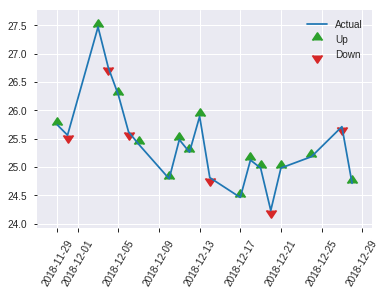


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.24140133973997052
RMSE: 0.4913261032552316
LogLoss: 0.6998699667144297
Mean Per-Class Error: 0.28465441932168556
AUC: 0.7583504624871532
pr_auc: 0.6887006770089512
Gini: 0.5167009249743064
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6448809806134749: 


,0,1,Error,Rate
0,76.0,63.0,0.4532,(63.0/139.0)
1,13.0,99.0,0.1161,(13.0/112.0)
Total,89.0,162.0,0.3028,(76.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.6448810,0.7226277,161.0
max f2,0.6343346,0.8184765,168.0
max f0point5,0.7445507,0.6766055,80.0
max accuracy,0.6847270,0.7051793,129.0
max precision,0.9710866,1.0,0.0
max recall,0.0072711,1.0,248.0
max specificity,0.9710866,1.0,0.0
max absolute_mcc,0.6448810,0.4475379,161.0
max min_per_class_accuracy,0.6964881,0.6785714,119.0
max mean_per_class_accuracy,0.6448810,0.7153456,161.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 62.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.9636843,2.2410714,2.2410714,1.0,0.9669091,1.0,0.9669091,0.0267857,0.0267857,124.1071429,124.1071429
,2,0.0239044,0.9569891,1.4940476,1.8675595,0.6666667,0.9597202,0.8333333,0.9633147,0.0178571,0.0446429,49.4047619,86.7559524
,3,0.0318725,0.9414338,2.2410714,1.9609375,1.0,0.9473360,0.875,0.9593200,0.0178571,0.0625,124.1071429,96.09375
,4,0.0438247,0.9359485,1.4940476,1.8336039,0.6666667,0.9389408,0.8181818,0.9537620,0.0178571,0.0803571,49.4047619,83.3603896
,5,0.0517928,0.9316489,2.2410714,1.8962912,1.0,0.9338658,0.8461538,0.9507011,0.0178571,0.0982143,124.1071429,89.6291209
,6,0.1035857,0.8549148,1.5515110,1.7239011,0.6923077,0.8886360,0.7692308,0.9196685,0.0803571,0.1785714,55.1510989,72.3901099
,7,0.1513944,0.8236682,1.4940476,1.6513158,0.6666667,0.8328169,0.7368421,0.8922417,0.0714286,0.25,49.4047619,65.1315789
,8,0.2031873,0.8036981,1.5515110,1.6258754,0.6923077,0.8119612,0.7254902,0.8717781,0.0803571,0.3303571,55.1510989,62.5875350
,9,0.3027888,0.7593250,1.6135714,1.6218280,0.72,0.7803502,0.7236842,0.8417031,0.1607143,0.4910714,61.3571429,62.1828008
,10,0.4023904,0.7197495,0.9860714,1.4644625,0.44,0.7346509,0.6534653,0.8152050,0.0982143,0.5892857,-1.3928571,46.4462518


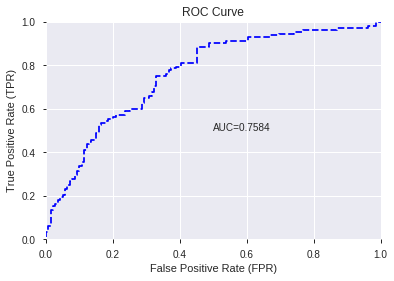

This function is available for GLM models only


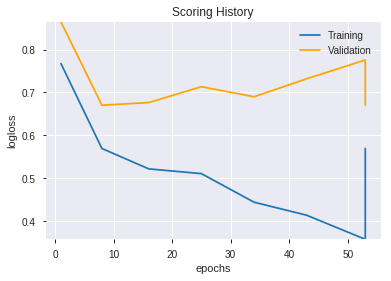

--2019-08-27 20:07:33--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.114.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.114.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


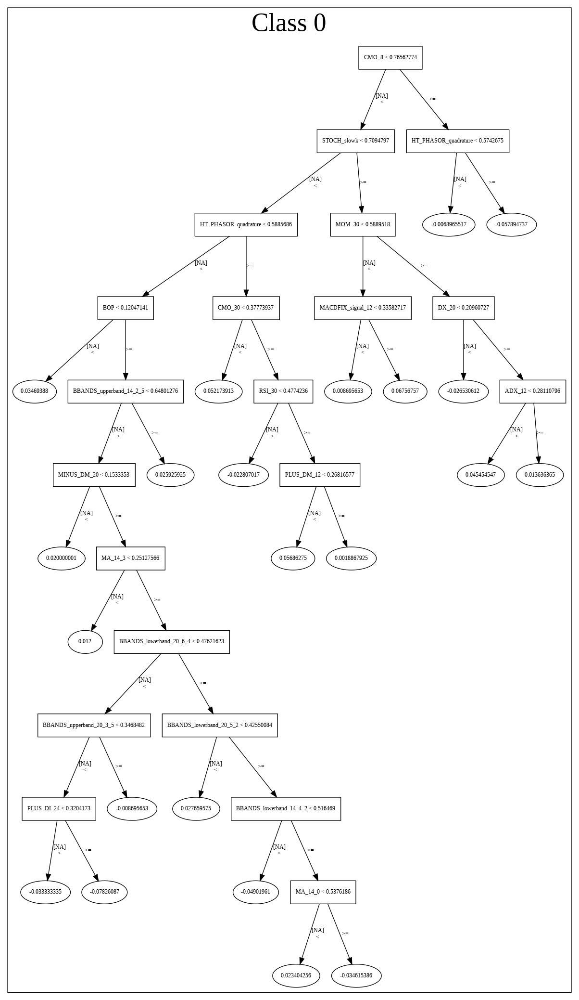

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_200006_model_5',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_200006_model_5',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'DIV',
 'CDLCLOSINGMARUBOZU',
 'HT_PHASOR_quadrature',
 'Volume',
 'COS',
 'CDLSHORTLINE',
 'SIN',
 'dayofweek',
 'MFI_20',
 'weekday_name',
 'SAREXT',
 'STOCHRSI_fastk',
 'weekday',
 'day',
 'aroonup_8',
 'CORREL_30',
 'WILLR_8',
 'aroondown_12',
 'STOCHF_fastk',
 'CDLHANGINGMAN',
 'SUB',
 'CDLLONGLEGGEDDOJI',
 'CDLLONGLINE',
 'aroonup_12',
 'CDLDOJI',
 'CDLEVENINGSTAR',
 'weekofyear',
 'ULTOSC',
 'AROONOSC_8',
 'TRANGE',
 'week',
 'ADOSC',
 'STOCHRSI_fastd',
 'aroondown_8',
 'CDLENGULFING',
 'STOCH_slowd',
 'quarter',
 'WILLR_24',
 'STOCHF_fastd',
 'CDLTAKURI',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'RSI_8',
 'WILLR_14',
 'WILLR_12',
 'WILLR_30',
 'STOCH_slowk',
 'CDLMORNINGSTAR',
 'CDLMARUBOZU']

In [20]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_200740_model_1,0.754432,0.593682,0.298176,0.449716,0.202244


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.367467,1.000000,0.127845
1,CDLCLOSINGMARUBOZU,0.174651,0.475283,0.060763
2,DIV,0.168355,0.458150,0.058572
3,STOCHF_fastk,0.123334,0.335634,0.042909
4,WILLR_8,0.104929,0.285547,0.036506
5,CDLLONGLINE,0.097824,0.266211,0.034034
6,CDLEVENINGSTAR,0.096833,0.263515,0.033689
7,CDLENGULFING,0.086290,0.234824,0.030021
8,STOCHRSI_fastk,0.077869,0.211908,0.027091
9,ULTOSC,0.076209,0.207390,0.026514


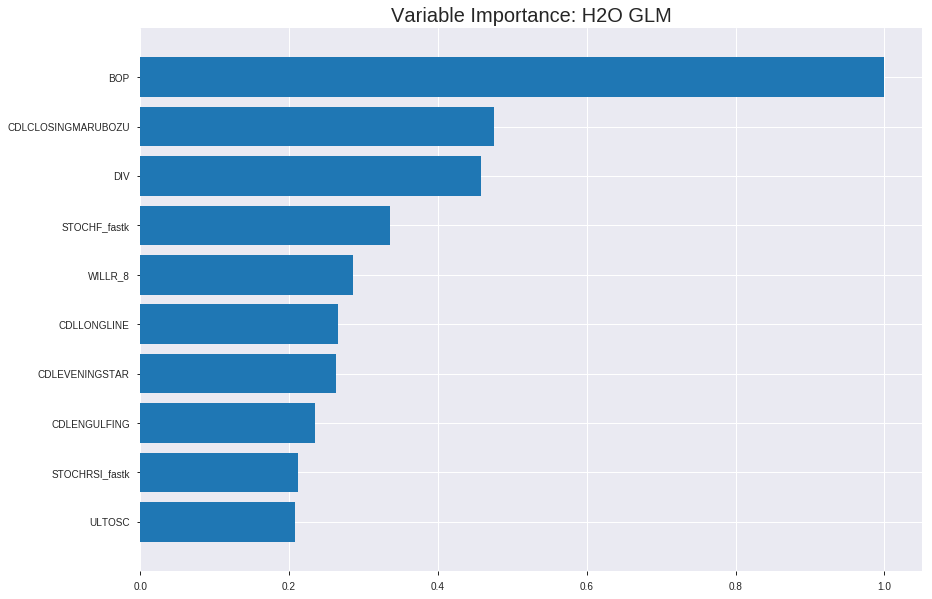

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_200740_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1919096016282709
RMSE: 0.43807488130258154
LogLoss: 0.566260160083285
Null degrees of freedom: 1752
Residual degrees of freedom: 1702
Null deviance: 2420.0736102674464
Residual deviance: 1985.308121251997
AIC: 2087.308121251997
AUC: 0.7764358561460011
pr_auc: 0.7769045889096231
Gini: 0.5528717122920022
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3820823328717105: 


,0,1,Error,Rate
0,336.0,474.0,0.5852,(474.0/810.0)
1,69.0,874.0,0.0732,(69.0/943.0)
Total,405.0,1348.0,0.3098,(543.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3820823,0.7629856,280.0
max f2,0.2497720,0.8713965,336.0
max f0point5,0.5247122,0.7337569,204.0
max accuracy,0.5247122,0.7176269,204.0
max precision,0.9240630,1.0,0.0
max recall,0.1856738,1.0,365.0
max specificity,0.9240630,1.0,0.0
max absolute_mcc,0.5247122,0.4304295,204.0
max min_per_class_accuracy,0.5537239,0.7030753,187.0
max mean_per_class_accuracy,0.5247122,0.7142073,204.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8968970,1.8589608,1.8589608,1.0,0.9103029,1.0,0.9103029,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8731806,1.4458584,1.6524096,0.7777778,0.8846077,0.8888889,0.8974553,0.0148462,0.0339343,44.5858372,65.2409568
,3,0.0302339,0.8567046,1.7496101,1.6835871,0.9411765,0.8654866,0.9056604,0.8872012,0.0169671,0.0509014,74.9610130,68.3587107
,4,0.0405020,0.8448966,1.5491340,1.6495004,0.8333333,0.8516353,0.8873239,0.8781845,0.0159067,0.0668081,54.9133970,64.9500396
,5,0.0501997,0.8310196,1.7496101,1.6688398,0.9411765,0.8376956,0.8977273,0.8703628,0.0169671,0.0837752,74.9610130,66.8839776
,6,0.1003993,0.7848862,1.5843416,1.6265907,0.8522727,0.8063217,0.875,0.8383422,0.0795334,0.1633086,58.4341560,62.6590668
,7,0.1500285,0.7529033,1.4102461,1.5550242,0.7586207,0.7695289,0.8365019,0.8155789,0.0699894,0.2332980,41.0246096,55.5024213
,8,0.2002282,0.7210293,1.4364697,1.5253011,0.7727273,0.7364061,0.8205128,0.7957293,0.0721103,0.3054083,43.6469681,52.5301139
,9,0.3000570,0.6663199,1.3915649,1.4808071,0.7485714,0.6943432,0.7965779,0.7619982,0.1389183,0.4443266,39.1564914,48.0807148
,10,0.3998859,0.6179234,1.2853386,1.4320097,0.6914286,0.6417580,0.7703281,0.7319810,0.1283139,0.5726405,28.5338585,43.2009718




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2100268308563961
RMSE: 0.4582868434249407
LogLoss: 0.6066727498859779
Null degrees of freedom: 500
Residual degrees of freedom: 450
Null deviance: 693.6248861366328
Residual deviance: 607.8860953857499
AIC: 709.8860953857499
AUC: 0.7203965236284627
pr_auc: 0.6984852623339868
Gini: 0.4407930472569255
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3696061334659536: 


,0,1,Error,Rate
0,88.0,150.0,0.6303,(150.0/238.0)
1,21.0,242.0,0.0798,(21.0/263.0)
Total,109.0,392.0,0.3413,(171.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3696061,0.7389313,302.0
max f2,0.2543837,0.8666667,350.0
max f0point5,0.5394372,0.7003745,208.0
max accuracy,0.4828073,0.6886228,242.0
max precision,0.9243528,1.0,0.0
max recall,0.1453603,1.0,382.0
max specificity,0.9243528,1.0,0.0
max absolute_mcc,0.4828073,0.3771788,242.0
max min_per_class_accuracy,0.5505536,0.6680672,198.0
max mean_per_class_accuracy,0.5394372,0.6853452,208.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 53.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8861670,1.5874525,1.5874525,0.8333333,0.9100170,0.8333333,0.9100170,0.0190114,0.0190114,58.7452471,58.7452471
,2,0.0219561,0.8700138,1.5239544,1.5585897,0.8,0.8750401,0.8181818,0.8941184,0.0152091,0.0342205,52.3954373,55.8589699
,3,0.0319361,0.8603014,1.9049430,1.6668251,1.0,0.8649855,0.875,0.8850144,0.0190114,0.0532319,90.4942966,66.6825095
,4,0.0419162,0.8529429,1.1429658,1.5420967,0.6,0.8551172,0.8095238,0.8778960,0.0114068,0.0646388,14.2965779,54.2096687
,5,0.0518962,0.8410599,1.9049430,1.6118748,1.0,0.8466954,0.8461538,0.8718959,0.0190114,0.0836502,90.4942966,61.1874817
,6,0.1017964,0.7885011,1.2953612,1.4567211,0.68,0.8122952,0.7647059,0.8426799,0.0646388,0.1482890,29.5361217,45.6721091
,7,0.1516966,0.7511044,1.3715589,1.4287072,0.72,0.7641194,0.75,0.8168376,0.0684411,0.2167300,37.1558935,42.8707224
,8,0.2015968,0.7254002,1.2191635,1.3768400,0.64,0.7348332,0.7227723,0.7965395,0.0608365,0.2775665,21.9163498,37.6839965
,9,0.3013972,0.6667513,1.2191635,1.3246292,0.64,0.6927276,0.6953642,0.7621647,0.1216730,0.3992395,21.9163498,32.4629215
,10,0.4011976,0.6129159,1.2953612,1.3173486,0.68,0.6383396,0.6915423,0.7313624,0.1292776,0.5285171,29.5361217,31.7348618



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 20:07:41,0.000 sec,2,.22E2,51,1.3602660,1.3688699
,2019-08-27 20:07:41,0.014 sec,4,.14E2,51,1.3500058,1.3608789
,2019-08-27 20:07:41,0.027 sec,6,.86E1,51,1.3358181,1.3497328
,2019-08-27 20:07:41,0.040 sec,8,.53E1,51,1.3172653,1.3349742
,2019-08-27 20:07:41,0.053 sec,10,.33E1,51,1.2943896,1.3165809
,2019-08-27 20:07:41,0.066 sec,12,.21E1,51,1.2679753,1.2952773
,2019-08-27 20:07:41,0.079 sec,14,.13E1,51,1.2396868,1.2728133
,2019-08-27 20:07:41,0.092 sec,16,.79E0,51,1.2118055,1.2516668
,2019-08-27 20:07:41,0.105 sec,18,.49E0,51,1.1863111,1.2342252
,2019-08-27 20:07:41,0.118 sec,20,.31E0,51,1.1645159,1.2219741


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.701195219123506)

('F1', 0.7142857142857143)

('auc', 0.7544321685508736)

('logloss', 0.5936817779600515)

('mean_per_class_error', 0.29592754367934226)

('rmse', 0.44971569504121184)

('mse', 0.20224420636640025)

glm prediction progress: |████████████████████████████████████████████████| 100%


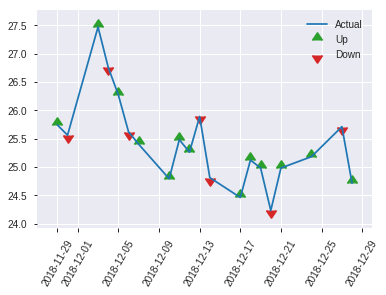


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.20224420636640025
RMSE: 0.44971569504121184
LogLoss: 0.5936817779600515
Null degrees of freedom: 250
Residual degrees of freedom: 200
Null deviance: 353.51374206928267
Residual deviance: 298.02825253594585
AIC: 400.02825253594585
AUC: 0.7544321685508736
pr_auc: 0.6772600837485456
Gini: 0.5088643371017472
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4007339491466925: 


,0,1,Error,Rate
0,71.0,68.0,0.4892,(68.0/139.0)
1,12.0,100.0,0.1071,(12.0/112.0)
Total,83.0,168.0,0.3187,(80.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4007339,0.7142857,167.0
max f2,0.2320993,0.8207831,215.0
max f0point5,0.5957468,0.6651376,80.0
max accuracy,0.5088679,0.7011952,122.0
max precision,0.9218966,1.0,0.0
max recall,0.0602603,1.0,250.0
max specificity,0.9218966,1.0,0.0
max absolute_mcc,0.4007339,0.4265069,167.0
max min_per_class_accuracy,0.5093007,0.6906475,120.0
max mean_per_class_accuracy,0.4804754,0.7040725,135.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 48.81 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.8848497,1.4940476,1.4940476,0.6666667,0.8992559,0.6666667,0.8992559,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.8804248,1.4940476,1.4940476,0.6666667,0.8819456,0.6666667,0.8906007,0.0178571,0.0357143,49.4047619,49.4047619
,3,0.0318725,0.8519710,2.2410714,1.6808036,1.0,0.8573800,0.75,0.8822955,0.0178571,0.0535714,124.1071429,68.0803571
,4,0.0438247,0.8271537,2.2410714,1.8336039,1.0,0.8383766,0.8181818,0.8703176,0.0267857,0.0803571,124.1071429,83.3603896
,5,0.0517928,0.7925518,2.2410714,1.8962912,1.0,0.8073741,0.8461538,0.8606340,0.0178571,0.0982143,124.1071429,89.6291209
,6,0.1035857,0.7357539,1.7239011,1.8100962,0.7692308,0.7613445,0.8076923,0.8109892,0.0892857,0.1875,72.3901099,81.0096154
,7,0.1513944,0.7062984,1.4940476,1.7102914,0.6666667,0.7183067,0.7631579,0.7817211,0.0714286,0.2589286,49.4047619,71.0291353
,8,0.2031873,0.6696837,1.3791209,1.6258754,0.6153846,0.6841712,0.7254902,0.7568554,0.0714286,0.3303571,37.9120879,62.5875350
,9,0.3027888,0.6144387,1.4342857,1.5628524,0.64,0.6430530,0.6973684,0.7194204,0.1428571,0.4732143,43.4285714,56.2852444
,10,0.4023904,0.5638967,1.1653571,1.4644625,0.52,0.5860518,0.6534653,0.6864084,0.1160714,0.5892857,16.5357143,46.4462518


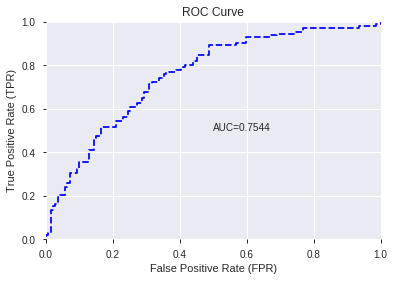

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


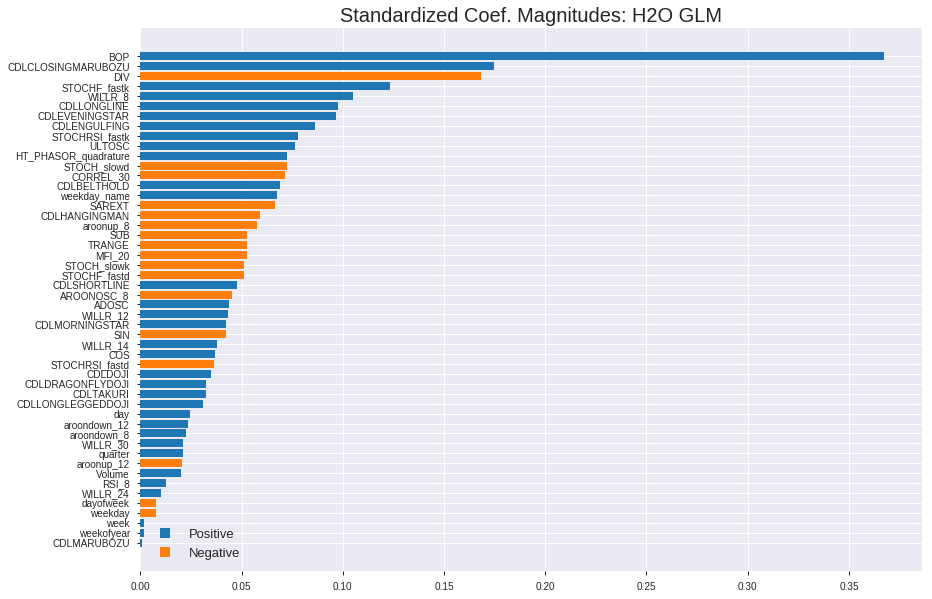

'log_likelihood'
--2019-08-27 20:07:47--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.133.187
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.133.187|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


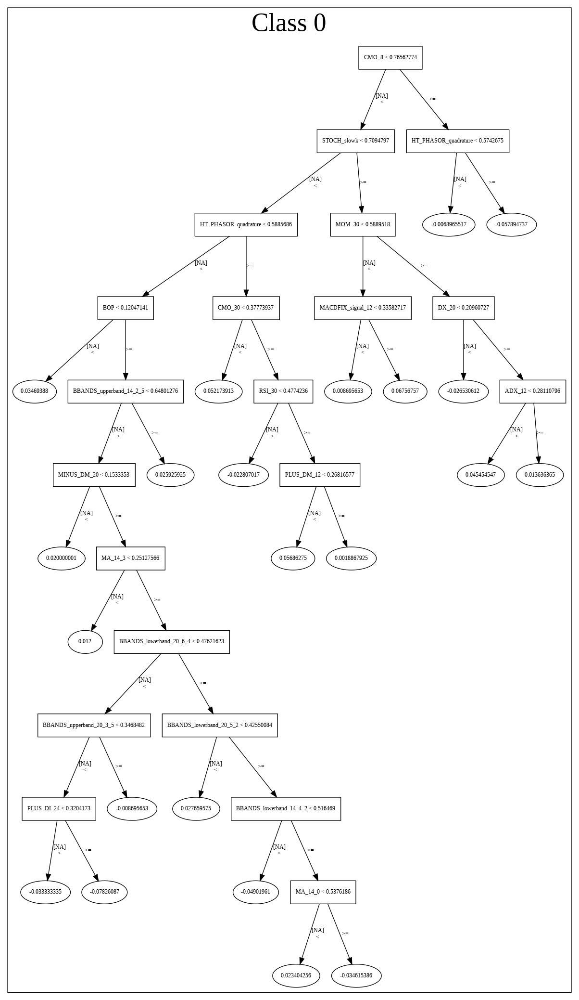

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_200740_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_200740_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['BOP',
 'CDLCLOSINGMARUBOZU',
 'DIV',
 'STOCHF_fastk',
 'WILLR_8',
 'CDLLONGLINE',
 'CDLEVENINGSTAR',
 'CDLENGULFING',
 'STOCHRSI_fastk',
 'ULTOSC',
 'HT_PHASOR_quadrature',
 'STOCH_slowd',
 'CORREL_30',
 'CDLBELTHOLD',
 'weekday_name',
 'SAREXT',
 'CDLHANGINGMAN',
 'aroonup_8',
 'SUB',
 'TRANGE',
 'MFI_20',
 'STOCH_slowk',
 'STOCHF_fastd',
 'CDLSHORTLINE',
 'AROONOSC_8',
 'ADOSC',
 'WILLR_12',
 'CDLMORNINGSTAR',
 'SIN',
 'WILLR_14',
 'COS',
 'STOCHRSI_fastd',
 'CDLDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CDLLONGLEGGEDDOJI',
 'day',
 'aroondown_12',
 'aroondown_8',
 'WILLR_30',
 'quarter',
 'aroonup_12',
 'Volume',
 'RSI_8',
 'WILLR_24',
 'dayofweek',
 'weekday',
 'week',
 'weekofyear',
 'CDLMARUBOZU']

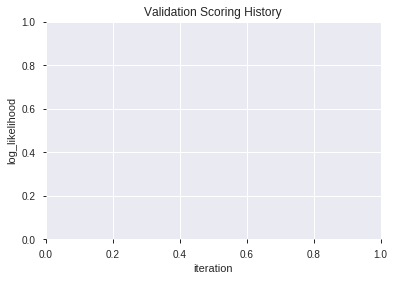

In [21]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190827_200754_model_4,0.757194,0.586052,0.269142,0.446962,0.199775
1,XGBoost_grid_1_AutoML_20190827_200754_model_3,0.753597,0.595780,0.300649,0.452647,0.204889
2,XGBoost_grid_1_AutoML_20190827_200754_model_6,0.752248,0.593350,0.311440,0.451726,0.204057
3,XGBoost_2_AutoML_20190827_200754,0.751991,0.596285,0.284526,0.451818,0.204139
4,XGBoost_grid_1_AutoML_20190827_200754_model_1,0.750835,0.597138,0.309834,0.452998,0.205207
5,XGBoost_grid_1_AutoML_20190827_200754_model_2,0.747109,0.598533,0.303507,0.453370,0.205544
6,XGBoost_grid_1_AutoML_20190827_200754_model_7,0.741200,0.611697,0.319630,0.459393,0.211042
7,XGBoost_1_AutoML_20190827_200754,0.740879,0.599032,0.293455,0.454017,0.206132
8,XGBoost_3_AutoML_20190827_200754,0.738502,0.605770,0.279933,0.456376,0.208279
9,XGBoost_grid_1_AutoML_20190827_200754_model_5,0.722187,0.625510,0.305852,0.465381,0.216580


,variable,relative_importance,scaled_importance,percentage
0,BOP,2653.668945,1.000000,0.520971
1,DIV,362.802917,0.136717,0.071226
2,STOCHF_fastk,282.667450,0.106519,0.055494
3,SUB,142.726074,0.053784,0.028020
4,HT_PHASOR_quadrature,127.183289,0.047927,0.024969
5,WILLR_8,121.977448,0.045966,0.023947
6,SAREXT,103.271072,0.038916,0.020274
7,CORREL_30,102.709084,0.038705,0.020164
8,aroonup_8,91.696098,0.034554,0.018002
9,week,84.581024,0.031873,0.016605


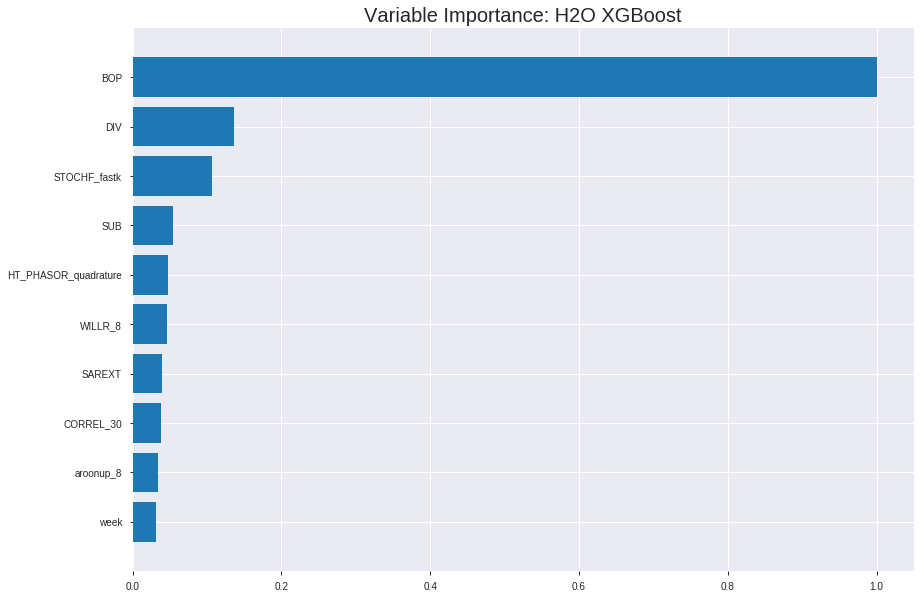

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190827_200754_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17279172218658112
RMSE: 0.41568223703519147
LogLoss: 0.5228044650129597
Mean Per-Class Error: 0.25373381511592896
AUC: 0.8272940313944203
pr_auc: 0.8381912415731378
Gini: 0.6545880627888405
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4349531352519989: 


,0,1,Error,Rate
0,485.0,325.0,0.4012,(325.0/810.0)
1,122.0,821.0,0.1294,(122.0/943.0)
Total,607.0,1146.0,0.255,(447.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4349531,0.7860220,242.0
max f2,0.2140960,0.8776198,350.0
max f0point5,0.6395396,0.7874435,139.0
max accuracy,0.5078260,0.7507131,207.0
max precision,0.8872794,1.0,0.0
max recall,0.1493765,1.0,381.0
max specificity,0.8872794,1.0,0.0
max absolute_mcc,0.6395396,0.4978376,139.0
max min_per_class_accuracy,0.5615766,0.7401909,182.0
max mean_per_class_accuracy,0.5078260,0.7462662,207.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8690033,1.8589608,1.8589608,1.0,0.8760815,1.0,0.8760815,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8637519,1.7556852,1.8073230,0.9444444,0.8660065,0.9722222,0.8710440,0.0180276,0.0371156,75.5685166,80.7322965
,3,0.0302339,0.8583052,1.8589608,1.8238860,1.0,0.8605409,0.9811321,0.8676751,0.0180276,0.0551432,85.8960764,82.3886032
,4,0.0405020,0.8510387,1.8589608,1.8327782,1.0,0.8547608,0.9859155,0.8644010,0.0190880,0.0742312,85.8960764,83.2778218
,5,0.0501997,0.8445192,1.5309089,1.7744625,0.8235294,0.8486349,0.9545455,0.8613553,0.0148462,0.0890774,53.0908864,77.4462547
,6,0.1003993,0.8090083,1.6688398,1.7216512,0.8977273,0.8264369,0.9261364,0.8438961,0.0837752,0.1728526,66.8839776,72.1651162
,7,0.1500285,0.7835137,1.7093892,1.7175949,0.9195402,0.7968089,0.9239544,0.8283197,0.0848356,0.2576882,70.9389208,71.7594926
,8,0.2002282,0.7510653,1.4575942,1.6524096,0.7840909,0.7674398,0.8888889,0.8130564,0.0731707,0.3308590,45.7594235,65.2409568
,9,0.3000570,0.6968946,1.5402818,1.6151047,0.8285714,0.7214623,0.8688213,0.7825831,0.1537646,0.4846235,54.0281775,61.5104694
,10,0.3998859,0.6397553,1.4128102,1.5646032,0.76,0.6703889,0.8416548,0.7545745,0.1410392,0.6256628,41.2810180,56.4603210




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.21092998925348552
RMSE: 0.4592711500339266
LogLoss: 0.609944021677395
Mean Per-Class Error: 0.3220516343419497
AUC: 0.7258043901971435
pr_auc: 0.6974865659369097
Gini: 0.451608780394287
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.317183256149292: 


,0,1,Error,Rate
0,88.0,150.0,0.6303,(150.0/238.0)
1,17.0,246.0,0.0646,(17.0/263.0)
Total,105.0,396.0,0.3333,(167.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3171833,0.7465857,311.0
max f2,0.2279375,0.8651316,369.0
max f0point5,0.4941806,0.6900068,236.0
max accuracy,0.4941806,0.6826347,236.0
max precision,0.8682942,1.0,0.0
max recall,0.2279375,1.0,369.0
max specificity,0.8682942,1.0,0.0
max absolute_mcc,0.3171833,0.3743513,311.0
max min_per_class_accuracy,0.5940077,0.6387833,192.0
max mean_per_class_accuracy,0.4941806,0.6779484,236.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 54.63 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8609521,1.2699620,1.2699620,0.6666667,0.8643624,0.6666667,0.8643624,0.0152091,0.0152091,26.9961977,26.9961977
,2,0.0219561,0.8527207,1.5239544,1.3854131,0.8,0.8551929,0.7272727,0.8601944,0.0152091,0.0304183,52.3954373,38.5413066
,3,0.0319361,0.8506843,1.1429658,1.3096483,0.6,0.8509578,0.6875,0.8573080,0.0114068,0.0418251,14.2965779,30.9648289
,4,0.0419162,0.8455787,1.1429658,1.2699620,0.6,0.8465797,0.6666667,0.8547536,0.0114068,0.0532319,14.2965779,26.9961977
,5,0.0518962,0.8432868,1.5239544,1.3188067,0.8,0.8444200,0.6923077,0.8527664,0.0152091,0.0684411,52.3954373,31.8806669
,6,0.1017964,0.8139753,1.5239544,1.4193693,0.8,0.8304583,0.7450980,0.8418311,0.0760456,0.1444867,52.3954373,41.9369269
,7,0.1516966,0.7805019,1.6001521,1.4788373,0.84,0.7973802,0.7763158,0.8272091,0.0798479,0.2243346,60.0152091,47.8837302
,8,0.2015968,0.7474524,1.5239544,1.4900049,0.8,0.7643926,0.7821782,0.8116604,0.0760456,0.3003802,52.3954373,49.0004894
,9,0.3013972,0.6938881,1.1810646,1.3877068,0.62,0.7217401,0.7284768,0.7818855,0.1178707,0.4182510,18.1064639,38.7706796
,10,0.4011976,0.6475313,1.2572624,1.3552579,0.66,0.6733361,0.7114428,0.7548832,0.1254753,0.5437262,25.7262357,35.5257931



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 20:08:01,3.171 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4620650,0.5,0.6931472,0.5,0.0,1.0,0.4750499
,2019-08-27 20:08:02,3.278 sec,5.0,0.4753093,0.6446865,0.7987589,0.7647981,1.6973120,0.2806617,0.4831388,0.6598043,0.7030546,0.6427929,1.7688756,0.3293413
,2019-08-27 20:08:02,3.343 sec,10.0,0.4584195,0.6118919,0.8028187,0.7902663,1.7815041,0.2703936,0.4732656,0.6402166,0.7137905,0.6685198,1.9049430,0.3512974
,2019-08-27 20:08:02,3.408 sec,15.0,0.4466641,0.5885774,0.8045625,0.7952246,1.8589608,0.2743868,0.4661599,0.6257354,0.7193261,0.6736097,1.9049430,0.3512974
,2019-08-27 20:08:02,3.483 sec,20.0,0.4391793,0.5734260,0.8079900,0.8082454,1.7261779,0.2703936,0.4625915,0.6181982,0.7235118,0.6839146,1.5874525,0.3473054
,2019-08-27 20:08:02,3.546 sec,25.0,0.4334610,0.5614179,0.8105338,0.8205942,1.8589608,0.2681118,0.4610221,0.6146070,0.7220740,0.6890835,1.5874525,0.3293413
,2019-08-27 20:08:02,3.618 sec,30.0,0.4290783,0.5520358,0.8130860,0.8222755,1.8589608,0.2572732,0.4598866,0.6120640,0.7236716,0.6922136,1.5874525,0.3373253
,2019-08-27 20:08:02,3.860 sec,35.0,0.4256552,0.5447431,0.8170948,0.8268906,1.8589608,0.2561323,0.4585934,0.6091504,0.7263875,0.6973831,1.5874525,0.3313373
,2019-08-27 20:08:02,3.936 sec,40.0,0.4227765,0.5385193,0.8193466,0.8288739,1.8589608,0.2618369,0.4580688,0.6076932,0.7281848,0.7024987,1.9049430,0.3433134
,2019-08-27 20:08:02,4.017 sec,45.0,0.4199996,0.5324744,0.8226215,0.8339781,1.8589608,0.2572732,0.4579696,0.6074389,0.7284484,0.7024911,1.2699620,0.3333333


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,2653.6689453,1.0,0.5209711
DIV,362.8029175,0.1367175,0.0712259
STOCHF_fastk,282.6674500,0.1065195,0.0554936
SUB,142.7260742,0.0537844,0.0280201
HT_PHASOR_quadrature,127.1832886,0.0479273,0.0249688
---,---,---,---
dayofweek,18.2270184,0.0068686,0.0035783
RSI_8,12.1655712,0.0045844,0.0023884
AROONOSC_8,9.4684544,0.0035681,0.0018589
CDLLONGLINE,4.5259972,0.0017056,0.0008885



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7211155378486056)

('F1', 0.7244094488188976)

('auc', 0.7571942446043165)

('logloss', 0.5860519831166711)

('mean_per_class_error', 0.26914182939362796)

('rmse', 0.44696191760875753)

('mse', 0.19977495579249777)

xgboost prediction progress: |████████████████████████████████████████████| 100%


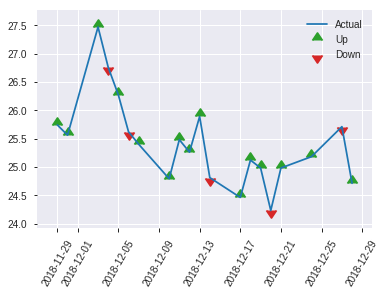


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.19977495579249777
RMSE: 0.44696191760875753
LogLoss: 0.5860519831166711
Mean Per-Class Error: 0.26914182939362796
AUC: 0.7571942446043165
pr_auc: 0.6826618175631364
Gini: 0.514388489208633
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4546646475791931: 


,0,1,Error,Rate
0,89.0,50.0,0.3597,(50.0/139.0)
1,20.0,92.0,0.1786,(20.0/112.0)
Total,109.0,142.0,0.2789,(70.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4546646,0.7244094,141.0
max f2,0.3206875,0.8227848,183.0
max f0point5,0.4546646,0.6764706,141.0
max accuracy,0.4546646,0.7211155,141.0
max precision,0.8655576,1.0,0.0
max recall,0.1577706,1.0,245.0
max specificity,0.8655576,1.0,0.0
max absolute_mcc,0.4546646,0.4630568,141.0
max min_per_class_accuracy,0.5426146,0.6978417,120.0
max mean_per_class_accuracy,0.4546646,0.7308582,141.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 50.23 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.8535112,1.4940476,1.4940476,0.6666667,0.8621202,0.6666667,0.8621202,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.8475673,2.2410714,1.8675595,1.0,0.8499550,0.8333333,0.8560376,0.0267857,0.0446429,124.1071429,86.7559524
,3,0.0318725,0.8355790,2.2410714,1.9609375,1.0,0.8409637,0.875,0.8522691,0.0178571,0.0625,124.1071429,96.09375
,4,0.0438247,0.8288789,1.4940476,1.8336039,0.6666667,0.8312198,0.8181818,0.8465284,0.0178571,0.0803571,49.4047619,83.3603896
,5,0.0517928,0.8029224,2.2410714,1.8962912,1.0,0.8055631,0.8461538,0.8402260,0.0178571,0.0982143,124.1071429,89.6291209
,6,0.1035857,0.7574037,1.7239011,1.8100962,0.7692308,0.7809719,0.8076923,0.8105989,0.0892857,0.1875,72.3901099,81.0096154
,7,0.1513944,0.7330311,1.4940476,1.7102914,0.6666667,0.7433964,0.7631579,0.7893771,0.0714286,0.2589286,49.4047619,71.0291353
,8,0.2031873,0.7188482,1.3791209,1.6258754,0.6153846,0.7248641,0.7254902,0.7729326,0.0714286,0.3303571,37.9120879,62.5875350
,9,0.3027888,0.6671053,1.1653571,1.4743891,0.52,0.6916513,0.6578947,0.7461953,0.1160714,0.4464286,16.5357143,47.4389098
,10,0.4023904,0.6232107,1.6135714,1.5088402,0.72,0.6431265,0.6732673,0.7206832,0.1607143,0.6071429,61.3571429,50.8840170


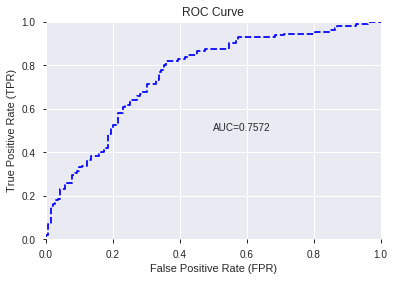

This function is available for GLM models only


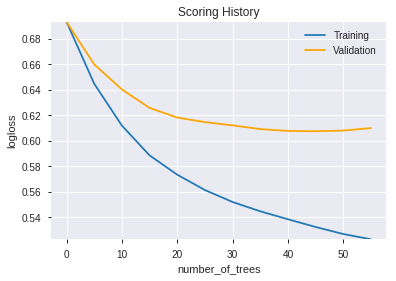

--2019-08-27 20:08:13--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.146.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.146.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

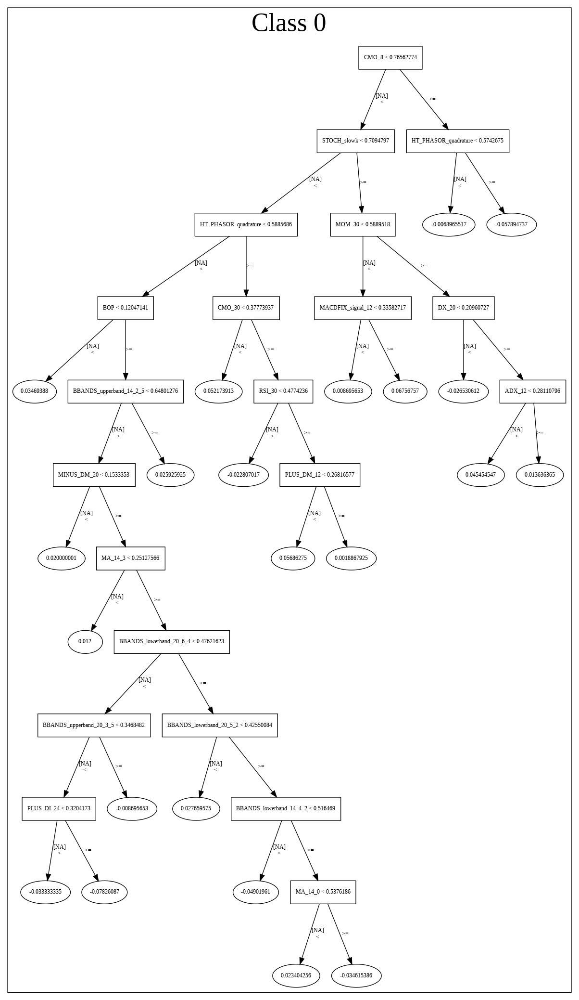

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190827_200754_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190827_200754_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'DIV',
 'STOCHF_fastk',
 'SUB',
 'HT_PHASOR_quadrature',
 'WILLR_8',
 'SAREXT',
 'CORREL_30',
 'aroonup_8',
 'week',
 'aroondown_12',
 'WILLR_24',
 'STOCH_slowd',
 'COS',
 'Volume',
 'TRANGE',
 'MFI_20',
 'WILLR_30',
 'SIN',
 'STOCHRSI_fastd',
 'aroonup_12',
 'weekday_name',
 'ADOSC',
 'WILLR_12',
 'STOCH_slowk',
 'ULTOSC',
 'STOCHRSI_fastk',
 'WILLR_14',
 'quarter',
 'day',
 'aroondown_8',
 'dayofweek',
 'RSI_8',
 'AROONOSC_8',
 'CDLLONGLINE',
 'CDLBELTHOLD']

In [22]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [24]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [25]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [26]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [28]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [29]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [30]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [32]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [33]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [34]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [36]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [37]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [38]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [40]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [41]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [42]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [44]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [45]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [46]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [47]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [900 916] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


41

['BOP',
 'CCI_8',
 'CMO_8',
 'MINUS_DI_8',
 'MOM_8',
 'ROC_8',
 'ROCP_8',
 'ROCR_8',
 'ROCR100_8',
 'RSI_8',
 'WILLR_8',
 'CCI_12',
 'CMO_12',
 'RSI_12',
 'WILLR_12',
 'CCI_14',
 'CMO_14',
 'RSI_14',
 'WILLR_14',
 'CMO_20',
 'RSI_20',
 'WILLR_20',
 'CMO_24',
 'RSI_24',
 'WILLR_24',
 'WILLR_30',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'ULTOSC',
 'ADOSC',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLENGULFING',
 'CDLEVENINGSTAR',
 'CDLLONGLINE',
 'CDLMARUBOZU',
 'CDLSHORTLINE',
 'DIV']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_200821_model_6,0.753918,0.653494,0.283916,0.473653,0.224347
1,DeepLearning_grid_1_AutoML_20190827_200821_model_4,0.749422,0.733930,0.281186,0.480459,0.230841
2,DeepLearning_grid_1_AutoML_20190827_200821_model_8,0.746724,0.628704,0.294450,0.459380,0.211030
3,DeepLearning_grid_1_AutoML_20190827_200821_model_7,0.742870,0.676299,0.274602,0.464597,0.215851
4,DeepLearning_grid_1_AutoML_20190827_200821_model_5,0.741714,0.731539,0.306366,0.505065,0.255091
5,DeepLearning_grid_1_AutoML_20190827_200821_model_9,0.737795,0.610722,0.313431,0.459971,0.211573
6,DeepLearning_1_AutoML_20190827_200821,0.728674,0.796381,0.322232,0.524871,0.275489
7,DeepLearning_grid_1_AutoML_20190827_200821_model_3,0.725591,0.778240,0.316290,0.463202,0.214556
8,DeepLearning_grid_1_AutoML_20190827_200821_model_1,0.723728,0.798460,0.316900,0.476380,0.226938
9,DeepLearning_grid_1_AutoML_20190827_200821_model_2,0.699961,0.946802,0.344810,0.513454,0.263635


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.064212
1,CDLSHORTLINE,0.919930,0.919930,0.059071
2,CDLCLOSINGMARUBOZU,0.886268,0.886268,0.056909
3,DIV,0.759862,0.759862,0.048792
4,CDLLONGLINE,0.568364,0.568364,0.036496
5,CDLBELTHOLD,0.526570,0.526570,0.033812
6,CDLMARUBOZU,0.495868,0.495868,0.031841
7,STOCHF_fastk,0.477941,0.477941,0.030690
8,STOCHRSI_fastk,0.459513,0.459513,0.029506
9,WILLR_8,0.429572,0.429572,0.027584


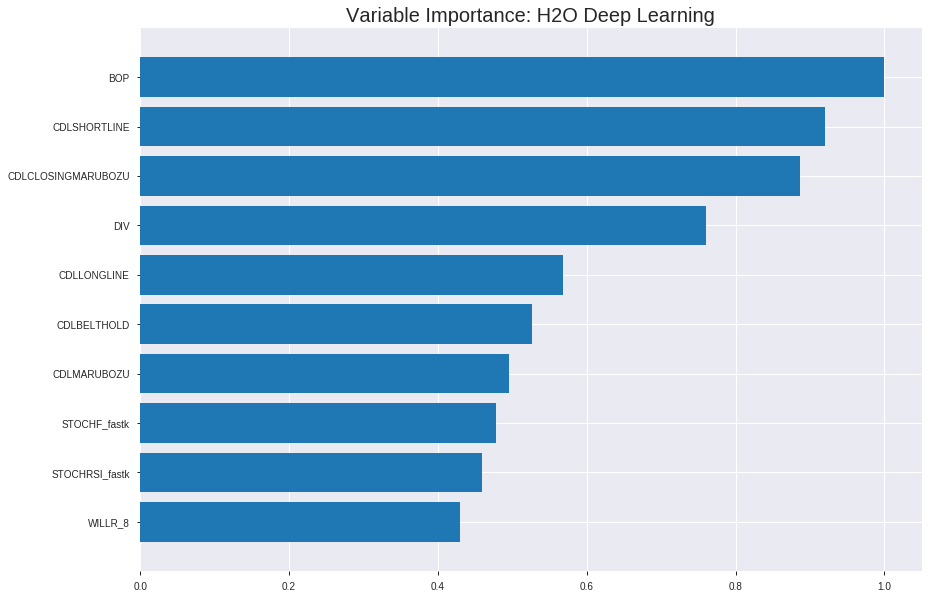

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_200821_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19180090920007
RMSE: 0.4379508068266001
LogLoss: 0.5697045143828279
Mean Per-Class Error: 0.27798986685519034
AUC: 0.7854725527931607
pr_auc: 0.7846442644388364
Gini: 0.5709451055863215
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5807366679416697: 


,0,1,Error,Rate
0,487.0,323.0,0.3988,(323.0/810.0)
1,152.0,791.0,0.1612,(152.0/943.0)
Total,639.0,1114.0,0.271,(475.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5807367,0.7690812,205.0
max f2,0.2360046,0.8709616,326.0
max f0point5,0.6653846,0.7395811,167.0
max accuracy,0.5807367,0.7290359,205.0
max precision,0.9968533,1.0,0.0
max recall,0.0771597,1.0,382.0
max specificity,0.9968533,1.0,0.0
max absolute_mcc,0.5807367,0.4558314,205.0
max min_per_class_accuracy,0.6680778,0.7111111,165.0
max mean_per_class_accuracy,0.6272499,0.7220101,186.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 61.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.9874694,1.7556852,1.7556852,0.9444444,0.9903027,0.9444444,0.9903027,0.0180276,0.0180276,75.5685166,75.5685166
,2,0.0205362,0.9844851,1.7556852,1.7556852,0.9444444,0.9859744,0.9444444,0.9881385,0.0180276,0.0360551,75.5685166,75.5685166
,3,0.0302339,0.9653284,1.4215582,1.6485124,0.7647059,0.9771271,0.8867925,0.9846066,0.0137858,0.0498409,42.1558231,64.8512375
,4,0.0405020,0.9533929,1.7556852,1.6756829,0.9444444,0.9592009,0.9014085,0.9781657,0.0180276,0.0678685,75.5685166,67.5682942
,5,0.0501997,0.9471482,1.5309089,1.6477152,0.8235294,0.9504900,0.8863636,0.9728193,0.0148462,0.0827147,53.0908864,64.7715222
,6,0.1003993,0.9017269,1.5632170,1.6054661,0.8409091,0.9202742,0.8636364,0.9465467,0.0784730,0.1611877,56.3217006,60.5466114
,7,0.1500285,0.8685197,1.5384503,1.5832974,0.8275862,0.8863206,0.8517110,0.9266240,0.0763521,0.2375398,53.8450287,58.3297380
,8,0.2002282,0.8328847,1.5420925,1.5729668,0.8295455,0.8528765,0.8461538,0.9081346,0.0774125,0.3149523,54.2092452,57.2966800
,9,0.3000570,0.7671086,1.2959612,1.4808071,0.6971429,0.7945388,0.7965779,0.8703413,0.1293743,0.4443266,29.5961218,48.0807148
,10,0.3998859,0.7249123,1.3172065,1.4399653,0.7085714,0.7461453,0.7746077,0.8393366,0.1314952,0.5758218,31.7206484,43.9965328




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.22828974619727765
RMSE: 0.4777967624390915
LogLoss: 0.6619138527324891
Mean Per-Class Error: 0.33786784675847525
AUC: 0.7197335207847397
pr_auc: 0.7189299833597016
Gini: 0.43946704156947947
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5007886325695393: 


,0,1,Error,Rate
0,87.0,151.0,0.6345,(151.0/238.0)
1,24.0,239.0,0.0913,(24.0/263.0)
Total,111.0,390.0,0.3493,(175.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5007886,0.7320061,297.0
max f2,0.2329356,0.8549568,354.0
max f0point5,0.6946574,0.6792018,190.0
max accuracy,0.6518978,0.6666667,227.0
max precision,0.9918049,1.0,0.0
max recall,0.0890632,1.0,391.0
max specificity,0.9918049,1.0,0.0
max absolute_mcc,0.6518978,0.3316327,227.0
max min_per_class_accuracy,0.6984284,0.6539924,185.0
max mean_per_class_accuracy,0.6946574,0.6621322,190.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 64.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.9888508,1.5874525,1.5874525,0.8333333,0.9900049,0.8333333,0.9900049,0.0190114,0.0190114,58.7452471,58.7452471
,2,0.0219561,0.9860745,1.9049430,1.7317663,1.0,0.9869654,0.9090909,0.9886233,0.0190114,0.0380228,90.4942966,73.1766333
,3,0.0319361,0.9841632,1.5239544,1.6668251,0.8,0.9848980,0.875,0.9874591,0.0152091,0.0532319,52.3954373,66.6825095
,4,0.0419162,0.9576192,1.5239544,1.6328083,0.8,0.9684307,0.8571429,0.9829286,0.0152091,0.0684411,52.3954373,63.2808256
,5,0.0518962,0.9490479,1.5239544,1.6118748,0.8,0.9534052,0.8461538,0.9772510,0.0152091,0.0836502,52.3954373,61.1874817
,6,0.1017964,0.9083336,1.4477567,1.5314247,0.76,0.9308694,0.8039216,0.9545149,0.0722433,0.1558935,44.7756654,53.1424737
,7,0.1516966,0.8807170,1.5239544,1.5289674,0.8,0.8944658,0.8026316,0.9347619,0.0760456,0.2319392,52.3954373,52.8967380
,8,0.2015968,0.8311851,1.1429658,1.4334224,0.6,0.8545208,0.7524752,0.9149003,0.0570342,0.2889734,14.2965779,43.3422430
,9,0.3013972,0.7625744,1.3334601,1.4003223,0.7,0.7896365,0.7350993,0.8734222,0.1330798,0.4220532,33.3460076,40.0322313
,10,0.4011976,0.7278931,1.2191635,1.3552579,0.64,0.7470343,0.7114428,0.8419824,0.1216730,0.5437262,21.9163498,35.5257931



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 20:12:59,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 20:13:01,2 min 24.632 sec,953 obs/sec,1.0,1,1753.0,0.5587821,1.2295146,-0.2561807,0.7649104,0.7217191,1.6524096,0.3166001,0.6038282,1.6210187,-0.4620744,0.7173132,0.7113115,1.9049430,0.3712575
,2019-08-27 20:13:06,2 min 30.026 sec,1828 obs/sec,7.0,7,12271.0,0.4580632,0.6129269,0.1558532,0.7727930,0.7718155,1.8589608,0.2983457,0.4958540,0.7110242,0.0140601,0.7239592,0.7215045,1.9049430,0.3572854
,2019-08-27 20:13:12,2 min 35.671 sec,2516 obs/sec,17.0,17,29801.0,0.4516782,0.5957849,0.1792224,0.7774269,0.7795048,1.7556852,0.3023388,0.4858999,0.6784169,0.0532478,0.7142937,0.7080060,1.9049430,0.3273453
,2019-08-27 20:13:17,2 min 41.040 sec,2836 obs/sec,27.0,27,47331.0,0.4478743,0.5869283,0.1929890,0.7840344,0.7839247,1.6524096,0.2812322,0.4842314,0.6716067,0.0597386,0.7177765,0.7136601,1.9049430,0.3393214
,2019-08-27 20:13:23,2 min 46.359 sec,3016 obs/sec,37.0,37,64861.0,0.4441836,0.5832337,0.2062345,0.7815463,0.7816177,1.7556852,0.3023388,0.4824208,0.6746559,0.0667571,0.7170176,0.7097859,1.5874525,0.3512974
,2019-08-27 20:13:28,2 min 51.629 sec,3140 obs/sec,47.0,47,82391.0,0.4379508,0.5697045,0.2283546,0.7854726,0.7846443,1.7556852,0.2709641,0.4777968,0.6619139,0.0845615,0.7197335,0.7189300,1.5874525,0.3493014
,2019-08-27 20:13:33,2 min 57.109 sec,3260 obs/sec,58.0,58,101674.0,0.4405880,0.5750329,0.2190335,0.7856617,0.7802620,1.7556852,0.2886480,0.4814771,0.6713527,0.0704043,0.7177605,0.7141833,1.5874525,0.3453094
,2019-08-27 20:13:39,3 min 2.517 sec,3352 obs/sec,69.0,69,120957.0,0.4413568,0.5777393,0.2163054,0.7889157,0.7832389,1.8589608,0.2972048,0.4846803,0.6797912,0.0579945,0.7211554,0.7209647,1.9049430,0.3552894
,2019-08-27 20:13:39,3 min 3.038 sec,3350 obs/sec,69.0,69,120957.0,0.4379508,0.5697045,0.2283546,0.7854726,0.7846443,1.7556852,0.2709641,0.4777968,0.6619139,0.0845615,0.7197335,0.7189300,1.5874525,0.3493014


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0642122
CDLSHORTLINE,0.9199300,0.9199300,0.0590707
CDLCLOSINGMARUBOZU,0.8862678,0.8862678,0.0569092
DIV,0.7598624,0.7598624,0.0487924
CDLLONGLINE,0.5683637,0.5683637,0.0364959
---,---,---,---
CDLEVENINGSTAR,0.2633084,0.2633084,0.0169076
WILLR_20,0.2586048,0.2586048,0.0166056
RSI_8,0.2569930,0.2569930,0.0165021
CMO_8,0.2564530,0.2564530,0.0164674



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7091633466135459)

('F1', 0.7298245614035088)

('auc', 0.7539182939362796)

('logloss', 0.6534943092597687)

('mean_per_class_error', 0.2820529290853032)

('rmse', 0.4736527350249948)

('mse', 0.2243469133966579)

deeplearning prediction progress: |███████████████████████████████████████| 100%


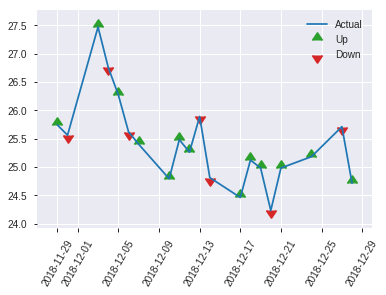


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2243469133966579
RMSE: 0.4736527350249948
LogLoss: 0.6534943092597687
Mean Per-Class Error: 0.2820529290853032
AUC: 0.7539182939362796
pr_auc: 0.6663725850541037
Gini: 0.5078365878725593
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5683034339213243: 


,0,1,Error,Rate
0,70.0,69.0,0.4964,(69.0/139.0)
1,8.0,104.0,0.0714,(8.0/112.0)
Total,78.0,173.0,0.3068,(77.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5683034,0.7298246,172.0
max f2,0.5683034,0.8373591,172.0
max f0point5,0.6662471,0.6687898,128.0
max accuracy,0.6662471,0.7091633,128.0
max precision,0.9930940,1.0,0.0
max recall,0.0582022,1.0,249.0
max specificity,0.9930940,1.0,0.0
max absolute_mcc,0.5683034,0.4641937,172.0
max min_per_class_accuracy,0.6763623,0.6875,119.0
max mean_per_class_accuracy,0.5801028,0.7179471,167.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 59.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.9844418,1.4940476,1.4940476,0.6666667,0.9888677,0.6666667,0.9888677,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.9575915,1.4940476,1.4940476,0.6666667,0.9695042,0.6666667,0.9791860,0.0178571,0.0357143,49.4047619,49.4047619
,3,0.0318725,0.9445429,2.2410714,1.6808036,1.0,0.9495040,0.75,0.9717655,0.0178571,0.0535714,124.1071429,68.0803571
,4,0.0438247,0.9312944,1.4940476,1.6298701,0.6666667,0.9391536,0.7272727,0.9628713,0.0178571,0.0714286,49.4047619,62.9870130
,5,0.0517928,0.9185591,2.2410714,1.7239011,1.0,0.9240215,0.7692308,0.9568944,0.0178571,0.0892857,124.1071429,72.3901099
,6,0.1035857,0.8676532,1.8962912,1.8100962,0.8461538,0.8955826,0.8076923,0.9262385,0.0982143,0.1875,89.6291209,81.0096154
,7,0.1513944,0.8126324,1.4940476,1.7102914,0.6666667,0.8424369,0.7631579,0.8997749,0.0714286,0.2589286,49.4047619,71.0291353
,8,0.2031873,0.7608664,1.0343407,1.5379902,0.4615385,0.7781782,0.6862745,0.8687796,0.0535714,0.3125,3.4340659,53.7990196
,9,0.3027888,0.7256563,1.3446429,1.4743891,0.6,0.7410471,0.6578947,0.8267623,0.1339286,0.4464286,34.4642857,47.4389098
,10,0.4023904,0.7029091,1.4342857,1.4644625,0.64,0.7132243,0.6534653,0.7986589,0.1428571,0.5892857,43.4285714,46.4462518


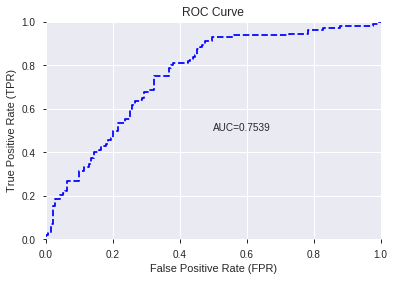

This function is available for GLM models only


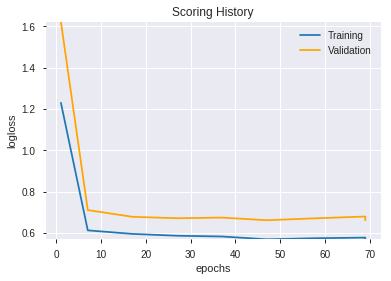

--2019-08-27 20:17:14--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.105.219
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.105.219|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


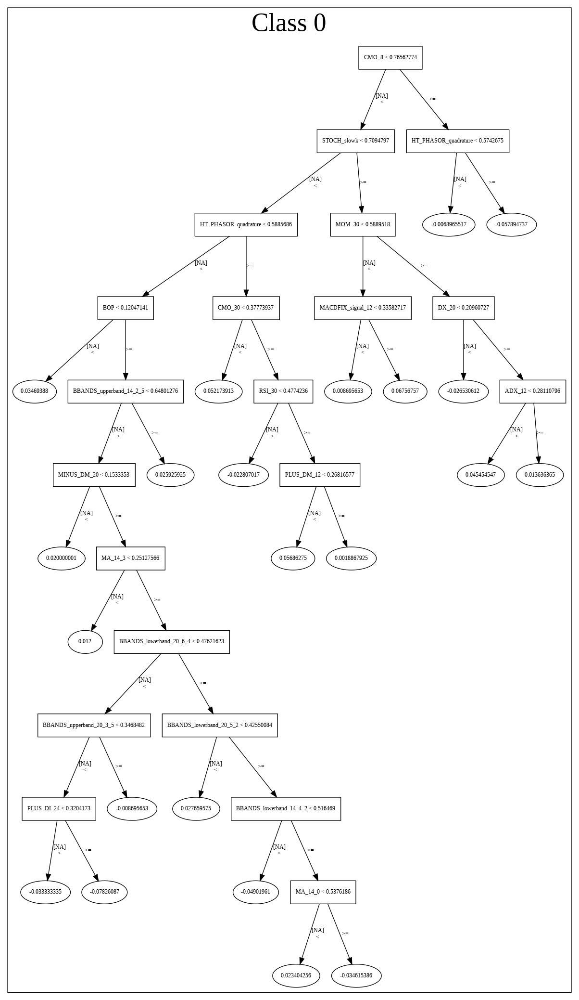

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_200821_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_200821_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLSHORTLINE',
 'CDLCLOSINGMARUBOZU',
 'DIV',
 'CDLLONGLINE',
 'CDLBELTHOLD',
 'CDLMARUBOZU',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'WILLR_8',
 'CDLENGULFING',
 'CCI_8',
 'ULTOSC',
 'CCI_14',
 'CCI_12',
 'ADOSC',
 'WILLR_12',
 'MINUS_DI_8',
 'RSI_20',
 'WILLR_30',
 'STOCHRSI_fastd',
 'STOCH_slowk',
 'CMO_24',
 'ROC_8',
 'CMO_12',
 'RSI_24',
 'ROCR_8',
 'RSI_12',
 'RSI_14',
 'WILLR_24',
 'CMO_20',
 'MOM_8',
 'ROCR100_8',
 'ROCP_8',
 'CMO_14',
 'WILLR_14',
 'CDLEVENINGSTAR',
 'WILLR_20',
 'RSI_8',
 'CMO_8',
 'STOCHF_fastd']

In [48]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_201722_model_1,0.749229,0.615535,0.29718,0.459463,0.211107


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.457236,1.000000,0.172855
1,DIV,0.223121,0.487976,0.084349
2,CDLCLOSINGMARUBOZU,0.199570,0.436471,0.075446
3,STOCHF_fastk,0.176362,0.385712,0.066672
4,WILLR_8,0.150824,0.329860,0.057018
5,CDLEVENINGSTAR,0.120763,0.264115,0.045654
6,STOCHRSI_fastk,0.105574,0.230895,0.039911
7,CDLENGULFING,0.089390,0.195501,0.033793
8,ULTOSC,0.088096,0.192671,0.033304
9,CDLLONGLINE,0.086998,0.190268,0.032889


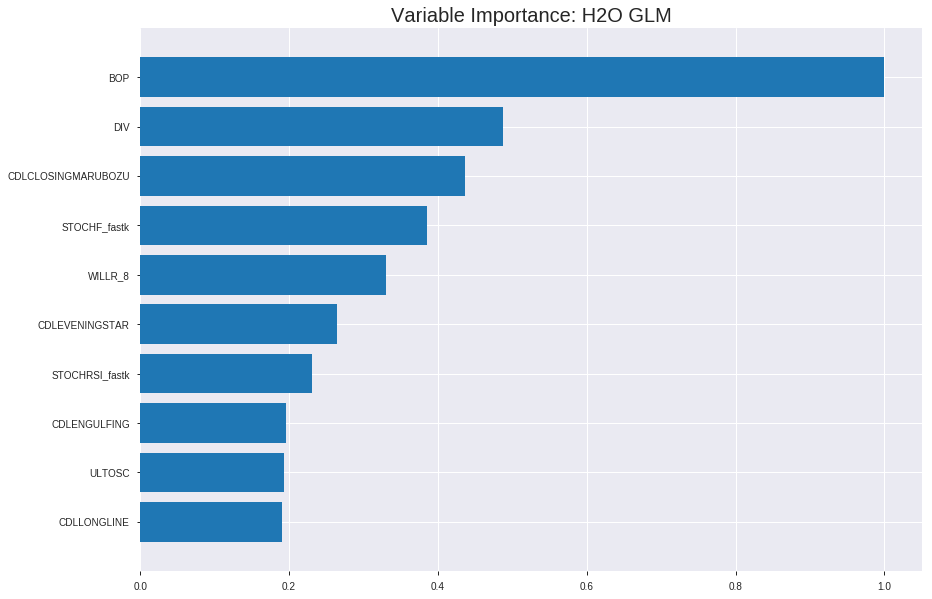

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_201722_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19277638114597703
RMSE: 0.4390630719452241
LogLoss: 0.568757516124315
Null degrees of freedom: 1752
Residual degrees of freedom: 1711
Null deviance: 2420.0736102674464
Residual deviance: 1994.0638515318485
AIC: 2078.0638515318487
AUC: 0.7745519290941701
pr_auc: 0.7718236264244681
Gini: 0.5491038581883403
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3959999684052385: 


,0,1,Error,Rate
0,368.0,442.0,0.5457,(442.0/810.0)
1,85.0,858.0,0.0901,(85.0/943.0)
Total,453.0,1300.0,0.3006,(527.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3960000,0.7650468,267.0
max f2,0.2119530,0.8671484,348.0
max f0point5,0.5242179,0.7376207,201.0
max accuracy,0.5242179,0.7216201,201.0
max precision,0.9270685,1.0,0.0
max recall,0.1631406,1.0,367.0
max specificity,0.9270685,1.0,0.0
max absolute_mcc,0.5242179,0.4385779,201.0
max min_per_class_accuracy,0.5448832,0.7111111,188.0
max mean_per_class_accuracy,0.5242179,0.7183542,201.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8982329,1.7556852,1.7556852,0.9444444,0.9097992,0.9444444,0.9097992,0.0180276,0.0180276,75.5685166,75.5685166
,2,0.0205362,0.8884797,1.6524096,1.7040474,0.8888889,0.8928122,0.9166667,0.9013057,0.0169671,0.0349947,65.2409568,70.4047367
,3,0.0302339,0.8784629,1.5309089,1.6485124,0.8235294,0.8833349,0.8867925,0.8955415,0.0148462,0.0498409,53.0908864,64.8512375
,4,0.0405020,0.8610662,1.6524096,1.6495004,0.8888889,0.8700651,0.8873239,0.8890827,0.0169671,0.0668081,65.2409568,64.9500396
,5,0.0501997,0.8467607,1.5309089,1.6265907,0.8235294,0.8539063,0.875,0.8822872,0.0148462,0.0816543,53.0908864,62.6590668
,6,0.1003993,0.7969068,1.5843416,1.6054661,0.8522727,0.8204365,0.8636364,0.8513619,0.0795334,0.1611877,58.4341560,60.5466114
,7,0.1500285,0.7582847,1.3888787,1.5338193,0.7471264,0.7770107,0.8250951,0.8267666,0.0689290,0.2301166,38.8878731,53.3819337
,8,0.2002282,0.7235474,1.5209679,1.5305973,0.8181818,0.7419345,0.8233618,0.8054982,0.0763521,0.3064687,52.0967897,53.0597324
,9,0.3000570,0.6644822,1.3384517,1.4666706,0.72,0.6932913,0.7889734,0.7681670,0.1336161,0.4400848,33.8451750,46.6670564
,10,0.3998859,0.6158296,1.3596970,1.4399653,0.7314286,0.6400043,0.7746077,0.7361720,0.1357370,0.5758218,35.9697016,43.9965328




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.21225064441075425
RMSE: 0.4607066793641636
LogLoss: 0.6121797115871207
Null degrees of freedom: 500
Residual degrees of freedom: 459
Null deviance: 693.6248861366328
Residual deviance: 613.404071010295
AIC: 697.404071010295
AUC: 0.7251653513116273
pr_auc: 0.7209401051551205
Gini: 0.4503307026232546
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4749866024497054: 


,0,1,Error,Rate
0,113.0,125.0,0.5252,(125.0/238.0)
1,38.0,225.0,0.1445,(38.0/263.0)
Total,151.0,350.0,0.3253,(163.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4749866,0.7340946,271.0
max f2,0.2942504,0.8594270,352.0
max f0point5,0.5530633,0.6807187,226.0
max accuracy,0.5065540,0.6746507,249.0
max precision,0.9251115,1.0,0.0
max recall,0.1676723,1.0,385.0
max specificity,0.9251115,1.0,0.0
max absolute_mcc,0.4749866,0.3594650,271.0
max min_per_class_accuracy,0.6063182,0.6539924,193.0
max mean_per_class_accuracy,0.5065540,0.6677477,249.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 58.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.9118912,1.5874525,1.5874525,0.8333333,0.9193945,0.8333333,0.9193945,0.0190114,0.0190114,58.7452471,58.7452471
,2,0.0219561,0.9012126,1.9049430,1.7317663,1.0,0.9063653,0.9090909,0.9134721,0.0190114,0.0380228,90.4942966,73.1766333
,3,0.0319361,0.8965296,1.9049430,1.7858840,1.0,0.8988092,0.9375,0.9088900,0.0190114,0.0570342,90.4942966,78.5884030
,4,0.0419162,0.8937372,1.9049430,1.8142314,1.0,0.8950253,0.9523810,0.9055888,0.0190114,0.0760456,90.4942966,81.4231396
,5,0.0518962,0.8894100,1.1429658,1.6851419,0.6,0.8908676,0.8846154,0.9027578,0.0114068,0.0874525,14.2965779,68.5141854
,6,0.1017964,0.8334126,1.4477567,1.5687766,0.76,0.8604835,0.8235294,0.8820351,0.0722433,0.1596958,44.7756654,56.8776560
,7,0.1516966,0.7988057,1.3715589,1.5039023,0.72,0.8146678,0.7894737,0.8598748,0.0684411,0.2281369,37.1558935,50.3902341
,8,0.2015968,0.7661749,1.3715589,1.4711441,0.72,0.7788477,0.7722772,0.8398186,0.0684411,0.2965779,37.1558935,47.1144073
,9,0.3013972,0.7061720,1.3715589,1.4381689,0.72,0.7363266,0.7549669,0.8055497,0.1368821,0.4334601,37.1558935,43.8168862
,10,0.4011976,0.6519007,1.0286692,1.3363033,0.54,0.6792418,0.7014925,0.7741298,0.1026616,0.5361217,2.8669202,33.6303275



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 20:17:22,0.000 sec,2,.22E2,42,1.3579823,1.3684580
,2019-08-27 20:17:22,0.012 sec,4,.14E2,42,1.3480386,1.3611532
,2019-08-27 20:17:22,0.023 sec,6,.86E1,42,1.3352570,1.3514869
,2019-08-27 20:17:22,0.033 sec,8,.53E1,42,1.3194056,1.3390965
,2019-08-27 20:17:22,0.043 sec,10,.33E1,42,1.3002932,1.3237001
,2019-08-27 20:17:22,0.055 sec,12,.21E1,42,1.2779705,1.3054742
,2019-08-27 20:17:22,0.065 sec,14,.13E1,42,1.2532670,1.2855823
,2019-08-27 20:17:22,0.075 sec,16,.79E0,42,1.2277242,1.2659981
,2019-08-27 20:17:22,0.086 sec,18,.49E0,42,1.2033374,1.2490185
,2019-08-27 20:17:22,0.096 sec,20,.31E0,42,1.1816534,1.2362407


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.701195219123506)

('F1', 0.7106227106227107)

('auc', 0.7492291880781089)

('logloss', 0.6155346874232643)

('mean_per_class_error', 0.2924588900308325)

('rmse', 0.45946337353588507)

('mse', 0.21110659162097622)

glm prediction progress: |████████████████████████████████████████████████| 100%


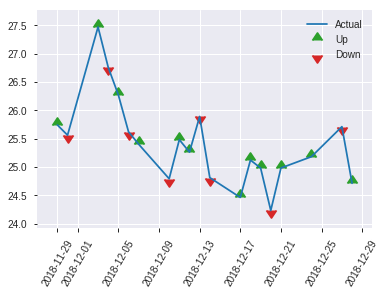


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.21110659162097622
RMSE: 0.45946337353588507
LogLoss: 0.6155346874232643
Null degrees of freedom: 250
Residual degrees of freedom: 209
Null deviance: 353.51374206928267
Residual deviance: 308.9984130864787
AIC: 392.9984130864787
AUC: 0.7492291880781089
pr_auc: 0.6586985085110272
Gini: 0.4984583761562178
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47313398045664684: 


,0,1,Error,Rate
0,75.0,64.0,0.4604,(64.0/139.0)
1,15.0,97.0,0.1339,(15.0/112.0)
Total,90.0,161.0,0.3147,(79.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4731340,0.7106227,160.0
max f2,0.3472111,0.8230769,201.0
max f0point5,0.5642682,0.6632653,118.0
max accuracy,0.5642682,0.7011952,118.0
max precision,0.9179255,1.0,0.0
max recall,0.0543036,1.0,250.0
max specificity,0.9179255,1.0,0.0
max absolute_mcc,0.4731340,0.4204581,160.0
max min_per_class_accuracy,0.5642682,0.6964286,118.0
max mean_per_class_accuracy,0.5128537,0.7075411,143.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 53.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.9110344,1.4940476,1.4940476,0.6666667,0.9153563,0.6666667,0.9153563,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.9009933,2.2410714,1.8675595,1.0,0.9058249,0.8333333,0.9105906,0.0267857,0.0446429,124.1071429,86.7559524
,3,0.0318725,0.8884219,2.2410714,1.9609375,1.0,0.8895597,0.875,0.9053329,0.0178571,0.0625,124.1071429,96.09375
,4,0.0438247,0.8621863,0.7470238,1.6298701,0.3333333,0.8765843,0.7272727,0.8974923,0.0089286,0.0714286,-25.2976190,62.9870130
,5,0.0517928,0.8437533,2.2410714,1.7239011,1.0,0.8560176,0.7692308,0.8911116,0.0178571,0.0892857,124.1071429,72.3901099
,6,0.1035857,0.7817617,1.5515110,1.6377060,0.6923077,0.8107243,0.7307692,0.8509180,0.0803571,0.1696429,55.1510989,63.7706044
,7,0.1513944,0.7432803,1.6808036,1.6513158,0.75,0.7607542,0.7368421,0.8224452,0.0803571,0.25,68.0803571,65.1315789
,8,0.2031873,0.7242778,1.2067308,1.5379902,0.5384615,0.7345537,0.6862745,0.8000415,0.0625,0.3125,20.6730769,53.7990196
,9,0.3027888,0.6746968,1.3446429,1.4743891,0.6,0.6959490,0.6578947,0.7658005,0.1339286,0.4464286,34.4642857,47.4389098
,10,0.4023904,0.6143546,1.3446429,1.4422737,0.6,0.6466707,0.6435644,0.7363129,0.1339286,0.5803571,34.4642857,44.2273692


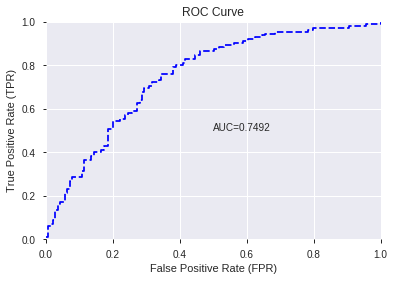

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


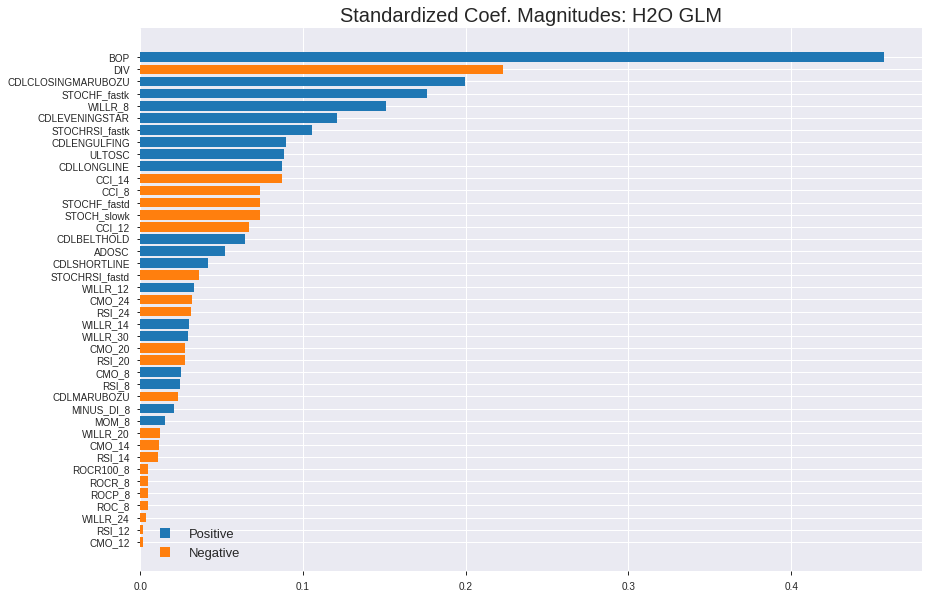

'log_likelihood'
--2019-08-27 20:17:27--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.129.243
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.129.243|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


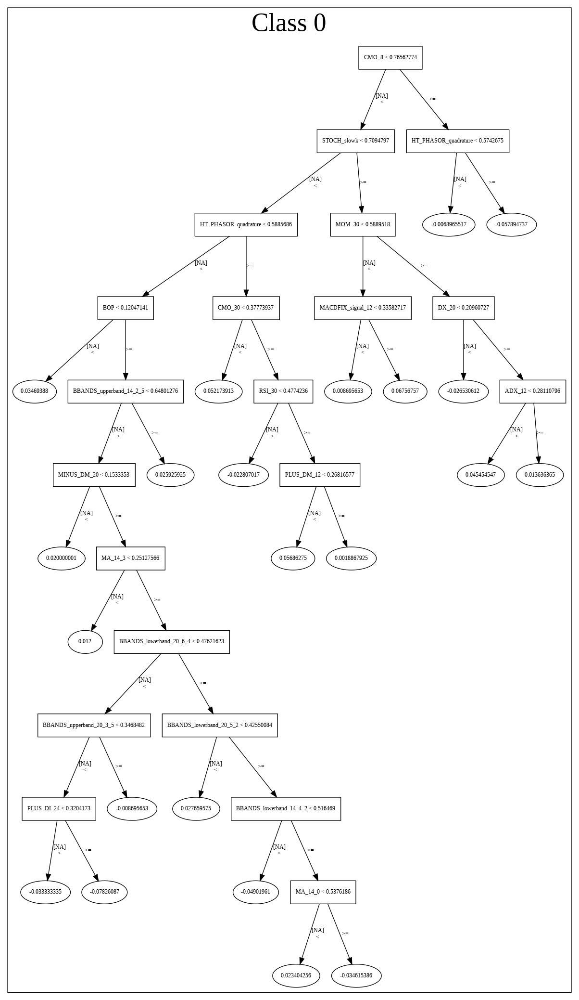

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_201722_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_201722_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['BOP',
 'DIV',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastk',
 'WILLR_8',
 'CDLEVENINGSTAR',
 'STOCHRSI_fastk',
 'CDLENGULFING',
 'ULTOSC',
 'CDLLONGLINE',
 'CCI_14',
 'CCI_8',
 'STOCHF_fastd',
 'STOCH_slowk',
 'CCI_12',
 'CDLBELTHOLD',
 'ADOSC',
 'CDLSHORTLINE',
 'STOCHRSI_fastd',
 'WILLR_12',
 'CMO_24',
 'RSI_24',
 'WILLR_14',
 'WILLR_30',
 'CMO_20',
 'RSI_20',
 'CMO_8',
 'RSI_8',
 'CDLMARUBOZU',
 'MINUS_DI_8',
 'MOM_8',
 'WILLR_20',
 'CMO_14',
 'RSI_14',
 'ROCR100_8',
 'ROCR_8',
 'ROCP_8',
 'ROC_8',
 'WILLR_24',
 'RSI_12',
 'CMO_12']

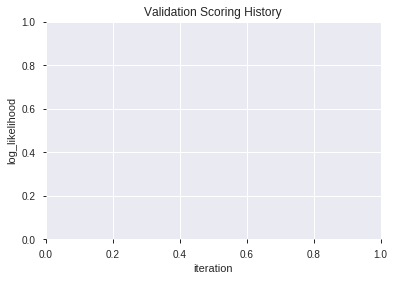

In [49]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190827_201733_model_4,0.765930,0.591028,0.276465,0.449622,0.202160
1,XGBoost_grid_1_AutoML_20190827_201733_model_3,0.758286,0.601573,0.284526,0.453685,0.205830
2,XGBoost_2_AutoML_20190827_201733,0.756038,0.605476,0.294450,0.456090,0.208018
3,XGBoost_grid_1_AutoML_20190827_201733_model_7,0.755010,0.598423,0.278199,0.452900,0.205119
4,XGBoost_3_AutoML_20190827_201733,0.751285,0.601711,0.310701,0.454878,0.206914
5,XGBoost_grid_1_AutoML_20190827_201733_model_6,0.749936,0.606747,0.309834,0.457409,0.209223
6,XGBoost_grid_1_AutoML_20190827_201733_model_2,0.747688,0.604249,0.289119,0.456014,0.207949
7,XGBoost_grid_1_AutoML_20190827_201733_model_1,0.747495,0.604515,0.296313,0.456311,0.208219
8,XGBoost_1_AutoML_20190827_201733,0.741393,0.610550,0.315166,0.459188,0.210853
9,XGBoost_grid_1_AutoML_20190827_201733_model_5,0.731693,0.623930,0.347540,0.465079,0.216299


,variable,relative_importance,scaled_importance,percentage
0,BOP,2656.112793,1.000000,0.550383
1,DIV,399.673798,0.150473,0.082818
2,STOCHF_fastk,311.686188,0.117347,0.064586
3,CCI_8,232.053452,0.087366,0.048085
4,WILLR_8,120.922577,0.045526,0.025057
5,MOM_8,92.900887,0.034976,0.019250
6,ULTOSC,88.714073,0.033400,0.018383
7,WILLR_20,83.183189,0.031318,0.017237
8,ROC_8,76.013054,0.028618,0.015751
9,WILLR_24,75.869690,0.028564,0.015721


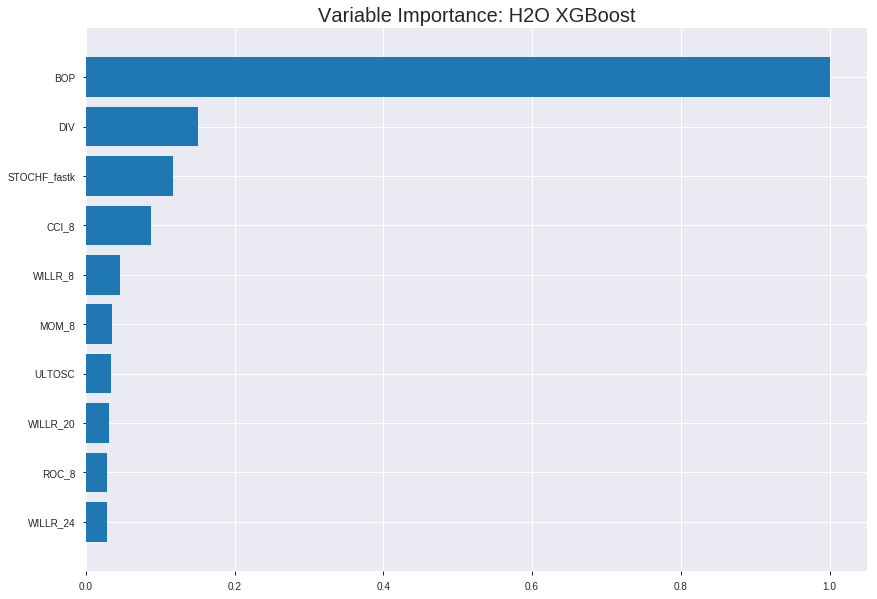

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190827_201733_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17792385404193622
RMSE: 0.4218102109265922
LogLoss: 0.5356110599342019
Mean Per-Class Error: 0.2560209732532108
AUC: 0.8166935050993022
pr_auc: 0.8262171143965868
Gini: 0.6333870101986043
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42914023995399475: 


,0,1,Error,Rate
0,463.0,347.0,0.4284,(347.0/810.0)
1,115.0,828.0,0.122,(115.0/943.0)
Total,578.0,1175.0,0.2635,(462.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4291402,0.7818697,250.0
max f2,0.2156321,0.8715511,352.0
max f0point5,0.6085964,0.7676919,152.0
max accuracy,0.4985573,0.7490017,212.0
max precision,0.8727529,1.0,0.0
max recall,0.1516027,1.0,382.0
max specificity,0.8727529,1.0,0.0
max absolute_mcc,0.4985573,0.4936887,212.0
max min_per_class_accuracy,0.5555736,0.7348887,182.0
max mean_per_class_accuracy,0.4985573,0.7439790,212.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.23 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8592265,1.8589608,1.8589608,1.0,0.8664030,1.0,0.8664030,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8509624,1.8589608,1.8589608,1.0,0.8551587,1.0,0.8607809,0.0190880,0.0381760,85.8960764,85.8960764
,3,0.0302339,0.8425761,1.8589608,1.8589608,1.0,0.8482856,1.0,0.8567729,0.0180276,0.0562036,85.8960764,85.8960764
,4,0.0405020,0.8327424,1.5491340,1.7804131,0.8333333,0.8368784,0.9577465,0.8517293,0.0159067,0.0721103,54.9133970,78.0413126
,5,0.0501997,0.8226861,1.7496101,1.7744625,0.9411765,0.8283693,0.9545455,0.8472165,0.0169671,0.0890774,74.9610130,77.4462547
,6,0.1003993,0.7878932,1.6688398,1.7216512,0.8977273,0.8048986,0.9261364,0.8260576,0.0837752,0.1728526,66.8839776,72.1651162
,7,0.1500285,0.7605410,1.5811850,1.6751852,0.8505747,0.7728050,0.9011407,0.8084417,0.0784730,0.2513256,58.1185017,67.5185175
,8,0.2002282,0.7336570,1.5209679,1.6365210,0.8181818,0.7491260,0.8803419,0.7935705,0.0763521,0.3276776,52.0967897,63.6521014
,9,0.3000570,0.6829740,1.5084139,1.5938998,0.8114286,0.7074193,0.8574144,0.7649080,0.1505832,0.4782609,50.8413877,59.3899818
,10,0.3998859,0.6308426,1.3065839,1.5221733,0.7028571,0.6615540,0.8188302,0.7391064,0.1304348,0.6086957,30.6583851,52.2173293




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.21118588281243533
RMSE: 0.4595496521731197
LogLoss: 0.6120871606707651
Mean Per-Class Error: 0.3301594402019363
AUC: 0.724885771799214
pr_auc: 0.6832804884935768
Gini: 0.44977154359842797
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39118415117263794: 


,0,1,Error,Rate
0,93.0,145.0,0.6092,(145.0/238.0)
1,24.0,239.0,0.0913,(24.0/263.0)
Total,117.0,384.0,0.3373,(169.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3911842,0.7387944,305.0
max f2,0.2810292,0.8675497,362.0
max f0point5,0.5505849,0.6845878,224.0
max accuracy,0.5505849,0.6726547,224.0
max precision,0.8853121,1.0,0.0
max recall,0.2686681,1.0,367.0
max specificity,0.8853121,1.0,0.0
max absolute_mcc,0.3911842,0.3535142,305.0
max min_per_class_accuracy,0.5937741,0.6512605,201.0
max mean_per_class_accuracy,0.5505849,0.6698406,224.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 56.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8639616,1.2699620,1.2699620,0.6666667,0.8722506,0.6666667,0.8722506,0.0152091,0.0152091,26.9961977,26.9961977
,2,0.0219561,0.8548813,0.7619772,1.0390598,0.4,0.8585724,0.5454545,0.8660333,0.0076046,0.0228137,-23.8022814,3.9059800
,3,0.0319361,0.8495619,1.5239544,1.1905894,0.8,0.8518321,0.625,0.8615954,0.0152091,0.0380228,52.3954373,19.0589354
,4,0.0419162,0.8314163,1.1429658,1.1792504,0.6,0.8397070,0.6190476,0.8563839,0.0114068,0.0494297,14.2965779,17.9250407
,5,0.0518962,0.8185689,0.7619772,1.0990056,0.4,0.8232275,0.5769231,0.8500076,0.0076046,0.0570342,-23.8022814,9.9005557
,6,0.1017964,0.7939980,1.4477567,1.2699620,0.76,0.8032158,0.6666667,0.8270705,0.0722433,0.1292776,44.7756654,26.9961977
,7,0.1516966,0.7618297,1.7525475,1.4287072,0.92,0.7764616,0.75,0.8104228,0.0874525,0.2167300,75.2547529,42.8707224
,8,0.2015968,0.7400113,1.6001521,1.4711441,0.84,0.7504775,0.7722772,0.7955849,0.0798479,0.2965779,60.0152091,47.1144073
,9,0.3013972,0.6915793,1.3334601,1.4255533,0.7,0.7131616,0.7483444,0.7682924,0.1330798,0.4296578,33.3460076,42.5553345
,10,0.4011976,0.6474417,1.2191635,1.3742126,0.64,0.6710118,0.7213930,0.7440932,0.1216730,0.5513308,21.9163498,37.4212587



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 20:17:41,2.867 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4620650,0.5,0.6931472,0.5,0.0,1.0,0.4750499
,2019-08-27 20:17:41,2.961 sec,5.0,0.4756327,0.6453011,0.7938586,0.8051444,1.6929821,0.2903594,0.4820690,0.6577057,0.7181918,0.6062403,1.4403227,0.3453094
,2019-08-27 20:17:41,3.014 sec,10.0,0.4596979,0.6143247,0.7961385,0.7754750,1.8589608,0.2783799,0.4721919,0.6381404,0.7230965,0.6885933,0.6349810,0.3433134
,2019-08-27 20:17:41,3.078 sec,15.0,0.4483597,0.5918561,0.7979819,0.7834722,1.8589608,0.2766686,0.4656509,0.6247588,0.7228009,0.6899723,0.6349810,0.3433134
,2019-08-27 20:17:41,3.133 sec,20.0,0.4409991,0.5769564,0.8017615,0.7972086,1.8589608,0.2715345,0.4625282,0.6180328,0.7236556,0.6891659,0.6349810,0.3393214
,2019-08-27 20:17:41,3.191 sec,25.0,0.4358216,0.5660844,0.8041802,0.8154452,1.8589608,0.2675414,0.4605512,0.6137120,0.7249417,0.6888289,0.8164041,0.3393214
,2019-08-27 20:17:41,3.254 sec,30.0,0.4315911,0.5570174,0.8067116,0.8092665,1.8589608,0.2669709,0.4626536,0.6184974,0.7246062,0.6949753,1.2699620,0.3393214
,2019-08-27 20:17:41,3.319 sec,35.0,0.4337869,0.5620853,0.8067554,0.8085256,1.7556852,0.2664005,0.4596961,0.6119446,0.7263156,0.6882663,0.6349810,0.3393214
,2019-08-27 20:17:41,3.399 sec,40.0,0.4294301,0.5526599,0.8092475,0.8106458,1.8589608,0.2766686,0.4610899,0.6140995,0.7218423,0.7071415,1.2699620,0.3453094
,2019-08-27 20:17:41,3.467 sec,45.0,0.4270884,0.5472723,0.8115628,0.8233985,1.8589608,0.2549914,0.4601550,0.6133359,0.7250855,0.6867349,1.2699620,0.3313373


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,2656.1127930,1.0,0.5503834
DIV,399.6737976,0.1504732,0.0828180
STOCHF_fastk,311.6861877,0.1173467,0.0645857
CCI_8,232.0534515,0.0873658,0.0480847
WILLR_8,120.9225769,0.0455261,0.0250568
---,---,---,---
CMO_12,27.6145496,0.0103966,0.0057221
CCI_14,22.2799454,0.0083882,0.0046167
CMO_14,7.4127359,0.0027908,0.0015360
CDLBELTHOLD,6.7133255,0.0025275,0.0013911



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7091633466135459)

('F1', 0.7245283018867924)

('auc', 0.7659301130524152)

('logloss', 0.5910278577966489)

('mean_per_class_error', 0.27646454265159304)

('rmse', 0.4496219218979673)

('mse', 0.2021598726512218)

xgboost prediction progress: |████████████████████████████████████████████| 100%


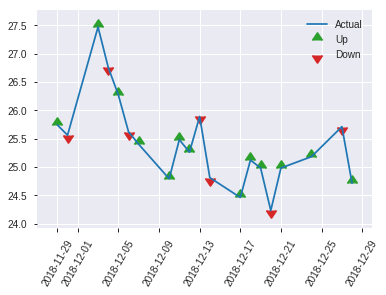


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2021598726512218
RMSE: 0.4496219218979673
LogLoss: 0.5910278577966489
Mean Per-Class Error: 0.27646454265159304
AUC: 0.7659301130524152
pr_auc: 0.6934533234308621
Gini: 0.5318602261048304
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.48744508624076843: 


,0,1,Error,Rate
0,82.0,57.0,0.4101,(57.0/139.0)
1,16.0,96.0,0.1429,(16.0/112.0)
Total,98.0,153.0,0.2908,(73.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4874451,0.7245283,152.0
max f2,0.3702328,0.8280757,185.0
max f0point5,0.5676814,0.6666667,121.0
max accuracy,0.4899245,0.7091633,150.0
max precision,0.7896063,0.8888889,17.0
max recall,0.1713546,1.0,241.0
max specificity,0.8784683,0.9928058,0.0
max absolute_mcc,0.4874451,0.4555479,152.0
max min_per_class_accuracy,0.5687976,0.6978417,120.0
max mean_per_class_accuracy,0.4874451,0.7235355,152.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 52.95 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.8656439,1.4940476,1.4940476,0.6666667,0.8746534,0.6666667,0.8746534,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.8559163,2.2410714,1.8675595,1.0,0.8580966,0.8333333,0.8663750,0.0267857,0.0446429,124.1071429,86.7559524
,3,0.0318725,0.8413534,2.2410714,1.9609375,1.0,0.8466411,0.875,0.8614415,0.0178571,0.0625,124.1071429,96.09375
,4,0.0438247,0.8230667,1.4940476,1.8336039,0.6666667,0.8286255,0.8181818,0.8524917,0.0178571,0.0803571,49.4047619,83.3603896
,5,0.0517928,0.8128898,2.2410714,1.8962912,1.0,0.8190677,0.8461538,0.8473495,0.0178571,0.0982143,124.1071429,89.6291209
,6,0.1035857,0.7621177,1.7239011,1.8100962,0.7692308,0.7846094,0.8076923,0.8159794,0.0892857,0.1875,72.3901099,81.0096154
,7,0.1513944,0.7417869,1.8675595,1.8282425,0.8333333,0.7519393,0.8157895,0.7957562,0.0892857,0.2767857,86.7559524,82.8242481
,8,0.2031873,0.7226437,1.2067308,1.6698179,0.5384615,0.7284189,0.7450980,0.7785918,0.0625,0.3392857,20.6730769,66.9817927
,9,0.3027888,0.6954251,1.2550000,1.5333647,0.56,0.7092405,0.6842105,0.7557789,0.125,0.4642857,25.5000000,53.3364662
,10,0.4023904,0.6378822,1.4342857,1.5088402,0.64,0.6643641,0.6732673,0.7331514,0.1428571,0.6071429,43.4285714,50.8840170


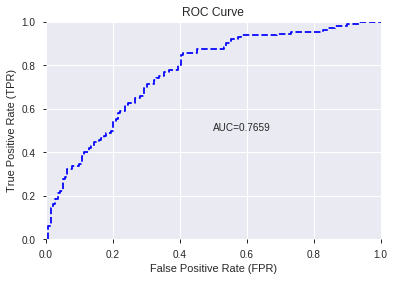

This function is available for GLM models only


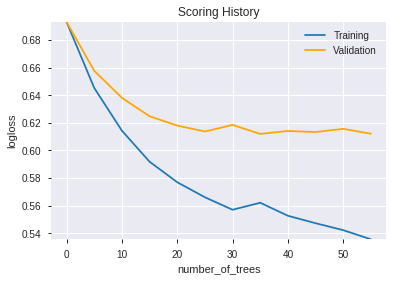

--2019-08-27 20:17:53--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.177.251
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.177.251|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at he

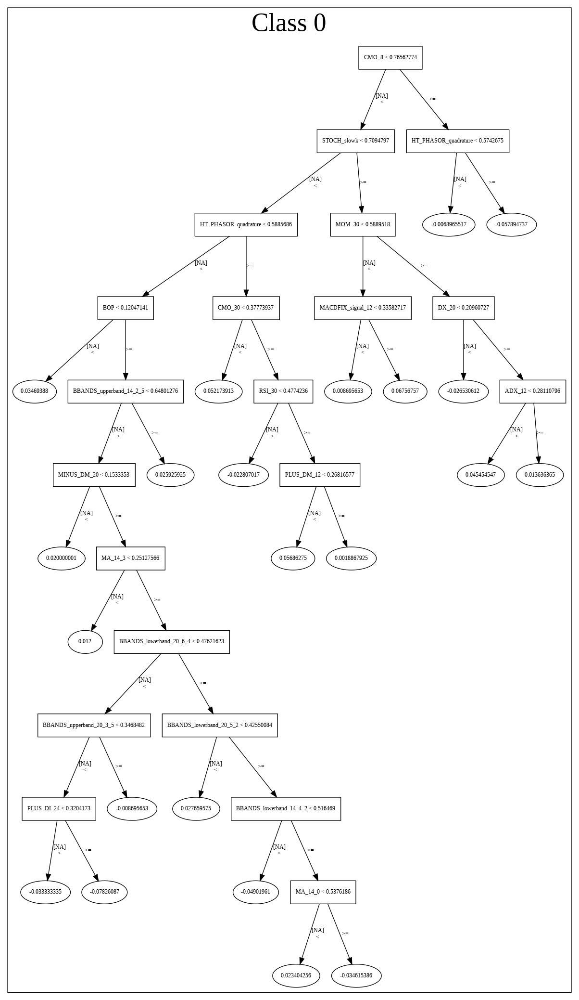

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190827_201733_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190827_201733_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'DIV',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'MOM_8',
 'ULTOSC',
 'WILLR_20',
 'ROC_8',
 'WILLR_24',
 'ADOSC',
 'WILLR_12',
 'STOCHRSI_fastk',
 'CMO_20',
 'WILLR_14',
 'CMO_24',
 'STOCHRSI_fastd',
 'MINUS_DI_8',
 'STOCH_slowk',
 'CCI_12',
 'WILLR_30',
 'CMO_8',
 'CMO_12',
 'CCI_14',
 'CMO_14',
 'CDLBELTHOLD',
 'CDLLONGLINE']

In [50]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [51]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

163

['EMA_20',
 'MIDPRICE_20',
 'SAR_0.2',
 'SMA_20',
 'WMA_20',
 'MA_20_0',
 'BBANDS_middleband_20_0_2',
 'BBANDS_upperband_20_0_3',
 'BBANDS_upperband_20_0_4',
 'MAVP_20_1',
 'BBANDS_lowerband_20_1_4',
 'BBANDS_upperband_20_1_5',
 'BBANDS_middleband_20_2_2',
 'BBANDS_middleband_20_3_3',
 'BBANDS_lowerband_20_5_3',
 'MAVP_20_6',
 'BBANDS_upperband_20_6_4',
 'BBANDS_lowerband_20_6_4',
 'BBANDS_lowerband_20_6_5',
 'BBANDS_middleband_24_1_4',
 'BBANDS_upperband_24_3_2',
 'BBANDS_lowerband_24_3_5',
 'BBANDS_middleband_24_5_5',
 'BBANDS_lowerband_24_6_3',
 'BBANDS_lowerband_24_7_2',
 'BBANDS_lowerband_24_7_4',
 'MIDPOINT_30',
 'TRIMA_30',
 'BBANDS_upperband_30_0_5',
 'BBANDS_lowerband_30_0_5',
 'BBANDS_upperband_30_1_3',
 'BBANDS_lowerband_30_1_3',
 'BBANDS_middleband_30_1_4',
 'BBANDS_lowerband_30_1_5',
 'BBANDS_lowerband_30_2_2',
 'BBANDS_lowerband_30_2_4',
 'BBANDS_middleband_30_5_2',
 'BBANDS_lowerband_30_5_3',
 'BBANDS_middleband_30_5_5',
 'BBANDS_upperband_30_7_4',
 'BOP',
 'ADX_8',
 'ar

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190827_201908_model_9,0.749936,0.623118,0.316900,0.465841,0.217008
1,DeepLearning_grid_1_AutoML_20190827_201908_model_2,0.746403,0.824020,0.298047,0.484998,0.235223
2,DeepLearning_grid_1_AutoML_20190827_201908_model_5,0.739851,0.598759,0.306366,0.456955,0.208808
3,DeepLearning_grid_1_AutoML_20190827_201908_model_6,0.738887,0.653962,0.343332,0.481569,0.231909
4,DeepLearning_grid_1_AutoML_20190827_201908_model_3,0.722829,0.821154,0.347540,0.501807,0.251810
5,DeepLearning_grid_1_AutoML_20190827_201908_model_8,0.693410,0.677280,0.354863,0.492981,0.243030
6,DeepLearning_grid_1_AutoML_20190827_201908_model_7,0.689170,0.813270,0.408081,0.543198,0.295064
7,DeepLearning_grid_1_AutoML_20190827_201908_model_4,0.683582,0.847471,0.383511,0.513915,0.264108
8,DeepLearning_grid_1_AutoML_20190827_201908_model_1,0.678314,2.935919,0.385502,0.650594,0.423273
9,DeepLearning_1_AutoML_20190827_201908,0.651914,0.780876,0.364658,0.514547,0.264758


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.022378
1,CDLCLOSINGMARUBOZU,0.871027,0.871027,0.019492
2,CDLLONGLINE,0.654874,0.654874,0.014655
3,CDLBELTHOLD,0.546305,0.546305,0.012225
4,CDLENGULFING,0.488234,0.488234,0.010926
5,CDLSHORTLINE,0.424766,0.424766,0.009506
6,STOCHF_fastk,0.389068,0.389068,0.008707
7,HT_TRENDMODE,0.380784,0.380784,0.008521
8,CDLLONGLEGGEDDOJI,0.379821,0.379821,0.008500
9,ULTOSC,0.359667,0.359667,0.008049


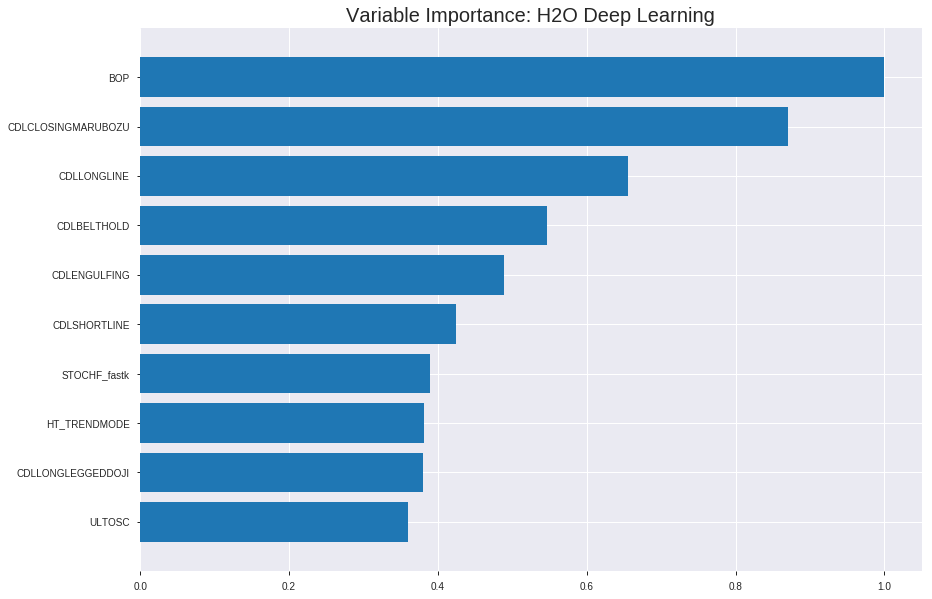

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190827_201908_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1915468650511759
RMSE: 0.43766067341169224
LogLoss: 0.5678777610044433
Mean Per-Class Error: 0.2751247005223676
AUC: 0.785328541691214
pr_auc: 0.7873769615562175
Gini: 0.570657083382428
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4316467841507916: 


,0,1,Error,Rate
0,442.0,368.0,0.4543,(368.0/810.0)
1,118.0,825.0,0.1251,(118.0/943.0)
Total,560.0,1193.0,0.2772,(486.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4316468,0.7724719,251.0
max f2,0.2871959,0.8680030,330.0
max f0point5,0.5379474,0.7453089,195.0
max accuracy,0.5093032,0.7290359,212.0
max precision,0.8880554,1.0,0.0
max recall,0.1786578,1.0,387.0
max specificity,0.8880554,1.0,0.0
max absolute_mcc,0.5051155,0.4530985,215.0
max min_per_class_accuracy,0.5510811,0.7185185,187.0
max mean_per_class_accuracy,0.5358005,0.7248753,197.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 52.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8555112,1.8589608,1.8589608,1.0,0.8691463,1.0,0.8691463,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8410884,1.4458584,1.6524096,0.7777778,0.8492287,0.8888889,0.8591875,0.0148462,0.0339343,44.5858372,65.2409568
,3,0.0302339,0.8264710,1.7496101,1.6835871,0.9411765,0.8349340,0.9056604,0.8514081,0.0169671,0.0509014,74.9610130,68.3587107
,4,0.0405020,0.8160352,1.7556852,1.7018655,0.9444444,0.8203092,0.9154930,0.8435239,0.0180276,0.0689290,75.5685166,70.1865488
,5,0.0501997,0.8070273,1.5309089,1.6688398,0.8235294,0.8121352,0.8977273,0.8374601,0.0148462,0.0837752,53.0908864,66.8839776
,6,0.1003993,0.7598180,1.6265907,1.6477152,0.875,0.7842701,0.8863636,0.8108651,0.0816543,0.1654295,62.6590668,64.7715222
,7,0.1500285,0.7196706,1.6025524,1.6327754,0.8620690,0.7363079,0.8783270,0.7862017,0.0795334,0.2449629,60.2552382,63.2775423
,8,0.2002282,0.6819208,1.3097224,1.5517821,0.7045455,0.6985710,0.8347578,0.7642316,0.0657476,0.3107105,30.9722356,55.1782062
,9,0.3000570,0.6279658,1.3596970,1.4878754,0.7314286,0.6528975,0.8003802,0.7271908,0.1357370,0.4464475,35.9697016,48.7875440
,10,0.3998859,0.5933260,1.2428481,1.4267060,0.6685714,0.6094821,0.7674750,0.6978056,0.1240721,0.5705196,24.2848053,42.6705978




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.21575489941421705
RMSE: 0.4644942404532235
LogLoss: 0.6199464107999015
Mean Per-Class Error: 0.33615841773971944
AUC: 0.7123925615873726
pr_auc: 0.7045192569888981
Gini: 0.42478512317474526
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4324497054333321: 


,0,1,Error,Rate
0,82.0,156.0,0.6555,(156.0/238.0)
1,22.0,241.0,0.0837,(22.0/263.0)
Total,104.0,397.0,0.3553,(178.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4324497,0.7303030,304.0
max f2,0.2102505,0.8556499,378.0
max f0point5,0.6070860,0.6804214,167.0
max accuracy,0.5457962,0.6686627,230.0
max precision,0.7712647,0.86,46.0
max recall,0.1762616,1.0,388.0
max specificity,0.8888116,0.9957983,0.0
max absolute_mcc,0.5457962,0.3347084,230.0
max min_per_class_accuracy,0.5805200,0.6425856,194.0
max mean_per_class_accuracy,0.5457962,0.6638416,230.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 56.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8688148,1.5874525,1.5874525,0.8333333,0.8804726,0.8333333,0.8804726,0.0190114,0.0190114,58.7452471,58.7452471
,2,0.0219561,0.8637910,1.1429658,1.3854131,0.6,0.8657075,0.7272727,0.8737612,0.0114068,0.0304183,14.2965779,38.5413066
,3,0.0319361,0.8532968,1.9049430,1.5477662,1.0,0.8594976,0.8125,0.8693038,0.0190114,0.0494297,90.4942966,54.7766160
,4,0.0419162,0.8507320,1.9049430,1.6328083,1.0,0.8517685,0.8571429,0.8651287,0.0190114,0.0684411,90.4942966,63.2808256
,5,0.0518962,0.8449217,1.5239544,1.6118748,0.8,0.8475475,0.8461538,0.8617477,0.0152091,0.0836502,52.3954373,61.1874817
,6,0.1017964,0.7699962,1.6001521,1.6061284,0.84,0.8054401,0.8431373,0.8341459,0.0798479,0.1634981,60.0152091,60.6128383
,7,0.1516966,0.7218003,1.3715589,1.5289674,0.72,0.7448508,0.8026316,0.8047726,0.0684411,0.2319392,37.1558935,52.8967380
,8,0.2015968,0.6856283,1.1429658,1.4334224,0.6,0.6995632,0.7524752,0.7787306,0.0570342,0.2889734,14.2965779,43.3422430
,9,0.3013972,0.6381522,1.2572624,1.3750913,0.66,0.6582764,0.7218543,0.7388451,0.1254753,0.4144487,25.7262357,37.5091280
,10,0.4011976,0.6170633,1.2572624,1.3457806,0.66,0.6286811,0.7064677,0.7114411,0.1254753,0.5399240,25.7262357,34.5780603



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 20:28:23,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-27 20:28:24,3 min 0.732 sec,485 obs/sec,0.4272675,1,749.0,0.4930985,0.7156422,0.0217846,0.7127430,0.7207381,1.7556852,0.3536794,0.5262273,0.7932310,-0.1104257,0.6791705,0.6785333,1.9049430,0.3572854
,2019-08-27 20:28:36,3 min 12.540 sec,740 obs/sec,5.1762693,12,9074.0,0.4435898,0.5787300,0.2083554,0.7642479,0.7715423,1.8589608,0.2977752,0.4642514,0.6203885,0.1357306,0.7229527,0.7273642,1.9049430,0.3453094
,2019-08-27 20:28:47,3 min 23.646 sec,858 obs/sec,10.8916144,25,19093.0,0.4407764,0.5720021,0.2183655,0.7713955,0.7755444,1.8589608,0.2949230,0.4807861,0.6558601,0.0730706,0.7003706,0.6936057,1.2699620,0.3453094
,2019-08-27 20:28:58,3 min 34.973 sec,942 obs/sec,17.4546492,40,30598.0,0.4411869,0.5733062,0.2169088,0.7771127,0.7817373,1.7556852,0.2960639,0.4663982,0.6244065,0.1277187,0.7208439,0.7205177,1.5874525,0.3393214
,2019-08-27 20:29:10,3 min 46.563 sec,1013 obs/sec,24.8254421,57,43519.0,0.4376607,0.5678778,0.2293766,0.7853285,0.7873770,1.8589608,0.2772390,0.4644942,0.6199464,0.1348261,0.7123926,0.7045193,1.5874525,0.3552894
,2019-08-27 20:29:21,3 min 57.757 sec,1068 obs/sec,32.3474044,74,56705.0,0.4308464,0.5530492,0.2531867,0.7908141,0.7895641,1.6524096,0.2715345,0.4671079,0.6274213,0.1250624,0.7144375,0.7069798,1.5874525,0.3493014
,2019-08-27 20:29:32,4 min 8.976 sec,1114 obs/sec,40.1916714,92,70456.0,0.4300047,0.5510745,0.2561017,0.7938475,0.7967734,1.8589608,0.2926412,0.4668369,0.6242322,0.1260772,0.7041809,0.6965548,1.2699620,0.3353293
,2019-08-27 20:29:34,4 min 10.110 sec,1114 obs/sec,40.1916714,92,70456.0,0.4376607,0.5678778,0.2293766,0.7853285,0.7873770,1.8589608,0.2772390,0.4644942,0.6199464,0.1348261,0.7123926,0.7045193,1.5874525,0.3552894


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0223783
CDLCLOSINGMARUBOZU,0.8710274,0.8710274,0.0194921
CDLLONGLINE,0.6548741,0.6548741,0.0146550
CDLBELTHOLD,0.5463053,0.5463053,0.0122254
CDLENGULFING,0.4882341,0.4882341,0.0109259
---,---,---,---
BBANDS_upperband_24_3_2,0.2215728,0.2215728,0.0049584
TSF_12,0.2210144,0.2210144,0.0049459
BBANDS_lowerband_30_2_4,0.2205439,0.2205439,0.0049354
BBANDS_upperband_20_1_5,0.2202245,0.2202245,0.0049283



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.701195219123506)

('F1', 0.6934306569343066)

('auc', 0.7499357656731758)

('logloss', 0.6231183913100734)

('mean_per_class_error', 0.2967947070914697)

('rmse', 0.4658411203704283)

('mse', 0.21700794942797588)

deeplearning prediction progress: |███████████████████████████████████████| 100%


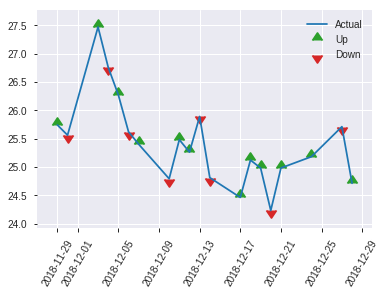


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.21700794942797588
RMSE: 0.4658411203704283
LogLoss: 0.6231183913100734
Mean Per-Class Error: 0.2967947070914697
AUC: 0.7499357656731758
pr_auc: 0.6750593289930532
Gini: 0.49987153134635154
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5115614659260388: 


,0,1,Error,Rate
0,72.0,67.0,0.482,(67.0/139.0)
1,17.0,95.0,0.1518,(17.0/112.0)
Total,89.0,162.0,0.3347,(84.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5115615,0.6934307,161.0
max f2,0.3700182,0.8295626,214.0
max f0point5,0.6301065,0.67,96.0
max accuracy,0.6301065,0.7011952,96.0
max precision,0.8759289,1.0,0.0
max recall,0.2444315,1.0,237.0
max specificity,0.8759289,1.0,0.0
max absolute_mcc,0.5733430,0.4049823,133.0
max min_per_class_accuracy,0.5959863,0.6875,119.0
max mean_per_class_accuracy,0.5733430,0.7032053,133.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 55.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.8625627,2.2410714,2.2410714,1.0,0.8718163,1.0,0.8718163,0.0267857,0.0267857,124.1071429,124.1071429
,2,0.0239044,0.8526999,1.4940476,1.8675595,0.6666667,0.8544603,0.8333333,0.8631383,0.0178571,0.0446429,49.4047619,86.7559524
,3,0.0318725,0.8348765,1.1205357,1.6808036,0.5,0.8384612,0.75,0.8569690,0.0089286,0.0535714,12.0535714,68.0803571
,4,0.0438247,0.8022700,2.2410714,1.8336039,1.0,0.8131017,0.8181818,0.8450052,0.0267857,0.0803571,124.1071429,83.3603896
,5,0.0517928,0.7827605,2.2410714,1.8962912,1.0,0.7908090,0.8461538,0.8366673,0.0178571,0.0982143,124.1071429,89.6291209
,6,0.1035857,0.7311408,1.3791209,1.6377060,0.6153846,0.7566041,0.7307692,0.7966357,0.0714286,0.1696429,37.9120879,63.7706044
,7,0.1513944,0.7025415,1.6808036,1.6513158,0.75,0.7120793,0.7368421,0.7699337,0.0803571,0.25,68.0803571,65.1315789
,8,0.2031873,0.6821944,1.7239011,1.6698179,0.7692308,0.6900256,0.7450980,0.7495650,0.0892857,0.3392857,72.3901099,66.9817927
,9,0.3027888,0.6458182,1.2550000,1.5333647,0.56,0.6641182,0.6842105,0.7214575,0.125,0.4642857,25.5000000,53.3364662
,10,0.4023904,0.6232412,1.4342857,1.5088402,0.64,0.6366764,0.6732673,0.7004721,0.1428571,0.6071429,43.4285714,50.8840170


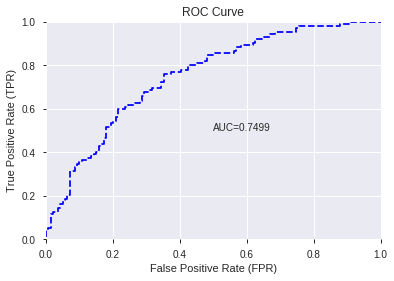

This function is available for GLM models only


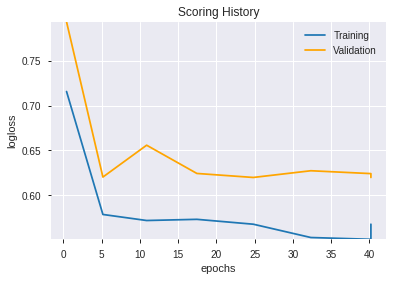

--2019-08-27 20:29:41--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.120.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.120.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


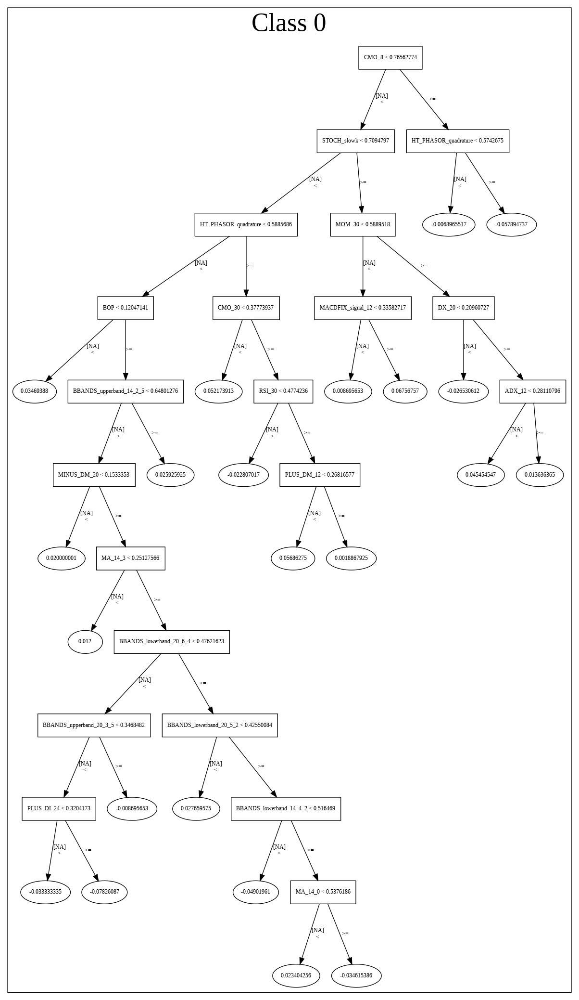

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190827_201908_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190827_201908_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CDLLONGLINE',
 'CDLBELTHOLD',
 'CDLENGULFING',
 'CDLSHORTLINE',
 'STOCHF_fastk',
 'HT_TRENDMODE',
 'CDLLONGLEGGEDDOJI',
 'ULTOSC',
 'WILLR_8',
 'aroonup_8',
 'STOCH_slowd',
 'ADOSC',
 'CORREL_8',
 'aroondown_30',
 'HT_DCPERIOD',
 'NATR_8',
 'BETA_14',
 'MOM_8',
 'NATR_30',
 'CCI_8',
 'BETA_20',
 'AROONOSC_30',
 'aroondown_24',
 'WILLR_30',
 'AROONOSC_20',
 'CDLSPINNINGTOP',
 'CORREL_14',
 'CDLHARAMI',
 'ADXR_14',
 'BETA_12',
 'aroonup_30',
 'CDLDARKCLOUDCOVER',
 'STOCHRSI_fastk',
 'aroondown_14',
 'PLUS_DI_30',
 'STOCH_slowk',
 'VAR_14',
 'BETA_8',
 'MINUS_DM_30',
 'CDLHIGHWAVE',
 'WILLR_14',
 'CCI_14',
 'ADX_24',
 'ROCP_8',
 'PLUS_DI_8',
 'aroonup_20',
 'aroondown_12',
 'AROONOSC_12',
 'CORREL_20',
 'PLUS_DI_14',
 'VAR_8',
 'aroondown_8',
 'aroonup_14',
 'MACDFIX_hist_12',
 'PLUS_DM_8',
 'ADX_8',
 'MACDEXT_hist',
 'DX_14',
 'MACDFIX_signal_20',
 'HT_PHASOR_inphase',
 'CMO_30',
 'ROCR_24',
 'ROCR_8',
 'LINEARREG_ANGLE_8',
 'aroonup_12',
 'AROONOSC_24',


In [52]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190827_202952_model_1,0.756038,0.613891,0.299782,0.460849,0.212382


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.289669,1.000000,0.091721
1,CDLCLOSINGMARUBOZU,0.144865,0.500106,0.045870
2,STOCHF_fastk,0.112126,0.387082,0.035503
3,CDLLONGLINE,0.101715,0.351143,0.032207
4,WILLR_8,0.094344,0.325697,0.029873
5,CDLENGULFING,0.087843,0.303252,0.027814
6,CDLBELTHOLD,0.083878,0.289566,0.026559
7,STOCHRSI_fastk,0.076361,0.263615,0.024179
8,ULTOSC,0.071228,0.245894,0.022554
9,CDLLONGLEGGEDDOJI,0.068995,0.238185,0.021846


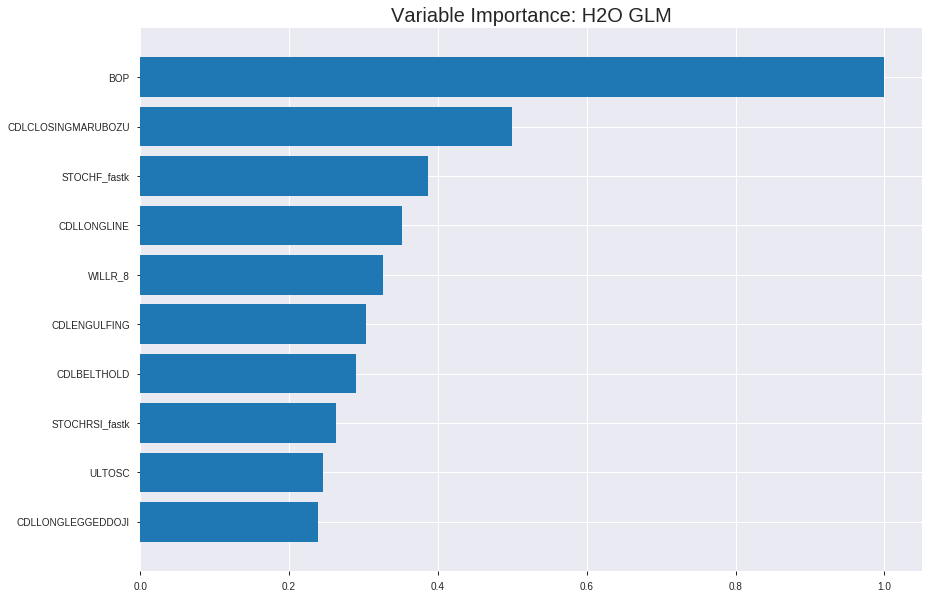

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190827_202952_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19688618916825484
RMSE: 0.443718592317535
LogLoss: 0.579429147233673
Null degrees of freedom: 1752
Residual degrees of freedom: 1589
Null deviance: 2420.0736102674464
Residual deviance: 2031.4785902012577
AIC: 2359.4785902012577
AUC: 0.7688366521346373
pr_auc: 0.7735719307979929
Gini: 0.5376733042692745
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4142517769123481: 


,0,1,Error,Rate
0,385.0,425.0,0.5247,(425.0/810.0)
1,99.0,844.0,0.105,(99.0/943.0)
Total,484.0,1269.0,0.2989,(524.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4142518,0.7631103,268.0
max f2,0.2242097,0.8607386,362.0
max f0point5,0.5591258,0.7319244,184.0
max accuracy,0.5236804,0.7147747,203.0
max precision,0.9172832,1.0,0.0
max recall,0.1824156,1.0,379.0
max specificity,0.9172832,1.0,0.0
max absolute_mcc,0.4595171,0.4259554,241.0
max min_per_class_accuracy,0.5537846,0.7049383,187.0
max mean_per_class_accuracy,0.5236804,0.7115562,203.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.8706981,1.8589608,1.8589608,1.0,0.8825822,1.0,0.8825822,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.8558253,1.7556852,1.8073230,0.9444444,0.8630587,0.9722222,0.8728205,0.0180276,0.0371156,75.5685166,80.7322965
,3,0.0302339,0.8422554,1.4215582,1.6835871,0.7647059,0.8495708,0.9056604,0.8653630,0.0137858,0.0509014,42.1558231,68.3587107
,4,0.0405020,0.8281903,1.7556852,1.7018655,0.9444444,0.8341322,0.9154930,0.8574454,0.0180276,0.0689290,75.5685166,70.1865488
,5,0.0501997,0.8112392,1.6402595,1.6899643,0.8823529,0.8184397,0.9090909,0.8499102,0.0159067,0.0848356,64.0259497,68.9964330
,6,0.1003993,0.7672348,1.5209679,1.6054661,0.8181818,0.7876825,0.8636364,0.8187964,0.0763521,0.1611877,52.0967897,60.5466114
,7,0.1500285,0.7294824,1.4102461,1.5408876,0.7586207,0.7478440,0.8288973,0.7953254,0.0699894,0.2311771,41.0246096,54.0887629
,8,0.2002282,0.6979884,1.4364697,1.5147088,0.7727273,0.7144662,0.8148148,0.7750531,0.0721103,0.3032874,43.6469681,51.4708770
,9,0.3000570,0.6523678,1.3809423,1.4702047,0.7428571,0.6734877,0.7908745,0.7412623,0.1378579,0.4411453,38.0942281,47.0204710
,10,0.3998859,0.6086475,1.2216028,1.4081429,0.6571429,0.6316044,0.7574893,0.7138869,0.1219512,0.5630965,22.1602787,40.8142889




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.21511086515994163
RMSE: 0.46380045834382444
LogLoss: 0.6188614510140215
Null degrees of freedom: 500
Residual degrees of freedom: 337
Null deviance: 693.6248861366328
Residual deviance: 620.0991739160495
AIC: 948.0991739160495
AUC: 0.7176965843371569
pr_auc: 0.7158936351431733
Gini: 0.43539316867431377
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.467842639241791: 


,0,1,Error,Rate
0,107.0,131.0,0.5504,(131.0/238.0)
1,34.0,229.0,0.1293,(34.0/263.0)
Total,141.0,360.0,0.3293,(165.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4678426,0.7351525,281.0
max f2,0.2698029,0.8574244,371.0
max f0point5,0.5271948,0.6795798,244.0
max accuracy,0.5271948,0.6726547,244.0
max precision,0.9154643,1.0,0.0
max recall,0.1790343,1.0,390.0
max specificity,0.9154643,1.0,0.0
max absolute_mcc,0.4678426,0.3556850,281.0
max min_per_class_accuracy,0.5960199,0.6512605,199.0
max mean_per_class_accuracy,0.5271948,0.6666454,244.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 57.49 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8991340,1.9049430,1.9049430,1.0,0.9058334,1.0,0.9058334,0.0228137,0.0228137,90.4942966,90.4942966
,2,0.0219561,0.8847129,1.1429658,1.5585897,0.6,0.8893404,0.8181818,0.8983366,0.0114068,0.0342205,14.2965779,55.8589699
,3,0.0319361,0.8664765,1.9049430,1.6668251,1.0,0.8714130,0.875,0.8899230,0.0190114,0.0532319,90.4942966,66.6825095
,4,0.0419162,0.8597047,1.5239544,1.6328083,0.8,0.8624896,0.8571429,0.8833912,0.0152091,0.0684411,52.3954373,63.2808256
,5,0.0518962,0.8528564,1.5239544,1.6118748,0.8,0.8563568,0.8461538,0.8781923,0.0152091,0.0836502,52.3954373,61.1874817
,6,0.1017964,0.7969988,1.6001521,1.6061284,0.84,0.8258070,0.8431373,0.8525132,0.0798479,0.1634981,60.0152091,60.6128383
,7,0.1516966,0.7582644,1.4477567,1.5540324,0.76,0.7808308,0.8157895,0.8289335,0.0722433,0.2357414,44.7756654,55.4032419
,8,0.2015968,0.7285487,1.1429658,1.4522833,0.6,0.7466844,0.7623762,0.8085748,0.0570342,0.2927757,14.2965779,45.2283251
,9,0.3013972,0.6814345,1.1810646,1.3624758,0.62,0.7028969,0.7152318,0.7735821,0.1178707,0.4106464,18.1064639,36.2475764
,10,0.4011976,0.6518834,1.3715589,1.3647353,0.72,0.6665841,0.7164179,0.7469657,0.1368821,0.5475285,37.1558935,36.4735259



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-27 20:29:53,0.000 sec,2,.22E2,156,1.3596283,1.3704046
,2019-08-27 20:29:53,0.072 sec,4,.16E2,160,1.3535826,1.3658229
,2019-08-27 20:29:53,0.147 sec,6,.12E2,160,1.3460504,1.3599464
,2019-08-27 20:29:53,0.216 sec,8,.86E1,162,1.3368720,1.3525142
,2019-08-27 20:29:53,0.287 sec,10,.63E1,162,1.3258481,1.3433640
---,---,---,---,---,---,---,---
,2019-08-27 20:29:54,1.176 sec,34,.14E0,164,1.1493157,1.2399230
,2019-08-27 20:29:54,1.253 sec,36,.1E0,164,1.1409553,1.2444438
,2019-08-27 20:29:54,1.331 sec,38,.73E-1,164,1.1335829,1.2509658
,2019-08-27 20:29:54,1.410 sec,40,.53E-1,164,1.1270500,1.2593267



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7091633466135459)

('F1', 0.7041198501872659)

('auc', 0.7560380267214799)

('logloss', 0.6138905355390153)

('mean_per_class_error', 0.2896004624871531)

('rmse', 0.4608493078997835)

('mse', 0.21238208459170949)

glm prediction progress: |████████████████████████████████████████████████| 100%


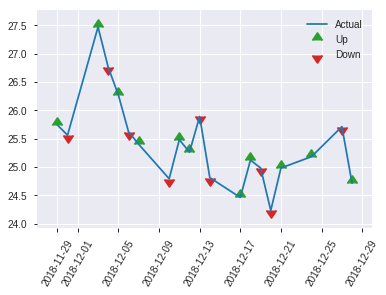


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.21238208459170949
RMSE: 0.4608493078997835
LogLoss: 0.6138905355390153
Null degrees of freedom: 250
Residual degrees of freedom: 87
Null deviance: 353.51374206928267
Residual deviance: 308.17304884058575
AIC: 636.1730488405858
AUC: 0.7560380267214799
pr_auc: 0.6807841309804816
Gini: 0.5120760534429598
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4963989810288384: 


,0,1,Error,Rate
0,78.0,61.0,0.4388,(61.0/139.0)
1,18.0,94.0,0.1607,(18.0/112.0)
Total,96.0,155.0,0.3147,(79.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4963990,0.7041199,154.0
max f2,0.3221171,0.8245877,218.0
max f0point5,0.6257848,0.6774809,102.0
max accuracy,0.6257848,0.7091633,102.0
max precision,0.9137560,1.0,0.0
max recall,0.2121153,1.0,240.0
max specificity,0.9137560,1.0,0.0
max absolute_mcc,0.5563873,0.4189197,131.0
max min_per_class_accuracy,0.5803080,0.6978417,120.0
max mean_per_class_accuracy,0.5563873,0.7103995,131.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 55.33 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.9008473,2.2410714,2.2410714,1.0,0.9091622,1.0,0.9091622,0.0267857,0.0267857,124.1071429,124.1071429
,2,0.0239044,0.8643889,1.4940476,1.8675595,0.6666667,0.8818856,0.8333333,0.8955239,0.0178571,0.0446429,49.4047619,86.7559524
,3,0.0318725,0.8548458,1.1205357,1.6808036,0.5,0.8577610,0.75,0.8860832,0.0089286,0.0535714,12.0535714,68.0803571
,4,0.0438247,0.8466498,2.2410714,1.8336039,1.0,0.8498638,0.8181818,0.8762052,0.0267857,0.0803571,124.1071429,83.3603896
,5,0.0517928,0.8399859,1.1205357,1.7239011,0.5,0.8409853,0.7692308,0.8707867,0.0089286,0.0892857,12.0535714,72.3901099
,6,0.1035857,0.7889725,1.3791209,1.5515110,0.6153846,0.8125951,0.6923077,0.8416909,0.0714286,0.1607143,37.9120879,55.1510989
,7,0.1513944,0.7483935,2.0543155,1.7102914,0.9166667,0.7648787,0.7631579,0.8174344,0.0982143,0.2589286,105.4315476,71.0291353
,8,0.2031873,0.7094400,1.5515110,1.6698179,0.6923077,0.7294246,0.7450980,0.7950005,0.0803571,0.3392857,55.1510989,66.9817927
,9,0.3027888,0.6768103,1.3446429,1.5628524,0.6,0.6929392,0.6973684,0.7614277,0.1339286,0.4732143,34.4642857,56.2852444
,10,0.4023904,0.6295644,1.4342857,1.5310290,0.64,0.6540812,0.6831683,0.7348568,0.1428571,0.6160714,43.4285714,53.1028996


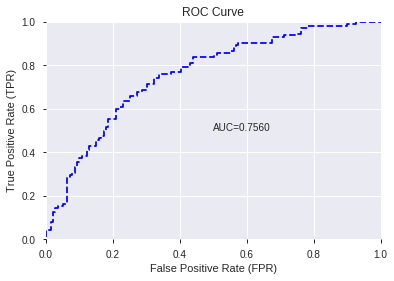

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


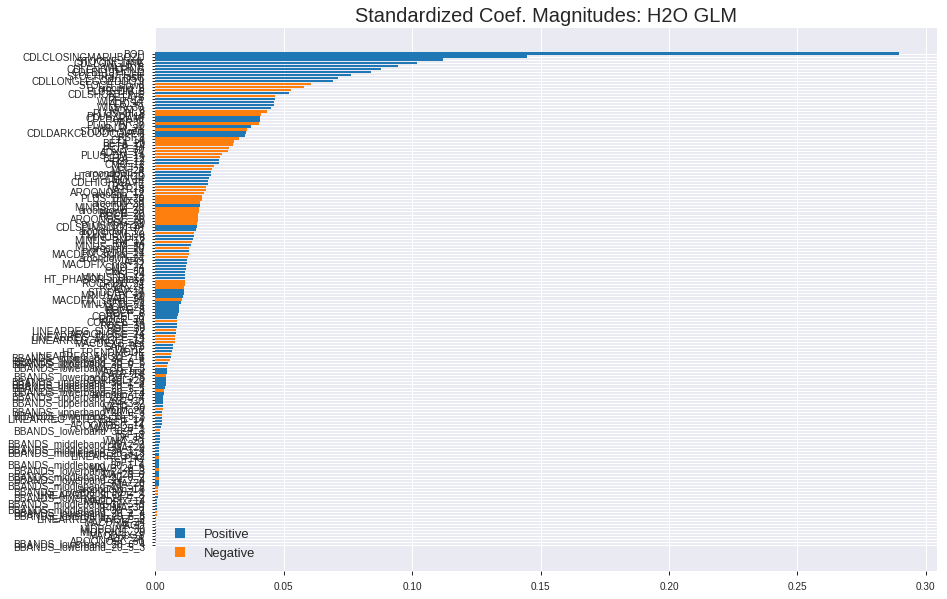

'log_likelihood'
--2019-08-27 20:30:01--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.131.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.131.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


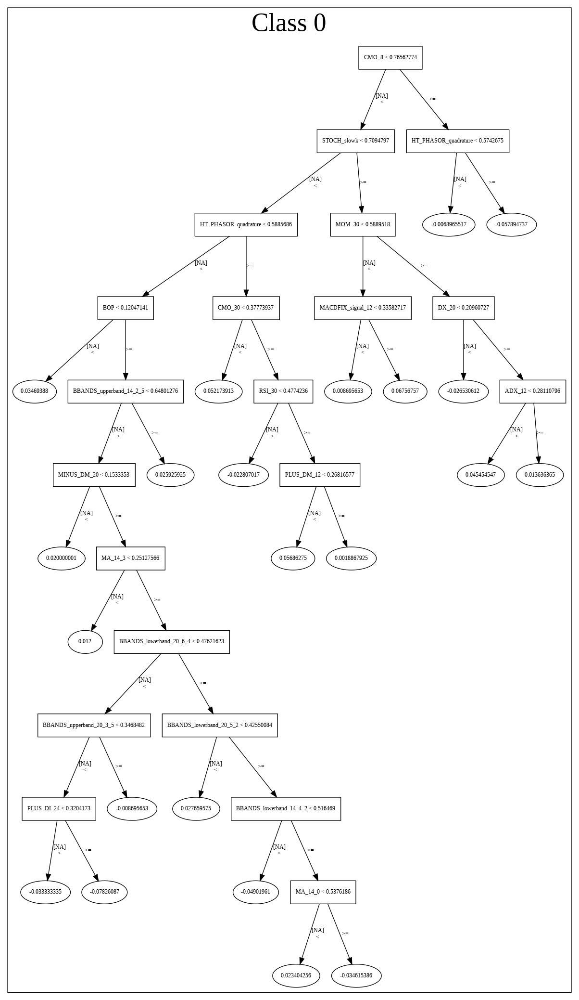

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190827_202952_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190827_202952_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['BOP',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastk',
 'CDLLONGLINE',
 'WILLR_8',
 'CDLENGULFING',
 'CDLBELTHOLD',
 'STOCHRSI_fastk',
 'ULTOSC',
 'CDLLONGLEGGEDDOJI',
 'STOCH_slowd',
 'aroonup_8',
 'PLUS_DM_8',
 'CDLSHORTLINE',
 'BETA_8',
 'WILLR_14',
 'ADOSC',
 'WILLR_30',
 'MOM_8',
 'PLUS_DI_8',
 'PLUS_DI_14',
 'CDLHARAMI',
 'VAR_8',
 'PLUS_DI_30',
 'WILLR_24',
 'STOCH_slowk',
 'CDLDARKCLOUDCOVER',
 'RSI_8',
 'CCI_14',
 'BETA_20',
 'BETA_14',
 'CCI_30',
 'ADXR_14',
 'PLUS_DM_14',
 'BETA_12',
 'RSI_12',
 'CMO_12',
 'CCI_8',
 'MFI_24',
 'aroondown_8',
 'HT_DCPERIOD',
 'CMO_14',
 'CDLHIGHWAVE',
 'RSI_14',
 'NATR_8',
 'AROONOSC_12',
 'aroonup_12',
 'PLUS_DM_20',
 'TRIX_8',
 'aroonup_30',
 'MINUS_DM_20',
 'aroondown_30',
 'ROCR_20',
 'ROCP_20',
 'AROONOSC_20',
 'ROC_20',
 'PLUS_DM_24',
 'CDLSPINNINGTOP',
 'aroondown_12',
 'PLUS_DM_30',
 'MINUS_DI_8',
 'MINUS_DM_12',
 'DX_24',
 'MINUS_DM_30',
 'aroonup_20',
 'ROCR100_14',
 'MACDFIX_signal_24',
 'aroondown_24',
 'APO',
 'MACDFIX_hist_12',
 'CMO_2

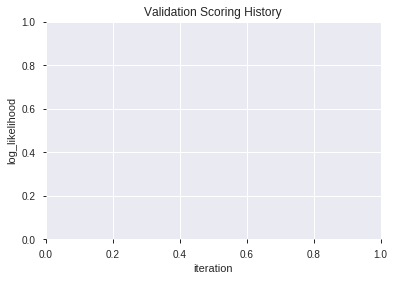

In [53]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190827_203007_model_7,0.750193,0.597398,0.299782,0.452645,0.204887
1,XGBoost_grid_1_AutoML_20190827_203007_model_4,0.747495,0.605684,0.289729,0.456610,0.208493
2,XGBoost_3_AutoML_20190827_203007,0.739851,0.608226,0.295446,0.457831,0.209609
3,XGBoost_grid_1_AutoML_20190827_203007_model_1,0.735355,0.609739,0.315294,0.459269,0.210928
4,XGBoost_1_AutoML_20190827_203007,0.733299,0.614844,0.312307,0.460750,0.212290
5,XGBoost_2_AutoML_20190827_203007,0.732785,0.615555,0.294450,0.460777,0.212315
6,XGBoost_grid_1_AutoML_20190827_203007_model_3,0.729702,0.616126,0.298176,0.461640,0.213111
7,XGBoost_grid_1_AutoML_20190827_203007_model_2,0.727582,0.612405,0.313560,0.459580,0.211214
8,XGBoost_grid_1_AutoML_20190827_203007_model_6,0.727261,0.615978,0.318763,0.461797,0.213256
9,XGBoost_grid_1_AutoML_20190827_203007_model_5,0.713258,0.635040,0.334886,0.469509,0.220439


,variable,relative_importance,scaled_importance,percentage
0,BOP,1892.467529,1.000000,0.180568
1,STOCHRSI_fastk,340.618378,0.179986,0.032500
2,STOCHF_fastk,327.362457,0.172982,0.031235
3,WILLR_8,252.418015,0.133380,0.024084
4,ULTOSC,238.228363,0.125882,0.022730
5,HT_DCPERIOD,201.322205,0.106381,0.019209
6,WILLR_14,181.853287,0.096093,0.017351
7,CCI_8,153.826385,0.081284,0.014677
8,CORREL_8,149.649612,0.079076,0.014279
9,STOCH_slowd,148.499390,0.078469,0.014169


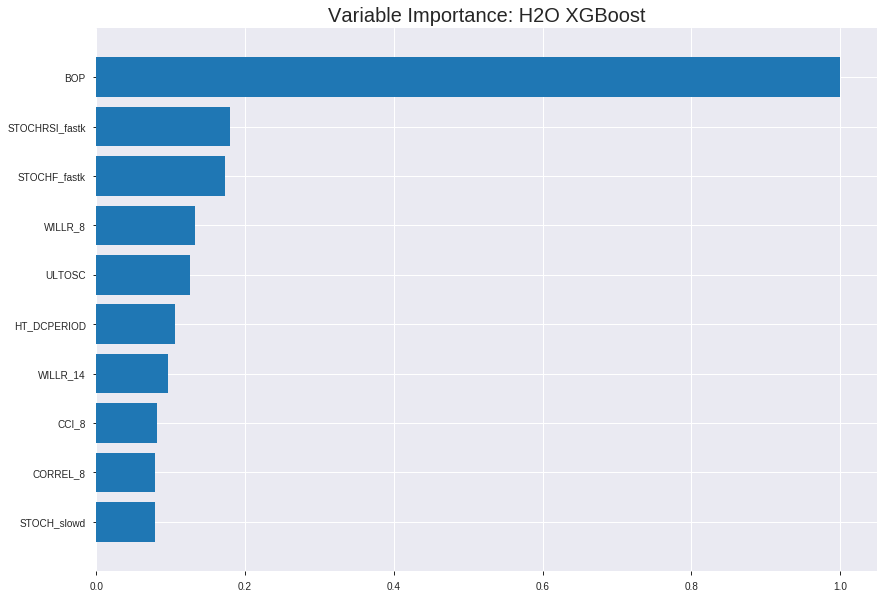

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190827_203007_model_7


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.10997870549415177
RMSE: 0.331630374806277
LogLoss: 0.3779377742020207
Mean Per-Class Error: 0.1160166529201524
AUC: 0.9583572260843382
pr_auc: 0.9655563687916247
Gini: 0.9167144521686763
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5427582561969757: 


,0,1,Error,Rate
0,719.0,91.0,0.1123,(91.0/810.0)
1,116.0,827.0,0.123,(116.0/943.0)
Total,835.0,918.0,0.1181,(207.0/1753.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5427583,0.8887695,195.0
max f2,0.3856119,0.9298565,261.0
max f0point5,0.6506774,0.9172521,149.0
max accuracy,0.5544074,0.8824872,190.0
max precision,0.9313835,1.0,0.0
max recall,0.1892639,1.0,348.0
max specificity,0.9313835,1.0,0.0
max absolute_mcc,0.5544074,0.7658889,190.0
max min_per_class_accuracy,0.5402499,0.8801697,196.0
max mean_per_class_accuracy,0.5544074,0.8839833,190.0


Gains/Lift Table: Avg response rate: 53.79 %, avg score: 53.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102681,0.9148435,1.8589608,1.8589608,1.0,0.9201486,1.0,0.9201486,0.0190880,0.0190880,85.8960764,85.8960764
,2,0.0205362,0.9043038,1.8589608,1.8589608,1.0,0.9108608,1.0,0.9155047,0.0190880,0.0381760,85.8960764,85.8960764
,3,0.0302339,0.8963466,1.8589608,1.8589608,1.0,0.9006014,1.0,0.9107244,0.0180276,0.0562036,85.8960764,85.8960764
,4,0.0405020,0.8882222,1.8589608,1.8589608,1.0,0.8924764,1.0,0.9060981,0.0190880,0.0752916,85.8960764,85.8960764
,5,0.0501997,0.8830701,1.8589608,1.8589608,1.0,0.8853458,1.0,0.9020892,0.0180276,0.0933192,85.8960764,85.8960764
,6,0.1003993,0.8505334,1.8589608,1.8589608,1.0,0.8652365,1.0,0.8836629,0.0933192,0.1866384,85.8960764,85.8960764
,7,0.1500285,0.8222567,1.8589608,1.8589608,1.0,0.8362525,1.0,0.8679796,0.0922587,0.2788971,85.8960764,85.8960764
,8,0.2002282,0.7928671,1.8589608,1.8589608,1.0,0.8085420,1.0,0.8530779,0.0933192,0.3722163,85.8960764,85.8960764
,9,0.3000570,0.7379245,1.8377155,1.8518925,0.9885714,0.7675985,0.9961977,0.8246389,0.1834571,0.5556734,83.7715498,85.1892472
,10,0.3998859,0.6646927,1.6996213,1.8138790,0.9142857,0.7059926,0.9757489,0.7950196,0.1696713,0.7253446,69.9621270,81.3878976




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2118253037786506
RMSE: 0.4602448302573866
LogLoss: 0.6151930261178745
Mean Per-Class Error: 0.31444707160430707
AUC: 0.721874301051219
pr_auc: 0.6913416487791141
Gini: 0.44374860210243794
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3796505033969879: 


,0,1,Error,Rate
0,102.0,136.0,0.5714,(136.0/238.0)
1,29.0,234.0,0.1103,(29.0/263.0)
Total,131.0,370.0,0.3293,(165.0/501.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3796505,0.7393365,288.0
max f2,0.1525027,0.8539765,383.0
max f0point5,0.4914731,0.6960323,237.0
max accuracy,0.4914731,0.6906188,237.0
max precision,0.8418533,0.8181818,18.0
max recall,0.1349926,1.0,391.0
max specificity,0.9094079,0.9957983,0.0
max absolute_mcc,0.4745162,0.3815091,243.0
max min_per_class_accuracy,0.5680351,0.6722689,197.0
max mean_per_class_accuracy,0.4914731,0.6855529,237.0


Gains/Lift Table: Avg response rate: 52.50 %, avg score: 53.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119760,0.8775362,1.2699620,1.2699620,0.6666667,0.8948364,0.6666667,0.8948364,0.0152091,0.0152091,26.9961977,26.9961977
,2,0.0219561,0.8649787,1.1429658,1.2122364,0.6,0.8717857,0.6363636,0.8843588,0.0114068,0.0266160,14.2965779,21.2236433
,3,0.0319361,0.8495923,1.9049430,1.4287072,1.0,0.8545690,0.75,0.8750495,0.0190114,0.0456274,90.4942966,42.8707224
,4,0.0419162,0.8419088,1.9049430,1.5420967,1.0,0.8453181,0.8095238,0.8679706,0.0190114,0.0646388,90.4942966,54.2096687
,5,0.0518962,0.8377001,1.1429658,1.4653407,0.6,0.8394620,0.7692308,0.8624882,0.0114068,0.0760456,14.2965779,46.5340743
,6,0.1017964,0.8039355,1.2953612,1.3820174,0.68,0.8169837,0.7254902,0.8401821,0.0646388,0.1406844,29.5361217,38.2017446
,7,0.1516966,0.7769042,1.3715589,1.3785771,0.72,0.7887390,0.7236842,0.8232600,0.0684411,0.2091255,37.1558935,37.8577146
,8,0.2015968,0.7451946,1.4477567,1.3957008,0.76,0.7597555,0.7326733,0.8075411,0.0722433,0.2813688,44.7756654,39.5700787
,9,0.3013972,0.6736183,1.3715589,1.3877068,0.72,0.7068530,0.7284768,0.7742006,0.1368821,0.4182510,37.1558935,38.7706796
,10,0.4011976,0.6207754,1.2572624,1.3552579,0.66,0.6455165,0.7114428,0.7421897,0.1254753,0.5437262,25.7262357,35.5257931



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-27 20:30:26,11.871 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4620650,0.5,0.6931472,0.5,0.0,1.0,0.4750499
,2019-08-27 20:30:26,12.129 sec,5.0,0.4657733,0.6265474,0.8654046,0.8760976,1.8589608,0.2236167,0.4847074,0.6628499,0.7015049,0.6910040,1.5874525,0.3852295
,2019-08-27 20:30:26,12.234 sec,10.0,0.4391714,0.5764512,0.8911256,0.9057393,1.8589608,0.1939532,0.4742029,0.6420801,0.7119452,0.6930502,1.5874525,0.3333333
,2019-08-27 20:30:26,12.344 sec,15.0,0.4179654,0.5369362,0.9060184,0.9216686,1.8589608,0.1871078,0.4701660,0.6338316,0.7110586,0.6901505,1.2699620,0.3512974
,2019-08-27 20:30:26,12.456 sec,20.0,0.3997321,0.5030399,0.9174947,0.9312700,1.8589608,0.1751284,0.4655186,0.6242236,0.7170096,0.7080824,1.9049430,0.3273453
,2019-08-27 20:30:26,12.563 sec,25.0,0.3848895,0.4755512,0.9274852,0.9403833,1.8589608,0.1694238,0.4636201,0.6202649,0.7173371,0.6967442,1.5874525,0.3353293
,2019-08-27 20:30:27,12.685 sec,30.0,0.3715701,0.4510932,0.9363176,0.9477885,1.8589608,0.1557330,0.4617566,0.6165953,0.7193581,0.6905945,1.5874525,0.3273453
,2019-08-27 20:30:27,12.780 sec,35.0,0.3617671,0.4327256,0.9414038,0.9519029,1.8589608,0.1403309,0.4614510,0.6160725,0.7180321,0.6808184,1.2699620,0.3153693
,2019-08-27 20:30:27,12.882 sec,40.0,0.3529229,0.4163738,0.9465627,0.9530098,1.8589608,0.1397604,0.4596275,0.6124085,0.7214989,0.6906383,1.2699620,0.3113772
,2019-08-27 20:30:27,12.973 sec,45.0,0.3463829,0.4042752,0.9498678,0.9552644,1.8589608,0.1363377,0.4600386,0.6137855,0.7217705,0.6911643,1.2699620,0.3193613


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1892.4675293,1.0,0.1805682
STOCHRSI_fastk,340.6183777,0.1799864,0.0324998
STOCHF_fastk,327.3624573,0.1729818,0.0312350
WILLR_8,252.4180145,0.1333804,0.0240843
ULTOSC,238.2283630,0.1258824,0.0227304
---,---,---,---
MAVP_20_6,3.5901566,0.0018971,0.0003426
BBANDS_upperband_24_3_2,3.5469885,0.0018743,0.0003384
BBANDS_lowerband_24_7_4,3.2278042,0.0017056,0.0003080
BBANDS_lowerband_30_1_3,0.4982262,0.0002633,0.0000475



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6972111553784861)

('F1', 0.7041198501872659)

('auc', 0.7501927029804727)

('logloss', 0.5973976638823595)

('mean_per_class_error', 0.29978160328879755)

('rmse', 0.4526448519122333)

('mse', 0.20488736196264762)

xgboost prediction progress: |████████████████████████████████████████████| 100%


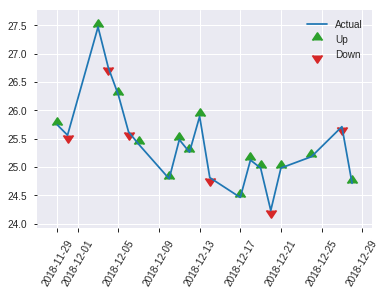


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20488736196264762
RMSE: 0.4526448519122333
LogLoss: 0.5973976638823595
Mean Per-Class Error: 0.29978160328879755
AUC: 0.7501927029804727
pr_auc: 0.6593225925499536
Gini: 0.5003854059609454
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4263169467449188: 


,0,1,Error,Rate
0,78.0,61.0,0.4388,(61.0/139.0)
1,18.0,94.0,0.1607,(18.0/112.0)
Total,96.0,155.0,0.3147,(79.0/251.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4263169,0.7041199,154.0
max f2,0.3292249,0.8267717,186.0
max f0point5,0.6494194,0.6666667,76.0
max accuracy,0.5915168,0.6972112,105.0
max precision,0.8744029,1.0,0.0
max recall,0.1489552,1.0,249.0
max specificity,0.8744029,1.0,0.0
max absolute_mcc,0.4263169,0.4095896,154.0
max min_per_class_accuracy,0.5614588,0.6696429,118.0
max mean_per_class_accuracy,0.4263169,0.7002184,154.0


Gains/Lift Table: Avg response rate: 44.62 %, avg score: 50.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0119522,0.8429196,1.4940476,1.4940476,0.6666667,0.8603249,0.6666667,0.8603249,0.0178571,0.0178571,49.4047619,49.4047619
,2,0.0239044,0.8288426,1.4940476,1.4940476,0.6666667,0.8323108,0.6666667,0.8463178,0.0178571,0.0357143,49.4047619,49.4047619
,3,0.0318725,0.8019234,2.2410714,1.6808036,1.0,0.8182648,0.75,0.8393046,0.0178571,0.0535714,124.1071429,68.0803571
,4,0.0438247,0.7939299,1.4940476,1.6298701,0.6666667,0.7942683,0.7272727,0.8270220,0.0178571,0.0714286,49.4047619,62.9870130
,5,0.0517928,0.7861303,1.1205357,1.5515110,0.5,0.7897692,0.6923077,0.8212908,0.0089286,0.0803571,12.0535714,55.1510989
,6,0.1035857,0.7626205,1.8962912,1.7239011,0.8461538,0.7732048,0.7692308,0.7972478,0.0982143,0.1785714,89.6291209,72.3901099
,7,0.1513944,0.7231433,1.3072917,1.5923402,0.5833333,0.7415914,0.7105263,0.7796721,0.0625,0.2410714,30.7291667,59.2340226
,8,0.2031873,0.7008706,1.5515110,1.5819328,0.6923077,0.7094244,0.7058824,0.7617658,0.0803571,0.3214286,55.1510989,58.1932773
,9,0.3027888,0.6497347,1.7032143,1.6218280,0.76,0.6758056,0.7236842,0.7334894,0.1696429,0.4910714,70.3214286,62.1828008
,10,0.4023904,0.5989730,1.0757143,1.4866513,0.48,0.6193798,0.6633663,0.7052445,0.1071429,0.5982143,7.5714286,48.6651344


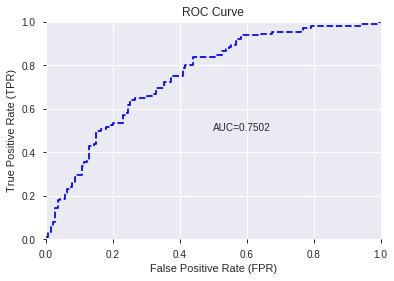

This function is available for GLM models only


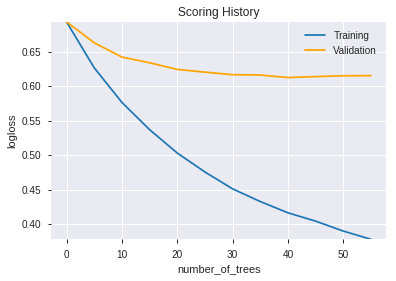

--2019-08-27 20:30:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.22.51
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.22.51|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.

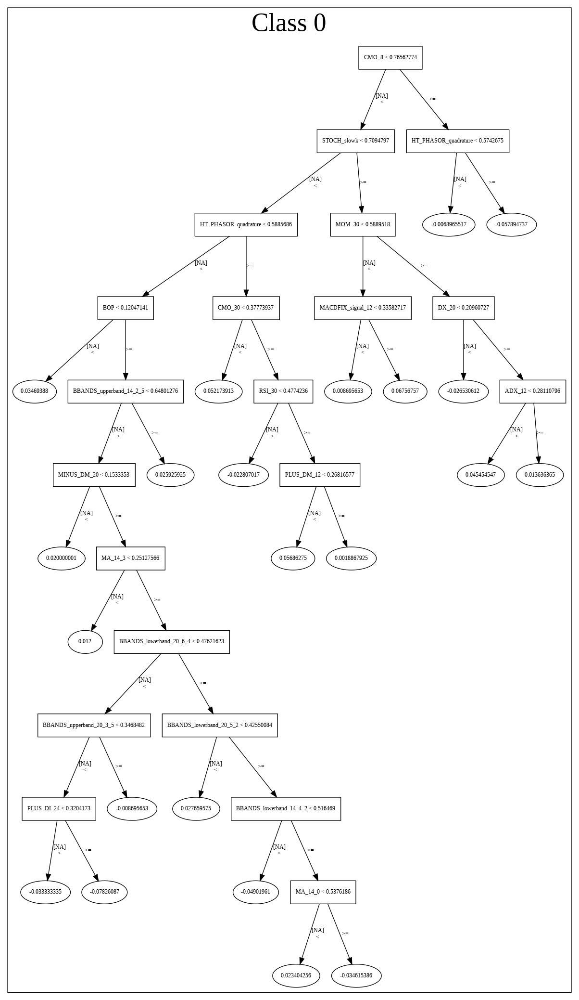

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190827_203007_model_7',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190827_203007_model_7',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_ae73',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['BOP',
 'STOCHRSI_fastk',
 'STOCHF_fastk',
 'WILLR_8',
 'ULTOSC',
 'HT_DCPERIOD',
 'WILLR_14',
 'CCI_8',
 'CORREL_8',
 'STOCH_slowd',
 'WILLR_24',
 'BETA_20',
 'BETA_12',
 'STOCH_slowk',
 'VAR_8',
 'MFI_24',
 'CORREL_14',
 'BETA_8',
 'NATR_8',
 'CORREL_20',
 'ADXR_14',
 'CCI_14',
 'ADOSC',
 'ADX_8',
 'MINUS_DI_8',
 'PLUS_DM_8',
 'MOM_20',
 'BETA_14',
 'STDDEV_14',
 'ROCP_8',
 'HT_PHASOR_inphase',
 'PLUS_DM_20',
 'aroonup_8',
 'CCI_30',
 'ROCR100_14',
 'MOM_8',
 'APO',
 'aroonup_12',
 'MACDFIX_hist_12',
 'MINUS_DM_12',
 'LINEARREG_ANGLE_8',
 'LINEARREG_ANGLE_14',
 'PLUS_DI_8',
 'ADX_24',
 'MACDFIX_signal_24',
 'MACDEXT_hist',
 'ROCR_12',
 'CDLSHORTLINE',
 'CDLSPINNINGTOP',
 'DX_24',
 'PLUS_DI_30',
 'RSI_8',
 'DX_12',
 'MOM_24',
 'aroonup_14',
 'MINUS_DI_20',
 'ROC_30',
 'MACD_hist',
 'PLUS_DM_24',
 'ROC_20',
 'ATR_30',
 'DX_14',
 'MACDFIX_8',
 'ATR_14',
 'aroonup_20',
 'LINEARREG_ANGLE_12',
 'MINUS_DI_12',
 'aroondown_14',
 'aroondown_30',
 'CMO_30',
 'PPO',
 'PLUS_DI_14',
 'CDLCLOSING

In [54]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [55]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.709
GLM             0.709
XGBoost         0.721
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.625,0.570,0.705
DLF,0.705,0.701,0.721
Fwe,0.709,0.701,0.709
RFE,0.701,0.709,0.697
XGBF,0.705,0.701,0.721






F1


DeepLearning    0.730
GLM             0.714
XGBoost         0.725
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.671,0.617,0.716
DLF,0.705,0.714,0.724
Fwe,0.730,0.711,0.725
RFE,0.693,0.704,0.704
XGBF,0.723,0.714,0.724






auc


DeepLearning    0.761
GLM             0.756
XGBoost         0.766
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.654,0.496,0.754
DLF,0.761,0.754,0.757
Fwe,0.754,0.749,0.766
RFE,0.750,0.756,0.750
XGBF,0.758,0.754,0.757






logloss


DeepLearning    0.700
GLM             3.254
XGBoost         0.604
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.642,3.254,0.604
DLF,0.610,0.594,0.586
Fwe,0.653,0.616,0.591
RFE,0.623,0.614,0.597
XGBF,0.700,0.594,0.586






mean_per_class_error


DeepLearning    0.353
GLM             0.460
XGBoost         0.300
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.353,0.460,0.284
DLF,0.298,0.296,0.269
Fwe,0.282,0.292,0.276
RFE,0.297,0.290,0.300
XGBF,0.285,0.296,0.269






rmse


DeepLearning    0.491
GLM             0.551
XGBoost         0.455
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.475,0.551,0.455
DLF,0.457,0.450,0.447
Fwe,0.474,0.459,0.450
RFE,0.466,0.461,0.453
XGBF,0.491,0.450,0.447






mse


DeepLearning    0.241
GLM             0.304
XGBoost         0.207
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.226,0.304,0.207
DLF,0.209,0.202,0.200
Fwe,0.224,0.211,0.202
RFE,0.217,0.212,0.205
XGBF,0.241,0.202,0.200


{'F1':       DeepLearning    GLM  XGBoost
 All          0.671    NaN      NaN
 DLF          0.705    NaN      NaN
 DLF            NaN  0.714      NaN
 DLF            NaN    NaN    0.724
 All            NaN  0.617      NaN
 All            NaN    NaN    0.716
 XGBF         0.723    NaN      NaN
 XGBF           NaN  0.714      NaN
 XGBF           NaN    NaN    0.724
 Fwe          0.730    NaN      NaN
 Fwe            NaN  0.711      NaN
 Fwe            NaN    NaN    0.725
 RFE          0.693    NaN      NaN
 RFE            NaN  0.704      NaN
 RFE            NaN    NaN    0.704,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.625    NaN      NaN
 DLF          0.705    NaN      NaN
 DLF            NaN  0.701      NaN
 DLF            NaN    NaN    0.721
 All            NaN  0.570      NaN
 All            NaN    NaN    0.705
 XGBF         0.705    NaN      NaN
 XGBF           NaN  0.701      NaN
 XGBF           NaN    NaN    0.721
 Fwe          0.709    NaN      NaN
 Fwe     